<a href="https://colab.research.google.com/github/Areeba-28Faisal/Projects/blob/main/Stock_Market_Predictions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stock Market Prediction

the first thing we have to do for stock prices prediction is load the dataset and arrange it so that it can be fed into the models respectively.

In [ ]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from datetime import datetime
import os
import plotly.graph_objects as go
import plotly.express as ex
import plotly.figure_factory as ff
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.neighbors import LocalOutlierFactor
import webbrowser
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from prophet import Prophet
from pmdarima import auto_arima,arima
from plotly.subplots import make_subplots

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = pd.read_csv("/content/drive/MyDrive/NIFTY50_all.csv")
#nifty_df = pd.read_csv("../input/nifty-indices-dataset/NIFTY BANK.csv", index_col='Date', parse_dates=['Date'
data.head(5)

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2007-11-27,MUNDRAPORT,EQ,440.00,770.00,1050.00,770.0,959.0,962.90,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
1,2007-11-28,MUNDRAPORT,EQ,962.90,984.00,990.00,874.0,885.0,893.90,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172
2,2007-11-29,MUNDRAPORT,EQ,893.90,909.00,914.75,841.0,887.0,884.20,888.09,5124121,4.550658e+14,NaN,1069678.0,0.2088
3,2007-11-30,MUNDRAPORT,EQ,884.20,890.00,958.00,890.0,929.0,921.55,929.17,4609762,4.283257e+14,NaN,1260913.0,0.2735
4,2007-12-03,MUNDRAPORT,EQ,921.55,939.75,995.00,922.0,980.0,969.30,965.65,2977470,2.875200e+14,NaN,816123.0,0.2741


In [ ]:
cols=[]
for i in data['Symbol']:
  if i not in cols:
    cols.append(i)
    print(i)
print(len(cols))

MUNDRAPORT
ADANIPORTS
ASIANPAINT
UTIBANK
AXISBANK
BAJAJ-AUTO
BAJAJFINSV
BAJAUTOFIN
BAJFINANCE
BHARTI
BHARTIARTL
BPCL
BRITANNIA
CIPLA
COALINDIA
DRREDDY
EICHERMOT
GAIL
GRASIM
HCLTECH
HDFC
HDFCBANK
HEROHONDA
HEROMOTOCO
HINDALC0
HINDALCO
HINDLEVER
HINDUNILVR
ICICIBANK
INDUSINDBK
INFOSYSTCH
INFY
IOC
ITC
JSWSTL
JSWSTEEL
KOTAKMAH
KOTAKBANK
LT
M&M
MARUTI
NESTLEIND
NTPC
ONGC
POWERGRID
RELIANCE
SBIN
SHREECEM
SUNPHARMA
TELCO
TATAMOTORS
TISCO
TATASTEEL
TCS
TECHM
TITAN
ULTRACEMCO
UNIPHOS
UPL
SESAGOA
SSLT
VEDL
WIPRO
ZEETELE
ZEEL
65


In [ ]:
data['Date'] = pd.to_datetime(data['Date'] )

In [ ]:
data.set_index('Date',inplace=True)

In [ ]:
data.loc[data['Symbol'] == 'MUNDRAPORT','Symbol'] = 'ADANIPORTS'
data.loc[data['Symbol'] == 'BAJAUTOFIN','Symbol'] = 'BAJFINANCE'
data.loc[data['Symbol'] == 'HINDALC0','Symbol'] = 'HINDALCO'
data.loc[data['Symbol'] == 'KOTAKMAH','Symbol'] = 'KOTAKBANK'
data.loc[data['Symbol'] == 'UTIBANK','Symbol'] = 'AXISBANK'
data.loc[data['Symbol'] == 'ZEETELE','Symbol'] = 'ZEEL'
data.loc[data['Symbol'] == 'INFOSYSTCH','Symbol'] = 'INFY'
data.loc[data['Symbol'] == 'BHARTI','Symbol'] = 'BHARTIARTL'
data.loc[data['Symbol'] == 'SESAGOA','Symbol'] = 'VEDL'
data.loc[data['Symbol'] == 'HEROHONDA','Symbol'] = 'HEROMOTOCO'
data.loc[data['Symbol'] == 'TELCO','Symbol'] = 'TATAMOTORS'
data.loc[data['Symbol'] == 'TISCO','Symbol'] = 'TATASTEEL'
data.loc[data['Symbol'] == 'HINDLEVER','Symbol'] = 'HINDUNILVR'
data.loc[data['Symbol'] == 'JSWSTL','Symbol'] = 'JSWSTEEL'
data.loc[data['Symbol'] == 'SSLT','Symbol'] = 'VEDL'

In [ ]:
data.head()

,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
Date,,,,,,,,,,,,,,
2007-11-27,ADANIPORTS,EQ,440.00,770.00,1050.00,770.0,959.0,962.90,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
2007-11-28,ADANIPORTS,EQ,962.90,984.00,990.00,874.0,885.0,893.90,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172
2007-11-29,ADANIPORTS,EQ,893.90,909.00,914.75,841.0,887.0,884.20,888.09,5124121,4.550658e+14,NaN,1069678.0,0.2088
2007-11-30,ADANIPORTS,EQ,884.20,890.00,958.00,890.0,929.0,921.55,929.17,4609762,4.283257e+14,NaN,1260913.0,0.2735
2007-12-03,ADANIPORTS,EQ,921.55,939.75,995.00,922.0,980.0,969.30,965.65,2977470,2.875200e+14,NaN,816123.0,0.2741


In [ ]:
len(data['Symbol'].unique())

50

In [ ]:
df = pd.DataFrame()
for name in data['Symbol'].unique():
    df.loc[:,name] = data[data['Symbol'] == name]['Close']

In [ ]:
df.head()

,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,CIPLA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
Date,,,,,,,,,,,,,,,,,,,,,
2007-11-27,962.90,998.15,932.10,NaN,NaN,317.30,915.85,406.90,1516.45,183.60,...,848.90,995.95,1040.00,1530.50,1000.65,337.10,NaN,3386.95,457.80,299.60
2007-11-28,893.90,1006.45,905.70,NaN,NaN,321.55,910.05,384.50,1482.90,182.85,...,816.60,976.50,1035.45,1471.35,989.10,334.80,NaN,3332.45,449.75,292.75
2007-11-29,884.20,998.10,918.85,NaN,NaN,322.75,914.75,382.30,1493.35,182.00,...,798.25,966.05,986.15,1463.40,976.85,334.10,NaN,3260.70,448.10,281.25
2007-11-30,921.55,990.00,930.65,NaN,NaN,330.35,939.50,386.35,1492.35,183.10,...,825.90,1012.20,1026.70,1534.25,984.25,342.95,NaN,3450.70,460.65,287.90
2007-12-03,969.30,986.60,942.35,NaN,NaN,332.90,923.95,402.85,1468.10,185.25,...,842.20,1049.90,1058.15,1548.65,999.15,344.20,NaN,3500.65,492.10,303.80


In [ ]:
df.isnull().sum()

ADANIPORTS       0
ASIANPAINT       0
AXISBANK         0
BAJAJ-AUTO     120
BAJAJFINSV     121
BAJFINANCE       1
BHARTIARTL       0
BPCL             0
BRITANNIA        1
CIPLA            0
COALINDIA      724
DRREDDY          0
EICHERMOT        0
GAIL             0
GRASIM           0
HCLTECH          0
HDFC             0
HDFCBANK         0
HEROMOTOCO       0
HINDALCO         0
HINDUNILVR       0
ICICIBANK        0
INDUSINDBK       0
INFY             0
IOC              0
ITC              0
JSWSTEEL         0
KOTAKBANK        0
LT               0
M&M              0
MARUTI           0
NESTLEIND      516
NTPC             0
ONGC             0
POWERGRID        0
RELIANCE         0
SBIN             0
SHREECEM         0
SUNPHARMA        0
TATAMOTORS       0
TATASTEEL        0
TCS              0
TECHM            0
TITAN            0
ULTRACEMCO       0
UNIPHOS       1858
UPL           1464
VEDL             0
WIPRO            0
ZEEL             0
dtype: int64

In [ ]:
df['BAJAJ-AUTO'] = df['BAJAJ-AUTO'].fillna(method='bfill')
df['BAJAJFINSV'] = df['BAJAJFINSV'].fillna(method='bfill')
df['COALINDIA'] = df['COALINDIA'].fillna(method='bfill')
df['NESTLEIND'] = df['NESTLEIND'].fillna(method='bfill')
df['BAJFINANCE'] = df['BAJFINANCE'].fillna(method='bfill')
df['BRITANNIA'] = df['BRITANNIA'].fillna(method='bfill')
df['TCS'] = df['TCS'].fillna(method='ffill')
df['UNIPHOS'] = df['UNIPHOS'].fillna(method='ffill')
df['UPL'] = df['UPL'].fillna(method='bfill')


In [ ]:
df.isnull().sum()

ADANIPORTS    0
ASIANPAINT    0
AXISBANK      0
BAJAJ-AUTO    0
BAJAJFINSV    0
BAJFINANCE    0
BHARTIARTL    0
BPCL          0
BRITANNIA     0
CIPLA         0
COALINDIA     0
DRREDDY       0
EICHERMOT     0
GAIL          0
GRASIM        0
HCLTECH       0
HDFC          0
HDFCBANK      0
HEROMOTOCO    0
HINDALCO      0
HINDUNILVR    0
ICICIBANK     0
INDUSINDBK    0
INFY          0
IOC           0
ITC           0
JSWSTEEL      0
KOTAKBANK     0
LT            0
M&M           0
MARUTI        0
NESTLEIND     0
NTPC          0
ONGC          0
POWERGRID     0
RELIANCE      0
SBIN          0
SHREECEM      0
SUNPHARMA     0
TATAMOTORS    0
TATASTEEL     0
TCS           0
TECHM         0
TITAN         0
ULTRACEMCO    0
UNIPHOS       0
UPL           0
VEDL          0
WIPRO         0
ZEEL          0
dtype: int64

In [ ]:
df.tail(5)


,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,CIPLA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
Date,,,,,,,,,,,,,,,,,,,,,
2021-04-26,730.75,2557.90,700.45,3738.85,10001.75,4736.55,527.55,418.90,3539.20,905.40,...,940.75,3100.80,962.20,1479.85,6275.90,157.8,590.65,236.65,480.30,186.40
2021-04-27,749.15,2574.35,699.55,3785.50,10091.35,4865.05,534.30,420.35,3541.20,912.40,...,977.75,3132.00,969.25,1495.10,6326.80,157.8,597.45,243.35,485.05,188.15
2021-04-28,746.25,2614.55,708.15,3889.75,10489.30,5280.90,544.30,417.50,3478.75,910.20,...,971.40,3124.10,977.40,1508.85,6360.80,157.8,608.05,243.90,489.30,189.10
2021-04-29,746.75,2613.45,719.40,3836.45,11176.55,5484.85,540.85,419.55,3468.90,906.50,...,1031.35,3115.25,976.90,1506.80,6382.45,157.8,615.80,255.05,489.85,186.55
2021-04-30,730.05,2536.40,714.90,3833.75,11041.65,5451.90,536.75,421.80,3449.00,910.35,...,1034.00,3035.65,960.40,1491.65,6278.95,157.8,606.90,257.25,492.75,185.60


In [ ]:
df.index

DatetimeIndex(['2007-11-27', '2007-11-28', '2007-11-29', '2007-11-30',
               '2007-12-03', '2007-12-04', '2007-12-05', '2007-12-06',
               '2007-12-07', '2007-12-10',
               ...
               '2021-04-16', '2021-04-19', '2021-04-20', '2021-04-22',
               '2021-04-23', '2021-04-26', '2021-04-27', '2021-04-28',
               '2021-04-29', '2021-04-30'],
              dtype='datetime64[ns]', name='Date', length=3322, freq=None)

In [ ]:
df_2 =df.resample('M').mean()

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
color = sns.color_palette()
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

import plotly.offline
from plotly import tools
#py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX

# FBProphet using models

In [ ]:
df1 = df.reset_index()
df1.tail()


,Date,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
3317,2021-04-26,730.75,2557.90,700.45,3738.85,10001.75,4736.55,527.55,418.90,3539.20,...,940.75,3100.80,962.20,1479.85,6275.90,157.8,590.65,236.65,480.30,186.40
3318,2021-04-27,749.15,2574.35,699.55,3785.50,10091.35,4865.05,534.30,420.35,3541.20,...,977.75,3132.00,969.25,1495.10,6326.80,157.8,597.45,243.35,485.05,188.15
3319,2021-04-28,746.25,2614.55,708.15,3889.75,10489.30,5280.90,544.30,417.50,3478.75,...,971.40,3124.10,977.40,1508.85,6360.80,157.8,608.05,243.90,489.30,189.10
3320,2021-04-29,746.75,2613.45,719.40,3836.45,11176.55,5484.85,540.85,419.55,3468.90,...,1031.35,3115.25,976.90,1506.80,6382.45,157.8,615.80,255.05,489.85,186.55
3321,2021-04-30,730.05,2536.40,714.90,3833.75,11041.65,5451.90,536.75,421.80,3449.00,...,1034.00,3035.65,960.40,1491.65,6278.95,157.8,606.90,257.25,492.75,185.60


In [ ]:
for i in df.columns:
    fig = px.line(df1, x='Date', y=i, title=i+' stocks')

    fig.update_xaxes(
        rangeslider_visible=True,
        rangeselector=dict(
            buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="3y", step="year", stepmode="backward"),
            dict(count=3, label="5y", step="year", stepmode="backward"),
            dict(step="all")


            ])
        )
    )
    fig.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3322 entries, 0 to 3321
Data columns (total 51 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Date        3322 non-null   datetime64[ns]
 1   ADANIPORTS  3322 non-null   float64       
 2   ASIANPAINT  3322 non-null   float64       
 3   AXISBANK    3322 non-null   float64       
 4   BAJAJ-AUTO  3322 non-null   float64       
 5   BAJAJFINSV  3322 non-null   float64       
 6   BAJFINANCE  3322 non-null   float64       
 7   BHARTIARTL  3322 non-null   float64       
 8   BPCL        3322 non-null   float64       
 9   BRITANNIA   3322 non-null   float64       
 10  CIPLA       3322 non-null   float64       
 11  COALINDIA   3322 non-null   float64       
 12  DRREDDY     3322 non-null   float64       
 13  EICHERMOT   3322 non-null   float64       
 14  GAIL        3322 non-null   float64       
 15  GRASIM      3322 non-null   float64       
 16  HCLTECH     3322 non-nul

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/tqjznlgt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/2fpnyi2x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59078', 'data', 'file=/tmp/tmpkydmc_8p/tqjznlgt.json', 'init=/tmp/tmpkydmc_8p/2fpnyi2x.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelqkk9fged/prophet_model-20221107065404.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  419.517645  -66.543853  931.300522
3583 2021-08-19  419.147057  -47.824035  924.671171
3584 2021-08-20  418.104010  -66.194698  911.983590
3585 2021-08-21  417.753066  -60.866896  929.313487
3586 2021-08-22  450.773543  -24.218121  966.648899


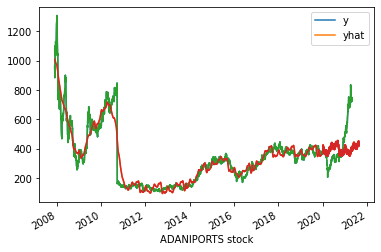

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/48771rxj.json


Results of sklearn.metrics:
MAE: 86.22841419009129
RMSE: 129.81838039745872
R-Squared: 0.14209182201202708 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/q5fka0qc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25056', 'data', 'file=/tmp/tmpkydmc_8p/48771rxj.json', 'init=/tmp/tmpkydmc_8p/q5fka0qc.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelcllo25wp/prophet_model-20221107065409.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1872.939742 -772.074460  4367.081825
3583 2021-08-19  1877.951228 -748.648884  4473.780019
3584 2021-08-20  1883.832522 -872.035991  4422.747732
3585 2021-08-21  1916.504390 -662.621090  4551.189710
3586 2021-08-22  1871.224668 -740.240593  4535.730258


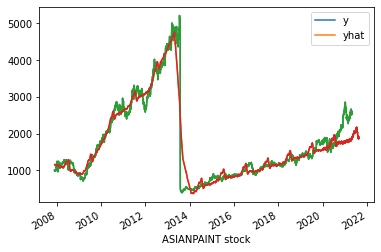

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/0lzslsat.json


Results of sklearn.metrics:
MAE: 232.44132264009593
RMSE: 314.787390026664
R-Squared: 0.2276429497677881 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/741jmc8l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73716', 'data', 'file=/tmp/tmpkydmc_8p/0lzslsat.json', 'init=/tmp/tmpkydmc_8p/741jmc8l.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelk_akd81v/prophet_model-20221107065414.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower   yhat_upper
3582 2021-08-18  856.521042  217.838474  1573.988816
3583 2021-08-19  857.975038  211.033657  1538.970421
3584 2021-08-20  860.760485  219.948098  1572.082337
3585 2021-08-21  875.813214  228.032805  1556.017369
3586 2021-08-22  835.285777  187.654973  1520.798479


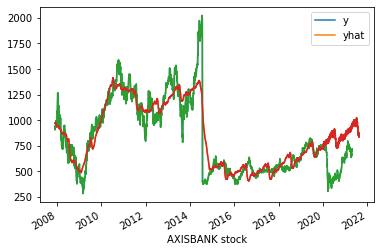

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/e0aua76j.json


Results of sklearn.metrics:
MAE: 305.4790310881922
RMSE: 342.2618562627114
R-Squared: -4.9481803974801215 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/75g3h6ed.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77010', 'data', 'file=/tmp/tmpkydmc_8p/e0aua76j.json', 'init=/tmp/tmpkydmc_8p/75g3h6ed.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modeleyfk9uw_/prophet_model-20221107065419.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  2835.905280  2009.257948  3633.219294
3583 2021-08-19  2839.431192  1930.760972  3652.853197
3584 2021-08-20  2841.950472  2016.944755  3660.245427
3585 2021-08-21  2804.483798  2011.363613  3637.382930
3586 2021-08-22  2952.729400  2091.174222  3800.947902


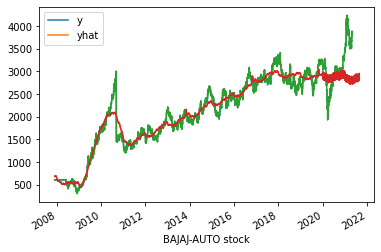

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/mqv4qx5u.json


Results of sklearn.metrics:
MAE: 440.67260798477196
RMSE: 560.626568902807
R-Squared: -0.4307479851485658 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/d7pqgisu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19141', 'data', 'file=/tmp/tmpkydmc_8p/mqv4qx5u.json', 'init=/tmp/tmpkydmc_8p/d7pqgisu.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelbn_6_1wb/prophet_model-20221107065424.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds          yhat    yhat_lower    yhat_upper
3582 2021-08-18  11057.881275  10444.267283  11589.257889
3583 2021-08-19  11074.580727  10454.551803  11584.419645
3584 2021-08-20  11072.298459  10450.252200  11571.185455
3585 2021-08-21  11106.115532  10535.230152  11661.380069
3586 2021-08-22  11223.853202  10541.083894  11759.440079


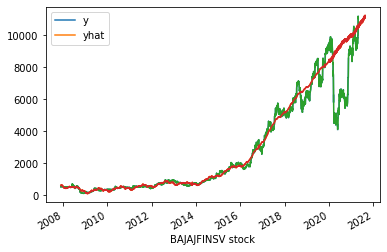

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/fb04nto7.json


Results of sklearn.metrics:
MAE: 2550.578054162268
RMSE: 3140.367503043809
R-Squared: -1.6598248152350248 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/bgu6z2pl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50474', 'data', 'file=/tmp/tmpkydmc_8p/fb04nto7.json', 'init=/tmp/tmpkydmc_8p/bgu6z2pl.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelef6t1y27/prophet_model-20221107065427.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  6242.416780  3522.235409  9261.000875
3583 2021-08-19  6240.384795  3598.937559  9381.400875
3584 2021-08-20  6252.488571  3244.551059  9156.446652
3585 2021-08-21  6326.616013  3299.226874  9351.687327
3586 2021-08-22  5747.220301  2828.181358  8704.518585


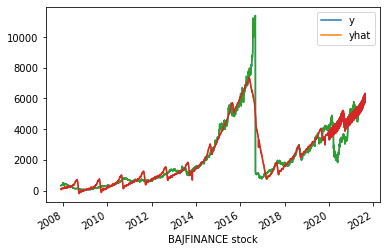

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/9ajla0p0.json


Results of sklearn.metrics:
MAE: 1241.4864961789776
RMSE: 1507.9664183320253
R-Squared: -1.0809487732642324 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/wnb7m9_g.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=93617', 'data', 'file=/tmp/tmpkydmc_8p/9ajla0p0.json', 'init=/tmp/tmpkydmc_8p/wnb7m9_g.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modellp95509d/prophet_model-20221107065431.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  287.988285   43.100009  535.158160
3583 2021-08-19  287.426543   45.510447  531.027743
3584 2021-08-20  285.728913   36.111526  540.093172
3585 2021-08-21  271.479920   19.684226  526.064896
3586 2021-08-22  312.010912   68.025921  560.326245


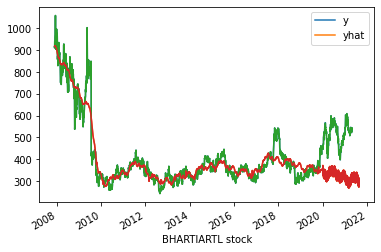

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/bbchtzmb.json


Results of sklearn.metrics:
MAE: 201.9579154949151
RMSE: 209.72092115373508
R-Squared: -15.148612648637833 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/9lpqas98.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=75699', 'data', 'file=/tmp/tmpkydmc_8p/bbchtzmb.json', 'init=/tmp/tmpkydmc_8p/9lpqas98.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modeldh88cu4a/prophet_model-20221107065435.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  202.174513  -52.182505  438.001788
3583 2021-08-19  202.234968  -56.789154  430.251378
3584 2021-08-20  201.102535  -39.699619  424.829259
3585 2021-08-21  204.921145  -45.542281  435.096351
3586 2021-08-22  246.463432  -10.210373  475.964729


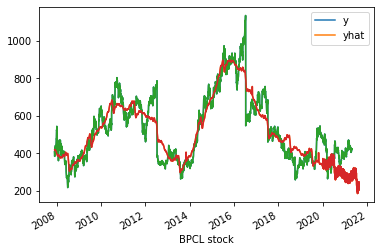

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/bijb7gwh.json


Results of sklearn.metrics:
MAE: 144.52023627489402
RMSE: 155.7971368467066
R-Squared: -7.4032364948479366 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/md08wtdv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80559', 'data', 'file=/tmp/tmpkydmc_8p/bijb7gwh.json', 'init=/tmp/tmpkydmc_8p/md08wtdv.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelxe1k8wwe/prophet_model-20221107065439.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  2405.949114  1198.228151  3613.265155
3583 2021-08-19  2397.797429  1099.199831  3596.435022
3584 2021-08-20  2407.467339  1140.925269  3694.277342
3585 2021-08-21  2507.071412  1220.979973  3667.744996
3586 2021-08-22  2342.151402  1151.223729  3469.263242


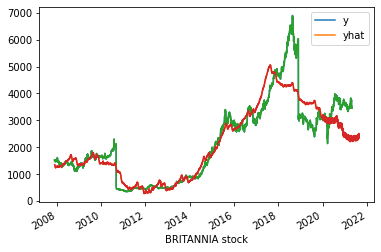

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/izppnzdx.json


Results of sklearn.metrics:
MAE: 926.6746549908614
RMSE: 1050.6177361863502
R-Squared: -8.469665047814923 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/5zb2ppf0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12912', 'data', 'file=/tmp/tmpkydmc_8p/izppnzdx.json', 'init=/tmp/tmpkydmc_8p/5zb2ppf0.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelj55amhdm/prophet_model-20221107065442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  423.050018  233.271787  618.531247
3583 2021-08-19  422.960536  234.335186  618.762279
3584 2021-08-20  423.357688  228.277325  619.953934
3585 2021-08-21  424.044039  226.929846  618.649390
3586 2021-08-22  410.037631  219.401225  594.881793


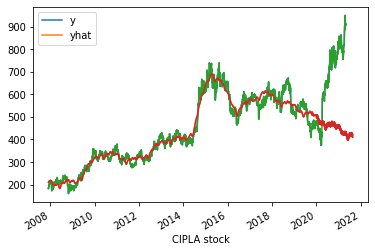

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/p5_1k6cl.json


Results of sklearn.metrics:
MAE: 231.3841489202409
RMSE: 278.65602042304556
R-Squared: -2.3236333992065856 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/2p2jpyx9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=98904', 'data', 'file=/tmp/tmpkydmc_8p/p5_1k6cl.json', 'init=/tmp/tmpkydmc_8p/2p2jpyx9.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model1jeo2ngk/prophet_model-20221107065446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  168.675255   89.996046  249.038258
3583 2021-08-19  168.745451   92.451316  251.346757
3584 2021-08-20  168.059656   95.784338  242.300806
3585 2021-08-21  165.276132   86.195275  243.085789
3586 2021-08-22  169.435563   91.126757  248.454433


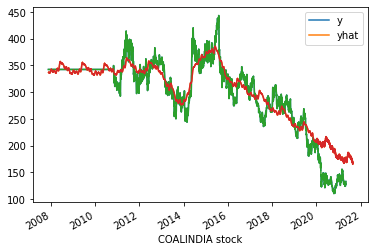

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/m85yn9cm.json


Results of sklearn.metrics:
MAE: 36.59464157435391
RMSE: 40.08077904144319
R-Squared: -1.2038309564132565 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/ugy9djyj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4035', 'data', 'file=/tmp/tmpkydmc_8p/m85yn9cm.json', 'init=/tmp/tmpkydmc_8p/ugy9djyj.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model4r8xmyx9/prophet_model-20221107065449.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  3031.629523  1795.501624  4341.994199
3583 2021-08-19  3035.260899  1819.324654  4372.378596
3584 2021-08-20  3037.541788  1804.206472  4366.780742
3585 2021-08-21  3091.017317  1927.752217  4381.548392
3586 2021-08-22  3095.792631  1830.169889  4418.344803


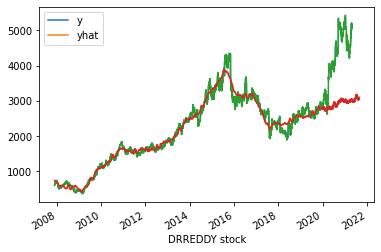

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/tl5xgnda.json


Results of sklearn.metrics:
MAE: 1156.478048639146
RMSE: 1381.7615617996016
R-Squared: -1.88291152219595 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/6uz1ax6h.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94770', 'data', 'file=/tmp/tmpkydmc_8p/tl5xgnda.json', 'init=/tmp/tmpkydmc_8p/6uz1ax6h.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelpgyduxe0/prophet_model-20221107065453.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower    yhat_upper
3582 2021-08-18  8661.730200  1193.482667  15521.828773
3583 2021-08-19  8660.241087  1618.670084  15554.570005
3584 2021-08-20  8657.329430  1490.383009  15553.168573
3585 2021-08-21  8649.027031  1378.425111  15661.490358
3586 2021-08-22  9582.754458  2592.584489  16690.818810


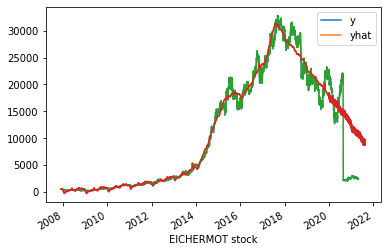

Results of sklearn.metrics:
MAE: 6550.359885732301
RMSE: 6971.448975945526
R-Squared: 0.29486544678960314 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/b3fy_ish.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/wextan2s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67664', 'data', 'file=/tmp/tmpkydmc_8p/b3fy_ish.json', 'init=/tmp/tmpkydmc_8p/wextan2s.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelygkc_i7c/prophet_model-20221107065458.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:54:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:54:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds       yhat  yhat_lower  yhat_upper
3582 2021-08-18 -14.770767 -169.479491  134.459642
3583 2021-08-19 -14.612891 -167.910722  137.602817
3584 2021-08-20 -16.311639 -170.680697  141.211695
3585 2021-08-21 -19.600582 -176.382642  141.833314
3586 2021-08-22 -33.702633 -190.820133  127.198534


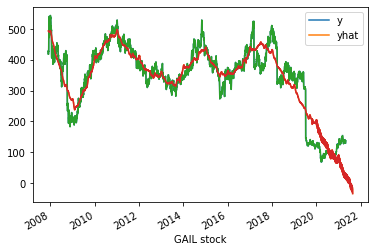

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/x6uz5kjw.json


Results of sklearn.metrics:
MAE: 58.663947964703375
RMSE: 75.48010443213357
R-Squared: -12.812371102955343 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/7k7jap99.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=711', 'data', 'file=/tmp/tmpkydmc_8p/x6uz5kjw.json', 'init=/tmp/tmpkydmc_8p/7k7jap99.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelvxi8tt25/prophet_model-20221107065501.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat   yhat_lower   yhat_upper
3582 2021-08-18  686.242323 -1179.656964  2443.611323
3583 2021-08-19  682.684758 -1079.255354  2422.589036
3584 2021-08-20  673.973898 -1223.582721  2363.360794
3585 2021-08-21  724.969395 -1131.365947  2456.540242
3586 2021-08-22  294.606464 -1491.793298  1988.851552


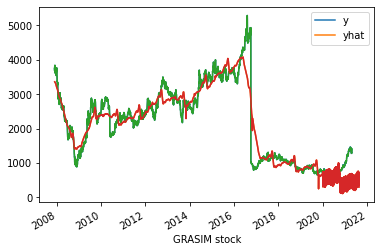

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/rayw8smu.json


Results of sklearn.metrics:
MAE: 270.8786079603819
RMSE: 374.2276156224668
R-Squared: -1.0519726263552065 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/elgbuc4n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4727', 'data', 'file=/tmp/tmpkydmc_8p/rayw8smu.json', 'init=/tmp/tmpkydmc_8p/elgbuc4n.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model3lr7rb99/prophet_model-20221107065504.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1220.744265  707.589659  1659.497227
3583 2021-08-19  1218.528418  733.231306  1687.982166
3584 2021-08-20  1219.854567  730.155162  1683.715155
3585 2021-08-21  1279.661046  792.269846  1755.361228
3586 2021-08-22  1236.868297  751.381225  1708.950918


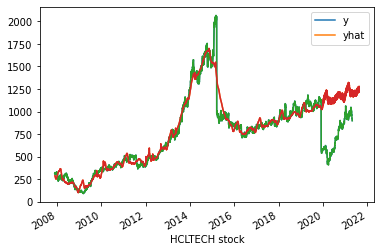

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/evh_ssn0.json


Results of sklearn.metrics:
MAE: 443.3615435242632
RMSE: 481.4493723033236
R-Squared: -5.09687470847953 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/v13nda14.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91486', 'data', 'file=/tmp/tmpkydmc_8p/evh_ssn0.json', 'init=/tmp/tmpkydmc_8p/v13nda14.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelzdkgwj9f/prophet_model-20221107065509.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  2705.502474  1521.607256  3826.174750
3583 2021-08-19  2695.165218  1470.878480  3869.766758
3584 2021-08-20  2684.840470  1535.624549  3823.862194
3585 2021-08-21  2704.770004  1514.755033  3878.109356
3586 2021-08-22  2688.733949  1480.292691  3872.173182


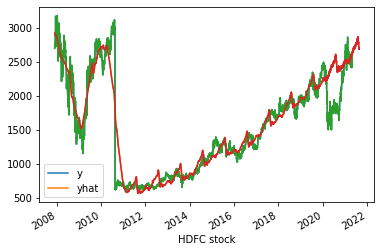

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/0q5ghi3z.json


Results of sklearn.metrics:
MAE: 413.272905303394
RMSE: 510.65251153396406
R-Squared: -1.0124838991747391 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/42lufbf9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69717', 'data', 'file=/tmp/tmpkydmc_8p/0q5ghi3z.json', 'init=/tmp/tmpkydmc_8p/42lufbf9.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelr7omkrv_/prophet_model-20221107065512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  2225.701954  1336.045067  3090.571021
3583 2021-08-19  2223.411540  1345.548264  3073.029068
3584 2021-08-20  2223.480420  1353.010626  3027.679780
3585 2021-08-21  2236.183366  1339.306538  3120.531492
3586 2021-08-22  1993.454355  1112.951826  2867.376982


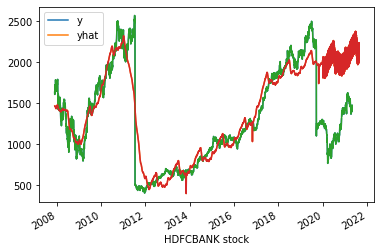

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/n_fvgozg.json


Results of sklearn.metrics:
MAE: 935.9235027028525
RMSE: 953.4062796989256
R-Squared: -20.55983981607558 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/7640z9gv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16696', 'data', 'file=/tmp/tmpkydmc_8p/n_fvgozg.json', 'init=/tmp/tmpkydmc_8p/7640z9gv.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelffb9o9rp/prophet_model-20221107065516.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1355.187075  147.883476  2634.331450
3583 2021-08-19  1354.784793  114.225924  2619.326398
3584 2021-08-20  1354.489960  137.534854  2602.390255
3585 2021-08-21  1321.891603  133.791317  2568.864719
3586 2021-08-22  1473.955334  223.322102  2740.279627


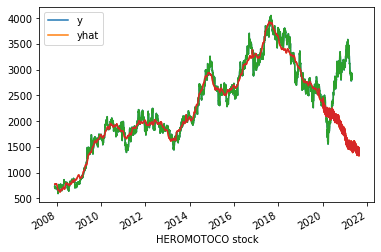

Results of sklearn.metrics:
MAE: 1087.2425311213476
RMSE: 1259.3547235555527
R-Squared: -5.828633659841607 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/j_2kjr0l.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/f_twbbng.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94077', 'data', 'file=/tmp/tmpkydmc_8p/j_2kjr0l.json', 'init=/tmp/tmpkydmc_8p/f_twbbng.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model0y2210ck/prophet_model-20221107065520.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  160.666417   12.182642  278.276891
3583 2021-08-19  160.857167   18.975597  277.297040
3584 2021-08-20  160.269067   13.736389  270.931140
3585 2021-08-21  159.911653    9.745949  275.716863
3586 2021-08-22  152.419338    9.360416  270.130573


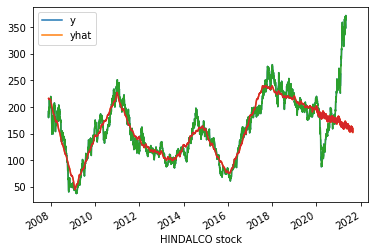

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/gs823g4p.json


Results of sklearn.metrics:
MAE: 57.49721131012466
RMSE: 80.43832837898616
R-Squared: -0.3890954046929205 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/rqhee1he.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=56240', 'data', 'file=/tmp/tmpkydmc_8p/gs823g4p.json', 'init=/tmp/tmpkydmc_8p/rqhee1he.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelpi_evcex/prophet_model-20221107065523.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  2645.058511  2338.555681  2947.153573
3583 2021-08-19  2646.801580  2345.532281  2947.108498
3584 2021-08-20  2646.543547  2345.819249  2930.438173
3585 2021-08-21  2665.393465  2354.274257  2973.239889
3586 2021-08-22  2686.154711  2388.900087  2984.076657


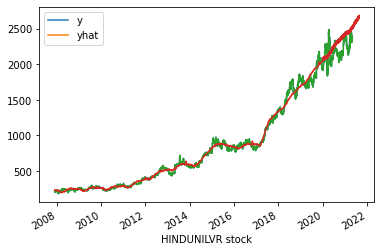

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/kgl8bk1p.json


Results of sklearn.metrics:
MAE: 282.92988394158317
RMSE: 299.9872280343032
R-Squared: -3.975165000243538 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/e2s33mx1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=58360', 'data', 'file=/tmp/tmpkydmc_8p/kgl8bk1p.json', 'init=/tmp/tmpkydmc_8p/e2s33mx1.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelvbii_erb/prophet_model-20221107065527.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower   yhat_upper
3582 2021-08-18  545.678761 -177.082767  1253.224638
3583 2021-08-19  545.486116 -179.412133  1285.041074
3584 2021-08-20  541.843156 -145.797122  1268.205673
3585 2021-08-21  525.560575 -204.766597  1239.532044
3586 2021-08-22  511.982630 -220.441540  1230.185011


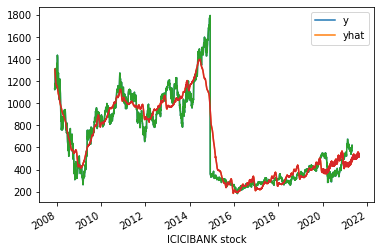

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/i5t_bmlt.json


Results of sklearn.metrics:
MAE: 69.27964834062931
RMSE: 86.25458035278875
R-Squared: 0.2541338828079971 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/teqqzz9l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77463', 'data', 'file=/tmp/tmpkydmc_8p/i5t_bmlt.json', 'init=/tmp/tmpkydmc_8p/teqqzz9l.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model9bs677em/prophet_model-20221107065531.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1303.069924  938.032903  1645.082628
3583 2021-08-19  1302.429472  948.857783  1653.276384
3584 2021-08-20  1302.054836  949.413007  1664.944494
3585 2021-08-21  1316.232816  947.048199  1664.322351
3586 2021-08-22  1259.459838  902.305929  1613.899708


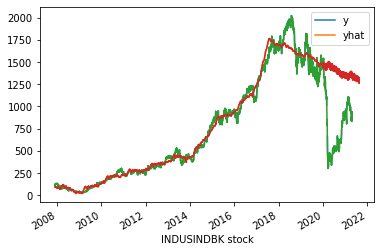

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/ice9pei4.json


Results of sklearn.metrics:
MAE: 535.8627897251444
RMSE: 619.5126263926677
R-Squared: -2.1036665106558283 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/1xy6fex0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55809', 'data', 'file=/tmp/tmpkydmc_8p/ice9pei4.json', 'init=/tmp/tmpkydmc_8p/1xy6fex0.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelzbro4fm4/prophet_model-20221107065535.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower   yhat_upper
3582 2021-08-18  549.827273 -651.771920  1979.757563
3583 2021-08-19  552.654758 -611.442992  2018.063024
3584 2021-08-20  546.630996 -651.906474  2034.146836
3585 2021-08-21  507.585274 -717.681414  1895.729787
3586 2021-08-22  492.736965 -678.866791  1949.892855


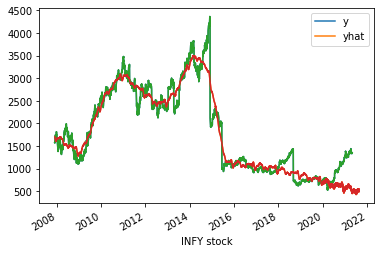

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/bzntqpdi.json


Results of sklearn.metrics:
MAE: 384.2060009782106
RMSE: 485.8359727163726
R-Squared: -2.557882020141088 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/pucphfam.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62993', 'data', 'file=/tmp/tmpkydmc_8p/bzntqpdi.json', 'init=/tmp/tmpkydmc_8p/pucphfam.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelakkezdum/prophet_model-20221107065539.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18 -125.744657 -268.162881   18.026650
3583 2021-08-19 -125.114800 -268.393570   29.454298
3584 2021-08-20 -125.388784 -260.910892   28.259867
3585 2021-08-21 -118.541724 -258.755919   20.305718
3586 2021-08-22 -147.749095 -287.004477    2.025152


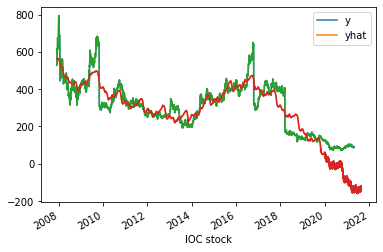

Results of sklearn.metrics:
MAE: 185.83151840955037
RMSE: 189.64757033051993
R-Squared: -139.16887126977053 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/f78n654g.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/bltdqkdw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71612', 'data', 'file=/tmp/tmpkydmc_8p/f78n654g.json', 'init=/tmp/tmpkydmc_8p/bltdqkdw.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelp9r3k9vg/prophet_model-20221107065542.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  252.134836  157.214387  338.569520
3583 2021-08-19  252.036039  160.792429  339.057864
3584 2021-08-20  252.085955  159.867548  335.824617
3585 2021-08-21  258.124204  167.056775  341.106502
3586 2021-08-22  241.374092  150.918766  328.937787


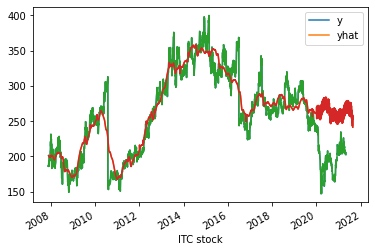

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/y1osfor3.json


Results of sklearn.metrics:
MAE: 61.2421765241017
RMSE: 66.07003942445454
R-Squared: -6.626485239506077 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/acfrvd3r.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26087', 'data', 'file=/tmp/tmpkydmc_8p/y1osfor3.json', 'init=/tmp/tmpkydmc_8p/acfrvd3r.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelntjosx01/prophet_model-20221107065546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat   yhat_lower   yhat_upper
3582 2021-08-18  303.107237 -1343.603168  1774.524036
3583 2021-08-19  308.920213 -1325.754056  1773.818222
3584 2021-08-20  305.885598 -1403.001208  1749.010551
3585 2021-08-21  313.089426 -1362.071528  1741.475494
3586 2021-08-22  337.378240 -1379.328833  1767.225700


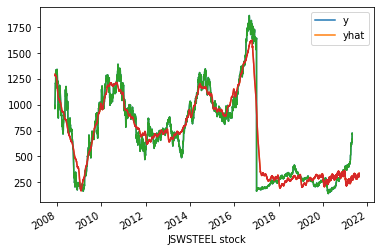

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/83sm5now.json


Results of sklearn.metrics:
MAE: 86.68973068679016
RMSE: 112.45032242609372
R-Squared: -0.03595478256580953 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/yjg2hrug.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79590', 'data', 'file=/tmp/tmpkydmc_8p/83sm5now.json', 'init=/tmp/tmpkydmc_8p/yjg2hrug.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model9wechcgy/prophet_model-20221107065551.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  2045.739563   950.844734  2923.488663
3583 2021-08-19  2047.249449   948.091816  2962.043879
3584 2021-08-20  2047.144620   971.005214  2917.075753
3585 2021-08-21  2067.504512   978.662309  2952.800707
3586 2021-08-22  2107.749758  1005.274040  2986.648416


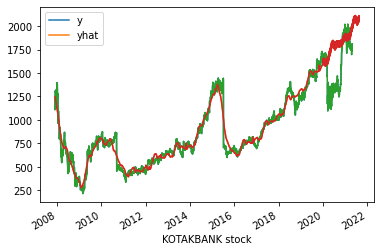

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/5c86dh7u.json


Results of sklearn.metrics:
MAE: 335.3395676503042
RMSE: 396.9290888849733
R-Squared: -1.4148185527631636 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/z97k9ikk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87596', 'data', 'file=/tmp/tmpkydmc_8p/5c86dh7u.json', 'init=/tmp/tmpkydmc_8p/z97k9ikk.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelfoqfbnvp/prophet_model-20221107065556.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:55:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:55:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1448.383606 -114.602572  2828.134735
3583 2021-08-19  1451.931305 -102.806486  2868.835366
3584 2021-08-20  1444.937482  -48.486641  2847.411419
3585 2021-08-21  1460.927079  -79.162355  2828.999704
3586 2021-08-22  1490.788114  -67.237624  2923.279695


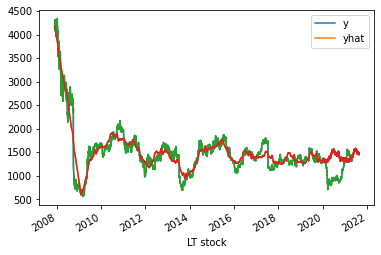

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/gb82033m.json


Results of sklearn.metrics:
MAE: 266.3360131038431
RMSE: 315.6848666357124
R-Squared: -0.908724636216121 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/wdbkxlge.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80691', 'data', 'file=/tmp/tmpkydmc_8p/gb82033m.json', 'init=/tmp/tmpkydmc_8p/wdbkxlge.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelbpmztz6l/prophet_model-20221107065600.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  -93.325446 -480.071268  305.793447
3583 2021-08-19  -94.210864 -506.726661  322.999457
3584 2021-08-20  -96.298264 -491.010467  336.310535
3585 2021-08-21  -72.499570 -451.721580  337.917347
3586 2021-08-22 -109.566029 -494.770556  269.171938


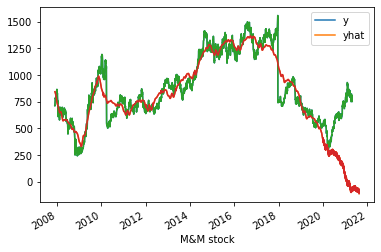

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/eoj7mt2t.json


Results of sklearn.metrics:
MAE: 575.0884985344975
RMSE: 625.1094512360618
R-Squared: -16.000760797682375 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/2_3frwfq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49298', 'data', 'file=/tmp/tmpkydmc_8p/eoj7mt2t.json', 'init=/tmp/tmpkydmc_8p/2_3frwfq.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modeltqd5at9p/prophet_model-20221107065604.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  5330.536071  3062.908327  7525.970058
3583 2021-08-19  5331.398892  3010.746480  7538.989246
3584 2021-08-20  5322.916755  2998.958787  7537.352710
3585 2021-08-21  5373.950864  3074.563039  7480.994218
3586 2021-08-22  5667.625753  3376.328022  7930.557793


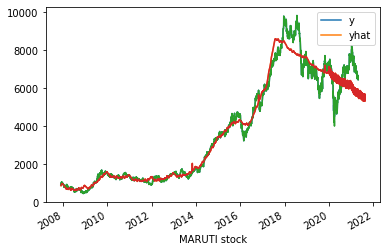

Results of sklearn.metrics:
MAE: 1186.5132483113143
RMSE: 1337.237856452733
R-Squared: -1.3662871980560358 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/_ieacczp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/21o7vokh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33910', 'data', 'file=/tmp/tmpkydmc_8p/_ieacczp.json', 'init=/tmp/tmpkydmc_8p/21o7vokh.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelm3v55g5s/prophet_model-20221107065608.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds          yhat    yhat_lower    yhat_upper
3582 2021-08-18  18549.327748  16810.592095  20305.829331
3583 2021-08-19  18577.234082  16843.891963  20365.275551
3584 2021-08-20  18592.463785  16871.259393  20366.084375
3585 2021-08-21  18664.803793  16972.526185  20464.795205
3586 2021-08-22  19339.788088  17606.648772  21121.708665


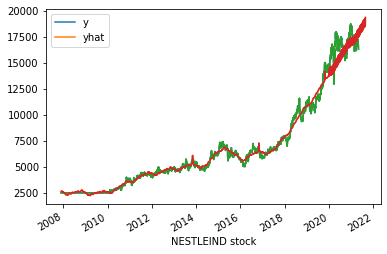

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/xcfixx2j.json


Results of sklearn.metrics:
MAE: 940.4024701615131
RMSE: 1179.3360075220626
R-Squared: -0.10318541391223301 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/dtufl17y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40520', 'data', 'file=/tmp/tmpkydmc_8p/xcfixx2j.json', 'init=/tmp/tmpkydmc_8p/dtufl17y.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelpgeqe1jv/prophet_model-20221107065612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds       yhat  yhat_lower  yhat_upper
3582 2021-08-18  81.471092   25.560342  126.411154
3583 2021-08-19  81.401180   24.851725  127.621223
3584 2021-08-20  81.205702   23.786744  128.343302
3585 2021-08-21  82.365194   25.625295  128.413945
3586 2021-08-22  77.933903   19.783476  125.082868


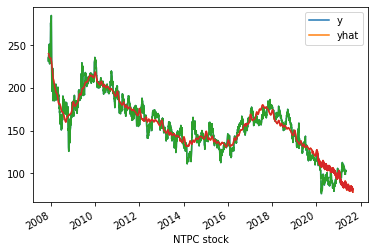

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/bib1zcts.json


Results of sklearn.metrics:
MAE: 10.560821946912585
RMSE: 12.742121781098582
R-Squared: -0.3356151598291439 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/oyi63k23.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50407', 'data', 'file=/tmp/tmpkydmc_8p/bib1zcts.json', 'init=/tmp/tmpkydmc_8p/oyi63k23.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model4umxb889/prophet_model-20221107065616.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18   97.938364 -481.957868  654.676509
3583 2021-08-19   99.195569 -464.691015  665.725604
3584 2021-08-20   97.278023 -488.058411  676.884513
3585 2021-08-21  125.262837 -445.030795  682.095738
3586 2021-08-22   98.139021 -497.035461  679.217291


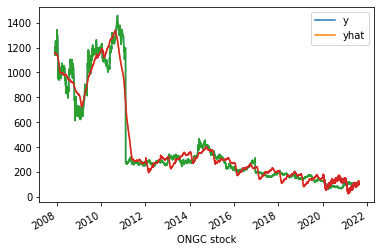

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/64nb21_a.json


Results of sklearn.metrics:
MAE: 25.44943095346307
RMSE: 30.498428591873783
R-Squared: -1.3326029081910034 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/3ge40he8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72019', 'data', 'file=/tmp/tmpkydmc_8p/64nb21_a.json', 'init=/tmp/tmpkydmc_8p/3ge40he8.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelzoe7h1nh/prophet_model-20221107065621.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:21 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  182.937194  116.592228  252.478729
3583 2021-08-19  182.947534  116.679427  251.091915
3584 2021-08-20  182.823377  117.126193  251.069420
3585 2021-08-21  185.885450  119.322922  254.134934
3586 2021-08-22  185.256753  119.499033  253.996895


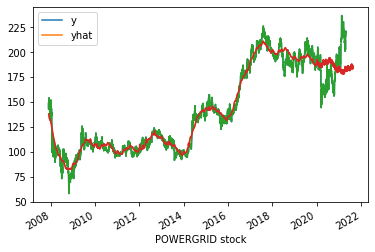

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/qn9rxgpc.json


Results of sklearn.metrics:
MAE: 14.36492483864726
RMSE: 18.482446613029662
R-Squared: 0.07788890905291479 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/4z3h6src.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51193', 'data', 'file=/tmp/tmpkydmc_8p/qn9rxgpc.json', 'init=/tmp/tmpkydmc_8p/4z3h6src.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model1n3t4uy_/prophet_model-20221107065625.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1506.134948  716.220466  2314.947031
3583 2021-08-19  1506.241578  742.941425  2330.512959
3584 2021-08-20  1503.939975  721.657290  2300.468949
3585 2021-08-21  1529.763983  735.957655  2344.275794
3586 2021-08-22  1566.902221  770.288097  2415.634768


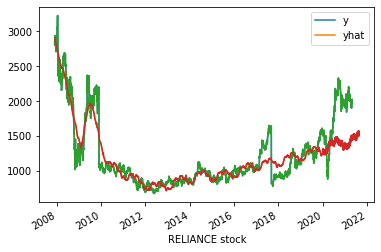

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/3l01zsuj.json


Results of sklearn.metrics:
MAE: 417.46129803443665
RMSE: 488.84209508268134
R-Squared: -1.1527090401734656 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/j2hvl6a2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=80181', 'data', 'file=/tmp/tmpkydmc_8p/3l01zsuj.json', 'init=/tmp/tmpkydmc_8p/j2hvl6a2.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model8hetv7d0/prophet_model-20221107065630.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat   yhat_lower   yhat_upper
3582 2021-08-18  370.684136 -1050.340981  1840.568671
3583 2021-08-19  367.560490 -1132.461894  1748.069729
3584 2021-08-20  360.122132 -1101.707131  1815.678713
3585 2021-08-21  329.858353 -1122.973955  1750.681531
3586 2021-08-22  188.099849 -1327.979833  1581.763842


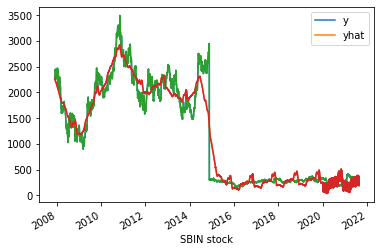

Results of sklearn.metrics:
MAE: 80.27945427286402
RMSE: 93.8253398685515
R-Squared: -0.6168986770017946 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/tnpmguox.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/0xns1tyt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21719', 'data', 'file=/tmp/tmpkydmc_8p/tnpmguox.json', 'init=/tmp/tmpkydmc_8p/0xns1tyt.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model36srjj6x/prophet_model-20221107065633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds          yhat    yhat_lower    yhat_upper
3582 2021-08-18  20606.493134  17672.728107  23732.940449
3583 2021-08-19  20634.601364  17666.469088  23584.516399
3584 2021-08-20  20620.285550  17528.877568  23449.797736
3585 2021-08-21  20752.464552  17650.446780  23822.866490
3586 2021-08-22  21165.626109  18056.950681  24171.922734


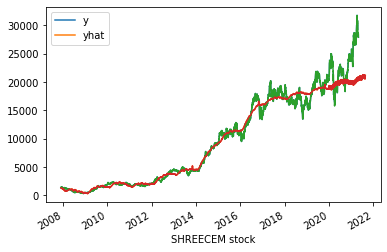

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/wd51jm_j.json


Results of sklearn.metrics:
MAE: 2978.277179384645
RMSE: 3837.0334218432818
R-Squared: -0.5028018915182271 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/fu5c7j38.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45314', 'data', 'file=/tmp/tmpkydmc_8p/wd51jm_j.json', 'init=/tmp/tmpkydmc_8p/fu5c7j38.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelzh9ib18t/prophet_model-20221107065637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower   yhat_upper
3582 2021-08-18  268.093624 -411.120471  1039.178980
3583 2021-08-19  267.856761 -449.501381  1056.769806
3584 2021-08-20  268.168680 -462.925331  1053.024814
3585 2021-08-21  285.431078 -425.644963  1052.312770
3586 2021-08-22  190.894837 -505.375435   986.118532


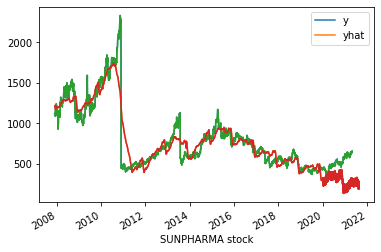

Results of sklearn.metrics:
MAE: 

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/_rolpmia.json


213.1300949872465
RMSE: 239.6858822116417
R-Squared: -9.185179294324437 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/doufyii1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=144', 'data', 'file=/tmp/tmpkydmc_8p/_rolpmia.json', 'init=/tmp/tmpkydmc_8p/doufyii1.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modeljhml2ryo/prophet_model-20221107065641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:43 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat   yhat_lower  yhat_upper
3582 2021-08-18 -138.925131 -1046.679972  685.196538
3583 2021-08-19 -137.121909 -1015.637456  661.447691
3584 2021-08-20 -138.628200 -1049.484185  692.296257
3585 2021-08-21 -127.798315 -1023.820157  698.682645
3586 2021-08-22 -103.855473  -985.444165  711.659471


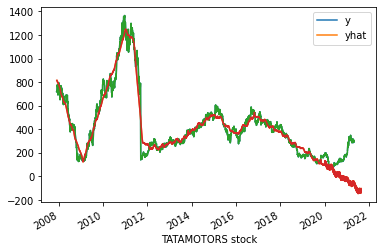

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/a2ke0n12.json


Results of sklearn.metrics:
MAE: 234.49748895348358
RMSE: 259.9286835830931
R-Squared: -10.525931547233615 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/z9kc_pzz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64821', 'data', 'file=/tmp/tmpkydmc_8p/a2ke0n12.json', 'init=/tmp/tmpkydmc_8p/z9kc_pzz.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelcanphsep/prophet_model-20221107065646.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  255.448915 -150.687421  667.592755
3583 2021-08-19  256.330243 -161.098671  663.393241
3584 2021-08-20  253.141186 -167.681133  691.264622
3585 2021-08-21  242.477515 -164.061251  663.350120
3586 2021-08-22  235.002930 -187.399536  641.814197


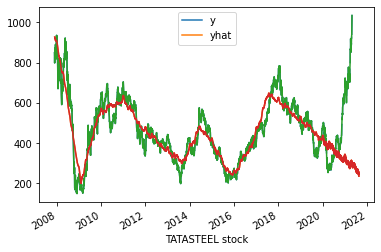

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/qs04wjq_.json


Results of sklearn.metrics:
MAE: 184.98625079286268
RMSE: 258.63142277630675
R-Squared: -1.212465375256898 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/d9hnmdvh.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22939', 'data', 'file=/tmp/tmpkydmc_8p/qs04wjq_.json', 'init=/tmp/tmpkydmc_8p/d9hnmdvh.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelr7gfw0qu/prophet_model-20221107065650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  1589.821125  1184.396211  2019.286132
3583 2021-08-19  1589.144513  1172.714326  2045.771432
3584 2021-08-20  1582.661935  1192.274740  2009.258305
3585 2021-08-21  1568.263294  1155.142049  2006.311162
3586 2021-08-22  1670.599498  1227.709356  2125.252309


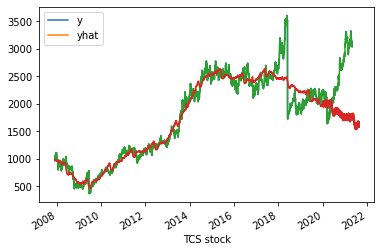

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/w6v2jh73.json


Results of sklearn.metrics:
MAE: 727.8452687107647
RMSE: 894.1578779218604
R-Squared: -2.7623000033817915 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/8jqwcp7l.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34078', 'data', 'file=/tmp/tmpkydmc_8p/w6v2jh73.json', 'init=/tmp/tmpkydmc_8p/8jqwcp7l.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modeliqwdw530/prophet_model-20221107065653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:56:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1056.075513  -99.537960  2169.373580
3583 2021-08-19  1057.293611  -95.666427  2189.259474
3584 2021-08-20  1057.098833 -143.750887  2213.892876
3585 2021-08-21  1165.192438  -31.636073  2278.800829
3586 2021-08-22  1043.913206  -69.971666  2175.272880


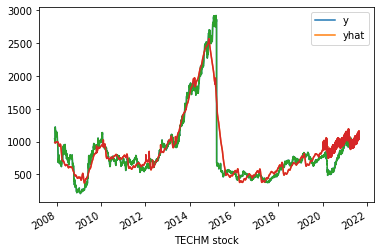

Results of sklearn.metrics:
MAE: 216.46799781353093
RMSE: 278.6008769712982
R-Squared: -1.9832728030781674 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/n87fsghh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/880iohgz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87359', 'data', 'file=/tmp/tmpkydmc_8p/n87fsghh.json', 'init=/tmp/tmpkydmc_8p/880iohgz.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelrcc_shsb/prophet_model-20221107065657.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:56:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:57:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat  yhat_lower   yhat_upper
3582 2021-08-18  1681.077622 -502.811613  3742.382078
3583 2021-08-19  1679.032499 -456.774751  3822.947236
3584 2021-08-20  1682.973211 -496.907579  3835.085823
3585 2021-08-21  1703.027912 -389.009563  3794.544374
3586 2021-08-22  1674.472105 -600.058464  3817.837444


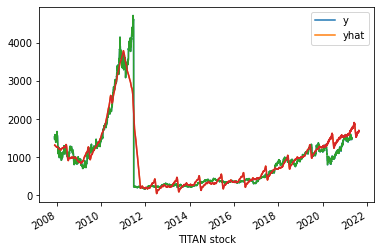

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/0wqwsmbh.json


Results of sklearn.metrics:
MAE: 394.17330340889725
RMSE: 431.0260844522372
R-Squared: -3.2351750986074643 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/4zvqy3me.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71552', 'data', 'file=/tmp/tmpkydmc_8p/0wqwsmbh.json', 'init=/tmp/tmpkydmc_8p/4zvqy3me.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelgkgn0jyu/prophet_model-20221107065702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:57:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:57:03 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds         yhat   yhat_lower   yhat_upper
3582 2021-08-18  4216.778228  3588.039281  5126.649231
3583 2021-08-19  4222.087577  3538.292133  5077.042411
3584 2021-08-20  4215.570322  3543.966578  5121.729597
3585 2021-08-21  4242.331611  3561.224012  5186.039796
3586 2021-08-22  4338.826145  3658.008198  5278.796727


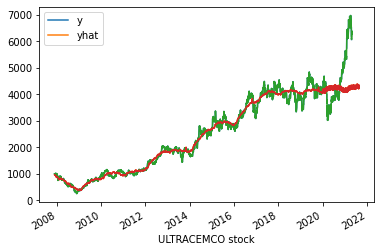

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/_8nttsbt.json


Results of sklearn.metrics:
MAE: 725.3979612351966
RMSE: 1042.032902819935
R-Squared: -0.07499899407171817 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/0rl2lffz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23024', 'data', 'file=/tmp/tmpkydmc_8p/_8nttsbt.json', 'init=/tmp/tmpkydmc_8p/0rl2lffz.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelxn1l8ss5/prophet_model-20221107065706.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:57:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:57:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  164.499151   39.608445  267.786236
3583 2021-08-19  164.648799   42.212720  267.958044
3584 2021-08-20  163.825328   41.124634  267.124602
3585 2021-08-21  166.077174   41.715478  271.117829
3586 2021-08-22  169.424404   46.642627  279.326788


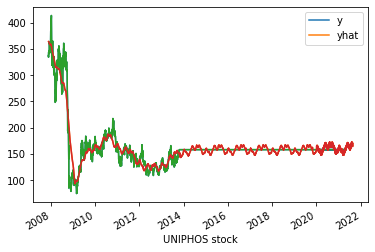

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/glsdwvim.json


Results of sklearn.metrics:
MAE: 5.284208613989135
RMSE: 6.215797446257532
R-Squared: -1.195730551524351e+28 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/2q0twewc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=87140', 'data', 'file=/tmp/tmpkydmc_8p/glsdwvim.json', 'init=/tmp/tmpkydmc_8p/2q0twewc.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelvxmn_gj8/prophet_model-20221107065711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:57:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:57:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  589.166967  476.494411  706.798824
3583 2021-08-19  589.852862  475.520311  708.929792
3584 2021-08-20  589.486727  479.109202  700.801089
3585 2021-08-21  582.687552  467.166076  700.339467
3586 2021-08-22  582.069459  466.053636  702.526864


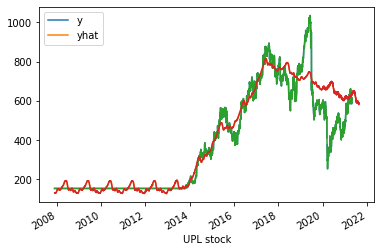

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/ygaiaq6p.json


Results of sklearn.metrics:
MAE: 131.8747649477365
RMSE: 153.9752619843709
R-Squared: -2.356515369365106 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/6z1ip46x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52073', 'data', 'file=/tmp/tmpkydmc_8p/ygaiaq6p.json', 'init=/tmp/tmpkydmc_8p/6z1ip46x.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_modelytepli59/prophet_model-20221107065714.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:57:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:57:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds       yhat   yhat_lower   yhat_upper
3582 2021-08-18 -19.402229 -1154.979605   972.088871
3583 2021-08-19 -23.693227 -1136.301285   989.778203
3584 2021-08-20 -39.233856 -1133.093097  1015.111303
3585 2021-08-21 -35.250002 -1126.348114  1009.706494
3586 2021-08-22  13.943245 -1064.924689  1005.815145


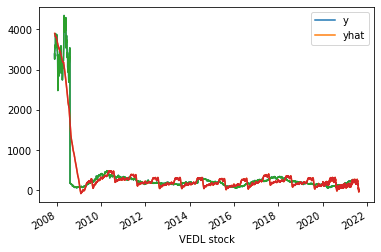

DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/ar4pwfow.json


Results of sklearn.metrics:
MAE: 54.531387360205755
RMSE: 73.28602358169309
R-Squared: -1.7751545982494985 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/oddf1c8s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92952', 'data', 'file=/tmp/tmpkydmc_8p/ar4pwfow.json', 'init=/tmp/tmpkydmc_8p/oddf1c8s.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model8y8mktim/prophet_model-20221107065718.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:57:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:57:21 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  201.683022 -201.030140  590.135500
3583 2021-08-19  201.966190 -200.272694  580.151373
3584 2021-08-20  200.934943 -200.601014  582.639055
3585 2021-08-21  206.458749 -177.573543  575.527674
3586 2021-08-22  202.897636 -202.633653  575.523764


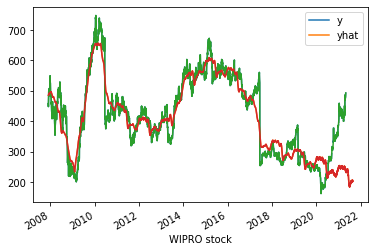

Results of sklearn.metrics:
MAE: 88.21831978043701
RMSE: 122.37187173220724
R-Squared: -0.9196763579753613 




DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/ijio7sbw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpkydmc_8p/fuabi8hl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.7/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19164', 'data', 'file=/tmp/tmpkydmc_8p/ijio7sbw.json', 'init=/tmp/tmpkydmc_8p/fuabi8hl.json', 'output', 'file=/tmp/tmpkydmc_8p/prophet_model1sp8iebs/prophet_model-20221107065723.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
06:57:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
06:57:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


             ds        yhat  yhat_lower  yhat_upper
3582 2021-08-18  144.765428  -24.562079  292.698046
3583 2021-08-19  144.031529  -20.144553  296.603718
3584 2021-08-20  143.292202  -27.215065  286.035354
3585 2021-08-21  145.514309  -23.845236  294.854541
3586 2021-08-22  120.614284  -50.653567  270.663638


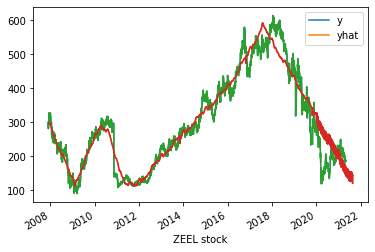

Results of sklearn.metrics:
MAE: 44.8160009631143
RMSE: 50.542088465577166
R-Squared: -0.23778710207756282 




In [ ]:
import sklearn.metrics as metrics
import matplotlib.pyplot as plt

error_fb=[]
for i in df.columns:
  frame= df1[['Date',i]]
  frame.columns=['ds','y']
  #train = frame.iloc[:len(frame)-200]
  #test = frame.iloc[len(frame)-500:]

  train = frame[( frame['ds'] >='2007-11-30' ) &(frame['ds'] <='2019-12-31' )]
  test = frame[( frame['ds'] >'2019-12-31' )]

  m = Prophet(daily_seasonality=False)
  m.fit(train)
  future = m.make_future_dataframe(periods=600) #MS for monthly, H for hourly by default it is daily which we want
  forecast = m.predict(future)
  print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(5))
  pd.concat([frame.set_index('ds')['y'],forecast.set_index('ds')['yhat']],axis=1).plot()
  predictions = forecast.iloc[-365:]['yhat']
  mae = metrics.mean_absolute_error(frame.set_index('ds').iloc[-365:]['y'],forecast.set_index('ds').iloc[-365:]['yhat'])
  mse = metrics.mean_squared_error(frame.set_index('ds').iloc[-365:]['y'],forecast.set_index('ds').iloc[-365:]['yhat'])
  error_fb.append(mae)
  rmse = np.sqrt(mse) #mse**(0.5)
  r2 = metrics.r2_score(frame.set_index('ds').iloc[-365:]['y'],forecast.set_index('ds').iloc[-365:]['yhat'])
  plt.plot(frame.set_index('ds')['y'])
  plt.plot(forecast.set_index('ds')['yhat'])
  plt.xlabel(i+' stock')
  plt.show()
  print("Results of sklearn.metrics:")
  print("MAE:",mae)
  print("RMSE:", rmse)
  print("R-Squared:", r2,'\n\n')


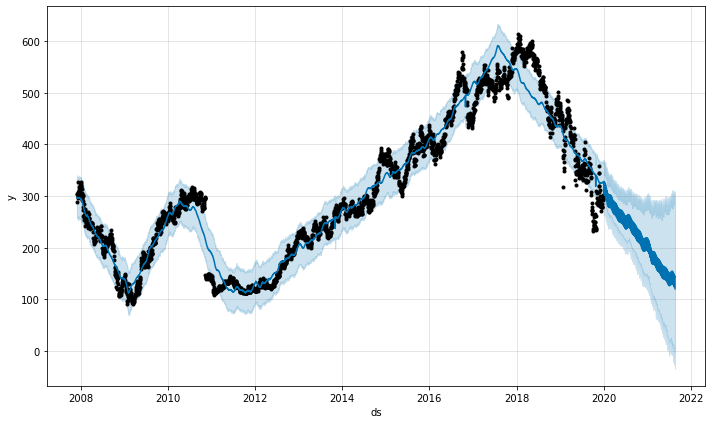

In [ ]:
#here in order to conserve memory we are using only the last case to show the graphs and how they vary for comapny ZEEL.
fig1 = m.plot(forecast)

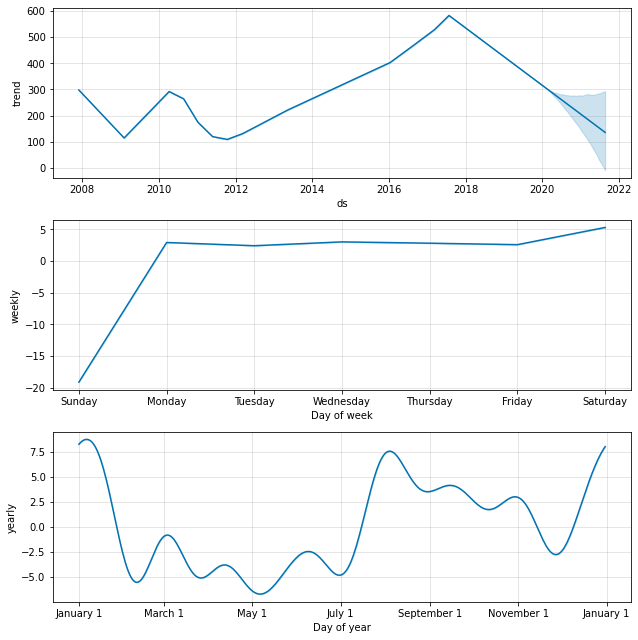

In [ ]:
fig2 = m.plot_components(forecast)


In [ ]:
#now we evaluate the models for every one or the last one as we do here similarly can be done for other casess:
from statsmodels.tools.eval_measures import rmse

In [ ]:
predictions = forecast.iloc[-332:]['yhat']
print("Root Mean Squared Error between actual and  predicted values: ",rmse(predictions,test.iloc[-365:]['y']))
print("Mean Value of Test Dataset:", test.iloc[-365:]['y'].mean())

Root Mean Squared Error between actual and  predicted values:  49.89041318971374
Mean Value of Test Dataset: 198.45768072289155


# Baseline Model using Arima


In [ ]:
import logging
df_2 =df.resample('M').mean()
logging.getLogger("imported_module").setLevel(logging.WARNING)

In [ ]:

train_1 = df_2[( df_2.index.get_level_values(0) >='2007-11-30' ) &(df_2.index.get_level_values(0) <='2019-12-31' )]
test_1= df_2[(df_2.index.get_level_values(0) >'2019-12-31')]

In [ ]:
test_1.describe()

,ADANIPORTS,ASIANPAINT,AXISBANK,BAJAJ-AUTO,BAJAJFINSV,BAJFINANCE,BHARTIARTL,BPCL,BRITANNIA,CIPLA,...,TATASTEEL,TCS,TECHM,TITAN,ULTRACEMCO,UNIPHOS,UPL,VEDL,WIPRO,ZEEL
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,...,16.000000,16.000000,16.000000,16.000000,16.000000,16.0,16.000000,16.000000,16.000000,16.000000
mean,422.925010,2050.481967,562.089243,3104.342847,7495.750268,3904.463725,517.851373,397.066013,3419.753001,683.697499,...,485.560426,2474.171854,780.447894,1219.619271,4639.570581,157.8,486.369554,136.525752,305.934824,197.660673
std,151.880349,371.348967,135.868033,499.935131,1962.541268,1112.310959,45.624469,43.702735,334.444267,149.865810,...,188.720304,488.768350,173.659635,222.966138,1076.904586,0.0,82.932252,47.472169,94.292539,34.013716
min,265.869444,1583.378947,379.215789,2317.726190,4553.621053,2011.360526,423.364286,321.121053,2703.976190,406.792857,...,277.252778,1792.486111,520.323684,859.244737,3392.113889,157.8,344.350000,76.586111,185.072222,142.838889
25%,338.799457,1722.021429,440.819862,2902.349432,5978.962094,3299.961025,482.178286,366.332513,3117.606842,593.595797,...,340.034684,2123.977955,617.605047,1030.354581,3877.776556,157.8,428.097273,105.361989,235.110625,174.623214
50%,360.122024,1917.063295,542.924048,3021.528929,7042.566369,3810.439441,530.551253,400.643068,3504.285357,748.934773,...,425.968631,2330.332305,799.221739,1199.839648,4409.783274,157.8,482.740476,128.598918,287.698214,191.625752
75%,479.085398,2426.324613,691.896961,3413.651525,9494.176114,4915.114309,557.629572,420.250362,3661.863666,789.397132,...,634.628580,2882.599080,942.930682,1473.058977,5183.332330,157.8,550.601875,158.862065,378.494075,215.973750
max,756.023684,2666.842500,743.925000,4098.282500,10029.912500,5473.177500,586.800000,469.008696,3850.383333,894.755263,...,915.247368,3178.250000,1010.300000,1520.634211,6666.523810,157.8,615.813158,233.481579,457.531579,275.108696


In [ ]:
import pmdarima as pm
import sklearn.metrics as metrics
import numpy as np

In [ ]:
## ARIMA
error_ar=[]

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1622.971, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1618.922, Time=0.36 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1607.045, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1621.468, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1605.178, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1607.042, Time=0.33 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.83 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1603.678, Time=0.20 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1605.409, Time=0.52 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1605.416, Time=0.52 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1616.951, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1598.393, Time=0.27 sec
 ARIMA(2,1,1)(1,0,0)[12] intercept

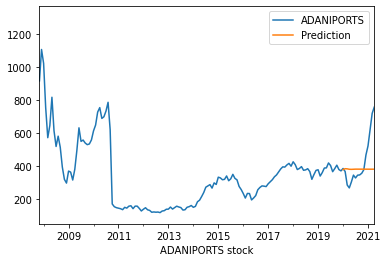

Results of sklearn.metrics:
MAE: 105.02265700821489
RMSE: 153.43306117118962
R-Squared: -0.08858776660436551
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2120.838, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2116.847, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2120.575, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2120.654, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2114.879, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2118.838, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2118.838, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2118.585, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2118.609, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2120.388, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.849 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


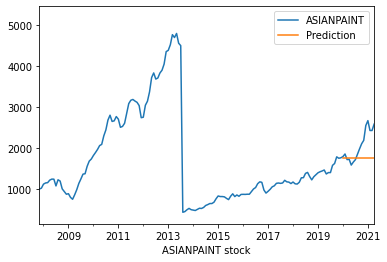

Results of sklearn.metrics:
MAE: 340.65240895438944
RMSE: 461.7101397284864
R-Squared: -0.6489333763227332
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.54 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1838.506, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1836.910, Time=0.21 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1835.747, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1836.519, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1836.242, Time=0.09 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.53 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1836.746, Time=0.64 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1836.136, Time=0.21 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1837.848, Time=0.15 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1837.516, Time=0.41 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1837.113, Time=0.3

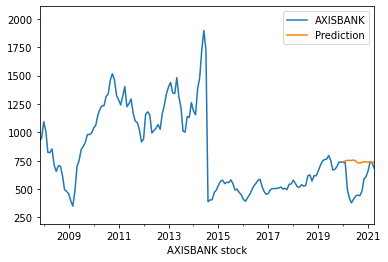

Results of sklearn.metrics:
MAE: 181.18984632142877
RMSE: 225.0722581445793
R-Squared: -1.9271035147927722
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1844.905, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1840.959, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1840.108, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1845.364, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1842.198, Time=0.13 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.89 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1842.022, Time=0.68 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1840.272, Time=0.40 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=inf, Time=2.34 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1843.161, Time=0.17 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1842.007, Time=0.60 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1841.934, Time=0.3

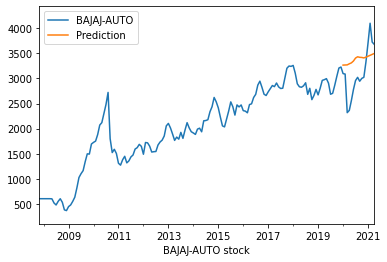

Results of sklearn.metrics:
MAE: 444.0847700598987
RMSE: 512.7731755049878
R-Squared: -0.12215282482695011
Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=2010.595, Time=0.37 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=2011.070, Time=0.03 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=2013.644, Time=0.07 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=1976.993, Time=0.23 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=1975.461, Time=0.07 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=1977.151, Time=0.21 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=inf, Time=0.54 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=1961.898, Time=0.18 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=1963.750, Time=0.54 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=1963.645, Time=0.45 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=1962.988, Time=0.81 sec
 ARIMA(1,2,0)(0,0,0)[12]             : AIC=2011.966, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[12]             : AIC=1938.645

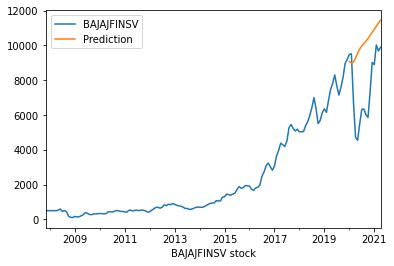

Results of sklearn.metrics:
MAE: 2783.0476493009282
RMSE: 3159.6020936736472
R-Squared: -1.7647502997433784
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2301.724, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2297.985, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2299.110, Time=0.12 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2298.104, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2296.210, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2299.750, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2299.764, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2297.331, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2296.366, Time=0.06 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2296.771, Time=0.09 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 0.987 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


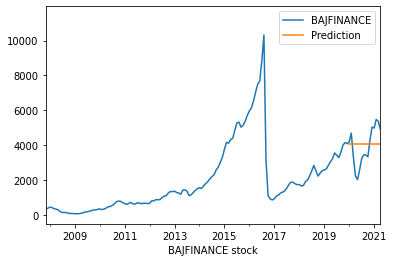

Results of sklearn.metrics:
MAE: 958.4758447259658
RMSE: 1091.2420698753274
R-Squared: -0.02664073608614803
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1491.994, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1488.161, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1487.705, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1487.210, Time=0.33 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1487.100, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1489.995, Time=0.15 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1489.993, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1485.749, Time=0.07 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1487.704, Time=0.21 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1489.702, Time=0.55 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1486.550, Time=0.11 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1487.227, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=14

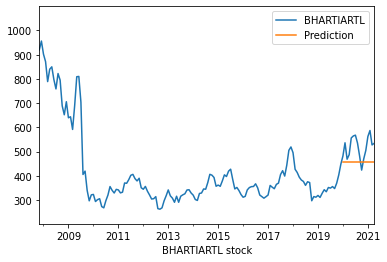

Results of sklearn.metrics:
MAE: 66.3975734268964
RMSE: 76.44183510430933
R-Squared: -1.994299845819505
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1872.358, Time=0.43 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1927.416, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1581.346, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1727.023, Time=0.70 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2267.743, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1580.818, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1580.910, Time=0.32 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1582.292, Time=0.71 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1568.025, Time=0.09 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1569.429, Time=0.58 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1569.370, Time=0.30 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1571.228, Time=0.95 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1565.4

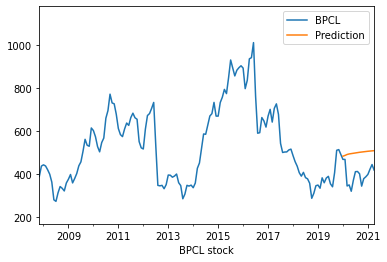

Results of sklearn.metrics:
MAE: 102.80768807665373
RMSE: 111.67858089831394
R-Squared: -5.965483479440488
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2048.397, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2044.464, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2045.747, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2046.288, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2042.689, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=2046.453, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=2046.454, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2043.770, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2044.303, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2043.859, Time=0.19 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.152 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


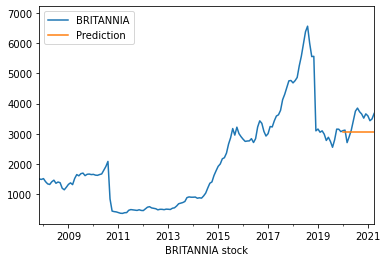

Results of sklearn.metrics:
MAE: 418.54417184987324
RMSE: 478.18687955973047
R-Squared: -1.1806025894282905
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1353.294, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1351.165, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1349.746, Time=0.26 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1349.919, Time=0.29 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1350.029, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1347.845, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1349.775, Time=0.29 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1350.236, Time=0.42 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1349.830, Time=0.12 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1349.836, Time=0.12 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1347.994, Time=0.12 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=1346.44

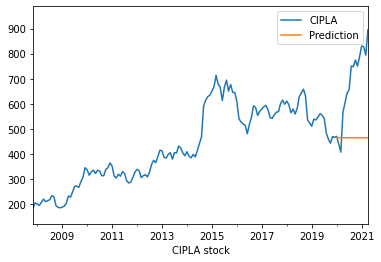

Results of sklearn.metrics:
MAE: 229.83026745353283
RMSE: 262.9543945242113
R-Squared: -2.283858663922886
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1208.935, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1207.176, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1200.327, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1194.176, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1205.790, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1192.480, Time=0.10 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1194.225, Time=0.29 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1188.654, Time=0.14 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1190.383, Time=0.40 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1190.319, Time=0.38 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1191.023, Time=0.70 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1198.934,

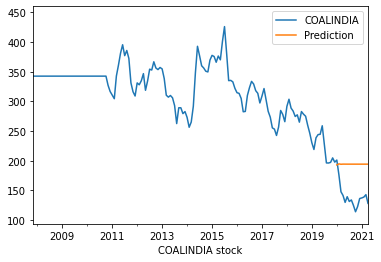

Results of sklearn.metrics:
MAE: 54.77679269577296
RMSE: 57.5943006311843
R-Squared: -6.905415911788493
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1867.709, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1864.005, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1867.659, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1867.646, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1863.608, Time=0.02 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1865.755, Time=0.16 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1865.739, Time=0.10 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1865.881, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1865.879, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1867.908, Time=0.10 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.119 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


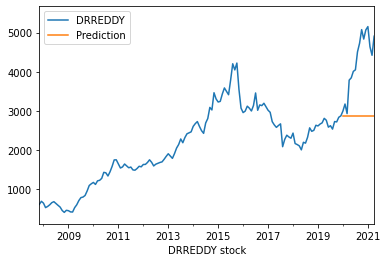

Results of sklearn.metrics:
MAE: 1383.5266241397094
RMSE: 1560.498700808913
R-Squared: -3.673912031355596
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2423.834, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2420.439, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2416.608, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2414.837, Time=0.14 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2421.523, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2413.127, Time=0.05 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2414.931, Time=0.11 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2416.310, Time=0.27 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2414.452, Time=0.08 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2414.560, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2414.683, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=2416.525, Time=0.13 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2413

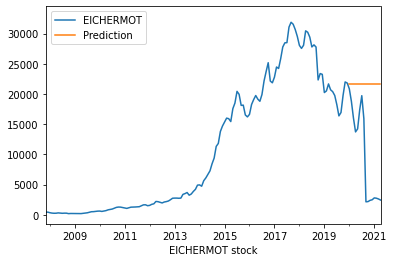

Results of sklearn.metrics:
MAE: 11849.392957619519
RMSE: 14020.390802945294
R-Squared: -2.500000025924572
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1688.723, Time=0.55 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1696.347, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1415.167, Time=0.44 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1540.251, Time=0.56 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2150.938, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1413.473, Time=0.09 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1415.149, Time=0.27 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1417.138, Time=0.72 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1404.653, Time=0.16 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1406.571, Time=0.74 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1406.569, Time=0.39 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1408.568, Time=0.61 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=140

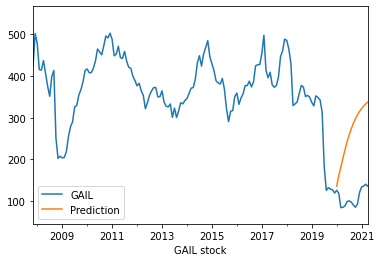

Results of sklearn.metrics:
MAE: 154.26083559612334
RMSE: 165.15134331486075
R-Squared: -64.68647094556742
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2095.704, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2093.316, Time=0.23 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2088.758, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2089.006, Time=0.10 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2091.890, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2088.025, Time=0.06 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=2088.922, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=2090.452, Time=0.22 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=2089.770, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2089.893, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2088.059, Time=0.16 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=2088.552, Time=0.42 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=208

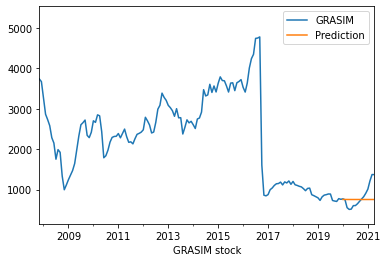

Results of sklearn.metrics:
MAE: 209.13609894198288
RMSE: 283.2945965920732
R-Squared: -0.05825305471289011
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1730.712, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1728.608, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1728.973, Time=0.25 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1726.735, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1726.694, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1728.754, Time=0.17 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1728.712, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1728.206, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1725.406, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1726.764, Time=0.24 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1728.723, Time=0.44 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1712.389, Time=0.19 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=17

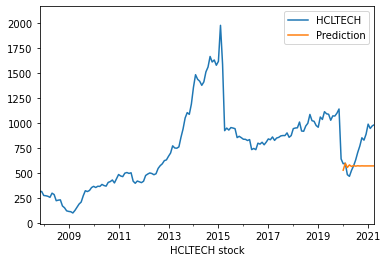

Results of sklearn.metrics:
MAE: 196.71023282952456
RMSE: 246.90537545352072
R-Squared: -0.8424259000117365
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1911.029, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1908.109, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1890.148, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1865.311, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1906.138, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1864.045, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1865.476, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1866.459, Time=0.49 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1864.813, Time=0.13 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1864.506, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1888.230, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1866.243, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=18

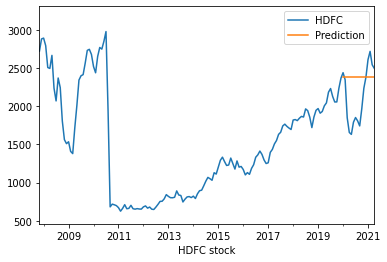

Results of sklearn.metrics:
MAE: 364.5845960646411
RMSE: 442.3545597823199
R-Squared: -0.4717911017076999
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1868.627, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1865.005, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1839.771, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1823.432, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1863.052, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1821.456, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1823.429, Time=0.37 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1821.516, Time=0.20 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1821.920, Time=0.21 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1837.767, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1822.961, Time=0.22 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1819.494,

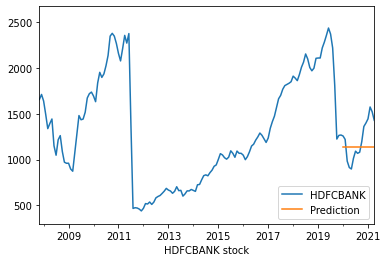

Results of sklearn.metrics:
MAE: 192.47147429726988
RMSE: 225.59746076927317
R-Squared: -0.12796025904848896
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1825.201, Time=0.56 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1823.773, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1824.001, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1824.260, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1822.917, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1823.618, Time=0.23 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1823.907, Time=0.20 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1824.582, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1824.461, Time=0.14 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1822.166, Time=0.23 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1822.008, Time=0.66 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=1822.773, Time=1.61 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1

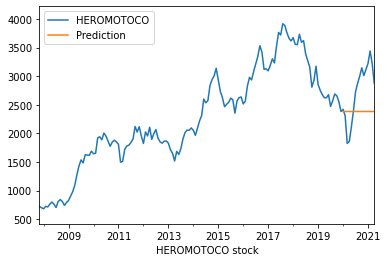

Results of sklearn.metrics:
MAE: 517.8131092740056
RMSE: 596.6940744724449
R-Squared: -0.4787669042967646
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1157.904, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1161.531, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1152.684, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1151.034, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1159.551, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1152.230, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1149.923, Time=0.36 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1152.137, Time=0.25 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1150.957, Time=0.93 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1149.921, Time=0.78 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1148.396, Time=0.58 sec
 ARIMA(0,1,0)(0,0,2)[12] intercept   : AIC=1155.478, Time=0.40 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=1151

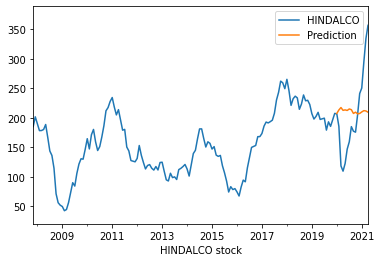

Results of sklearn.metrics:
MAE: 60.16174820641697
RMSE: 73.2457479945288
R-Squared: -0.04409313887063537
Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=1555.415, Time=0.23 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=1555.345, Time=0.03 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=1542.965, Time=0.12 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=1497.272, Time=0.20 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=1496.996, Time=0.06 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=1497.330, Time=0.19 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=1499.260, Time=0.28 sec
 ARIMA(1,2,1)(0,0,0)[12]             : AIC=1494.022, Time=0.14 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=1493.751, Time=0.47 sec
 ARIMA(1,2,1)(2,0,0)[12]             : AIC=1495.698, Time=1.30 sec
 ARIMA(1,2,1)(1,0,1)[12]             : AIC=1495.716, Time=0.68 sec
 ARIMA(1,2,1)(0,0,1)[12]             : AIC=1493.717, Time=0.28 sec
 ARIMA(1,2,1)(0,0,2)[12]             : AIC=1495

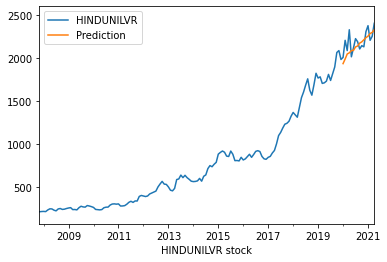

Results of sklearn.metrics:
MAE: 89.44723607035458
RMSE: 109.41613397904823
R-Squared: 0.10074328374392139
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1801.545, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1798.069, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1800.667, Time=0.48 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1800.524, Time=0.43 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1796.257, Time=0.07 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1799.859, Time=0.08 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1799.818, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1798.841, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1798.729, Time=0.25 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1800.619, Time=0.24 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.275 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


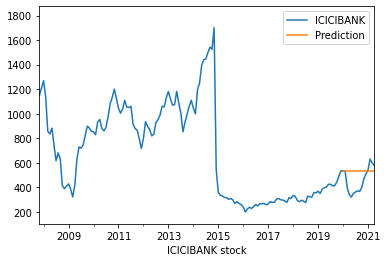

Results of sklearn.metrics:
MAE: 104.64327203569692
RMSE: 127.425213355348
R-Squared: -0.6096998783846388
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1568.365, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1566.062, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1560.119, Time=0.59 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1556.053, Time=0.72 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1568.698, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1556.423, Time=0.31 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1557.897, Time=1.02 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1557.523, Time=2.14 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1555.904, Time=0.55 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1557.887, Time=1.11 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1559.816, Time=3.73 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1566.369, Time=0.25 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1551

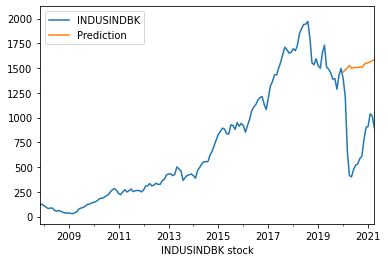

Results of sklearn.metrics:
MAE: 750.7604924115568
RMSE: 803.1596861363964
R-Squared: -6.909143943348796
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1997.082, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1993.664, Time=0.05 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1997.143, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1997.084, Time=0.51 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1991.759, Time=0.05 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1995.257, Time=0.35 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1995.223, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1995.551, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1995.519, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1996.712, Time=0.29 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.354 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


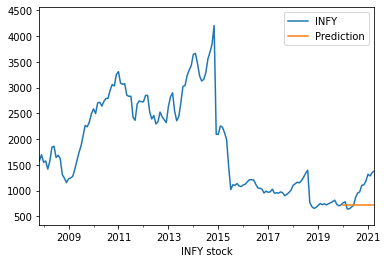

Results of sklearn.metrics:
MAE: 288.1957891243879
RMSE: 368.19757943997166
R-Squared: -1.0315245763443133
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1509.304, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1506.870, Time=0.61 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1501.509, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1507.915, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1499.660, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1501.519, Time=0.45 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1503.197, Time=1.02 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1500.201, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1498.283, Time=0.15 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1500.133, Time=0.83 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1500.126, Time=1.74 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=1501.862

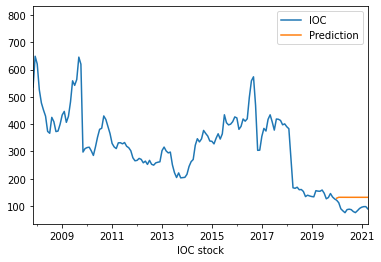

Results of sklearn.metrics:
MAE: 40.86869669197236
RMSE: 42.69505588074325
R-Squared: -12.032084729419287
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1279.715, Time=0.45 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1278.534, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1278.763, Time=0.34 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1278.079, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1276.586, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1278.741, Time=0.26 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1278.333, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1278.477, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1278.151, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1279.798, Time=0.21 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.402 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


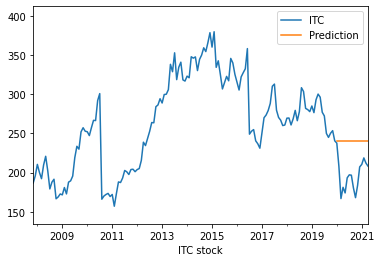

Results of sklearn.metrics:
MAE: 44.108777903978506
RMSE: 48.09833028755523
R-Squared: -5.288852762140257
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1846.956, Time=0.73 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1844.054, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1842.723, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1842.793, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1842.242, Time=0.06 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1845.104, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1845.086, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1841.131, Time=0.20 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1842.686, Time=0.52 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1844.203, Time=0.89 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1843.105, Time=0.22 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1843.083, Time=0.18 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1841

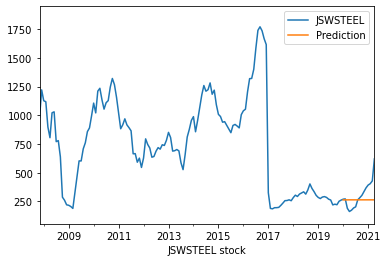

Results of sklearn.metrics:
MAE: 89.83960162317507
RMSE: 122.92266123702315
R-Squared: -0.11941141401367728
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.93 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1677.819, Time=0.23 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1659.519, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1655.963, Time=0.60 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1676.149, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1654.903, Time=0.32 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1655.891, Time=0.67 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1657.872, Time=0.94 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1656.870, Time=0.14 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1656.858, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1659.434, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1657.223, Time=0.34 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1653.15

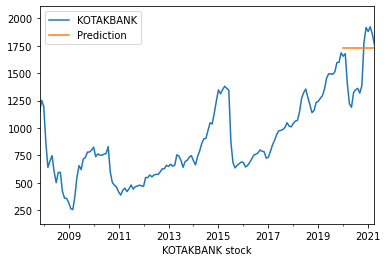

Results of sklearn.metrics:
MAE: 259.530181635417
RMSE: 307.23152612106156
R-Squared: -0.41430230948695
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1945.230, Time=0.52 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1941.286, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1937.926, Time=0.31 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1936.194, Time=0.63 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1940.762, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1934.194, Time=0.22 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1936.194, Time=0.71 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1936.253, Time=1.23 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1935.744, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1935.675, Time=0.30 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1935.942, Time=0.04 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1937.675, Time=0.87 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1933.1

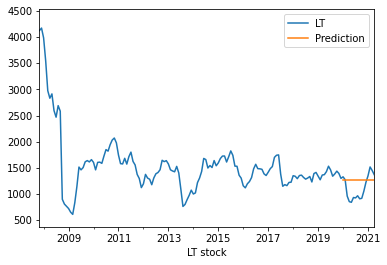

Results of sklearn.metrics:
MAE: 238.6253442588138
RMSE: 277.26348200987013
R-Squared: -0.5021760476241368
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1694.376, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1693.109, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1689.740, Time=0.33 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1690.336, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1691.148, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1689.863, Time=0.08 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1690.598, Time=1.17 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1691.039, Time=0.56 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1690.048, Time=0.31 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1692.100, Time=2.11 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1693.134, Time=0.26 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1691.738, Time=0.46 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=169

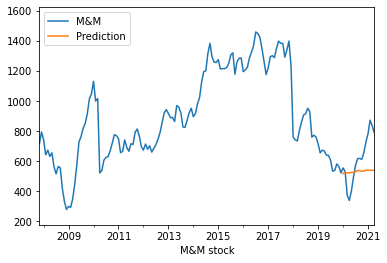

Results of sklearn.metrics:
MAE: 140.10699026890796
RMSE: 170.04256533301236
R-Squared: -0.17275327814790264
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2035.205, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2022.450, Time=0.35 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2015.489, Time=0.57 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2036.882, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2015.177, Time=0.20 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2016.046, Time=0.71 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.36 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2016.862, Time=0.55 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2016.635, Time=0.19 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2022.616, Time=0.09 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=2018.317, Time=0.19 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2015.273, T

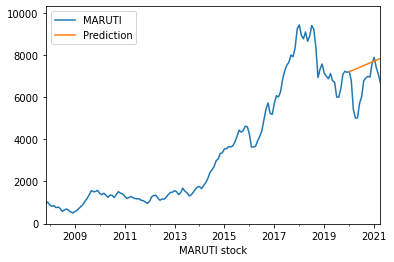

Results of sklearn.metrics:
MAE: 949.3560862627528
RMSE: 1203.9566059425908
R-Squared: -0.9458706819948899
Performing stepwise search to minimize aic
 ARIMA(0,2,0)(1,0,1)[12]             : AIC=2136.632, Time=0.31 sec
 ARIMA(0,2,0)(0,0,0)[12]             : AIC=2142.799, Time=0.03 sec
 ARIMA(1,2,0)(1,0,0)[12]             : AIC=2100.637, Time=0.16 sec
 ARIMA(0,2,1)(0,0,1)[12]             : AIC=2061.619, Time=0.25 sec
 ARIMA(0,2,1)(0,0,0)[12]             : AIC=2068.866, Time=0.08 sec
 ARIMA(0,2,1)(1,0,1)[12]             : AIC=2063.293, Time=0.36 sec
 ARIMA(0,2,1)(0,0,2)[12]             : AIC=2063.115, Time=0.71 sec
 ARIMA(0,2,1)(1,0,0)[12]             : AIC=2061.446, Time=0.28 sec
 ARIMA(0,2,1)(2,0,0)[12]             : AIC=2063.210, Time=0.80 sec
 ARIMA(0,2,1)(2,0,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,2,0)(1,0,0)[12]             : AIC=2135.603, Time=0.13 sec
 ARIMA(1,2,1)(1,0,0)[12]             : AIC=2062.463, Time=0.46 sec
 ARIMA(0,2,2)(1,0,0)[12]             : AIC=2062.573

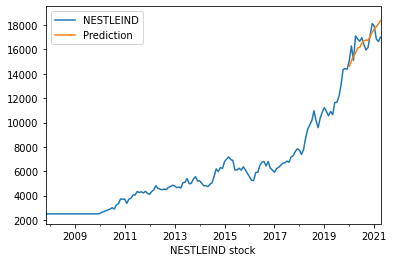

Results of sklearn.metrics:
MAE: 737.2429053456309
RMSE: 852.4552653222352
R-Squared: -0.12859008814034456
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1049.277, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1045.371, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1048.838, Time=0.23 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1048.349, Time=0.24 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1044.628, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1047.311, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1047.316, Time=0.13 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1046.860, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1046.360, Time=0.07 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1046.147, Time=0.17 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 1.422 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


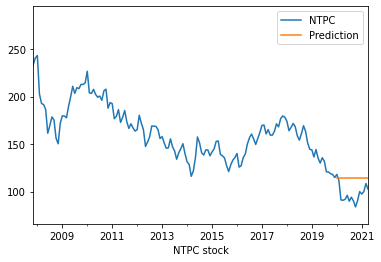

Results of sklearn.metrics:
MAE: 17.90281170647304
RMSE: 19.61872402579189
R-Squared: -3.8825394539048803
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1665.447, Time=0.49 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1662.744, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1642.313, Time=0.24 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1636.271, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1662.082, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1634.289, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1636.271, Time=0.35 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1637.812, Time=0.76 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1636.113, Time=0.18 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1636.060, Time=0.18 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1640.341, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1637.500, Time=0.27 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1633

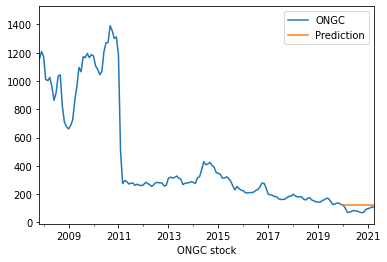

Results of sklearn.metrics:
MAE: 34.24027257952002
RMSE: 37.81657668818845
R-Squared: -4.549510971000029
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=954.532, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=956.341, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=951.111, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=948.118, Time=0.19 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=954.616, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=949.926, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=950.051, Time=0.54 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=950.112, Time=0.55 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=948.157, Time=0.18 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=952.088, Time=1.19 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=952.806, Time=0.13 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=947.684, Time=0.46 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=inf, Time=0.19 se

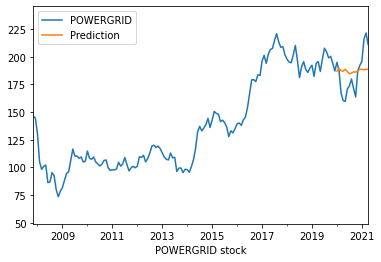

Results of sklearn.metrics:
MAE: 15.560177605198634
RMSE: 18.623819021406824
R-Squared: 0.04264345181054019
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1845.344, Time=0.46 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1841.357, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1836.680, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1831.582, Time=0.69 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1839.945, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1829.684, Time=0.19 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1831.580, Time=0.42 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1833.571, Time=0.50 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1830.153, Time=0.36 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1829.488, Time=0.32 sec
 ARIMA(0,1,2)(1,0,0)[12] intercept   : AIC=1831.420, Time=0.48 sec
 ARIMA(0,1,2)(0,0,1)[12] intercept   : AIC=1831.400, Time=0.63 sec
 ARIMA(0,1,2)(1,0,1)[12] intercept   : AIC=18

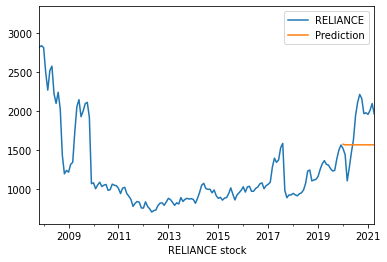

Results of sklearn.metrics:
MAE: 365.8107651393203
RMSE: 408.74420586285504
R-Squared: -0.5012605621539967
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1948.895, Time=0.36 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1944.873, Time=0.08 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1930.180, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1924.727, Time=1.05 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1943.557, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1922.799, Time=0.29 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1924.741, Time=0.84 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1926.335, Time=1.16 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1924.783, Time=0.29 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1924.778, Time=0.45 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1928.205, Time=0.13 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1921.205

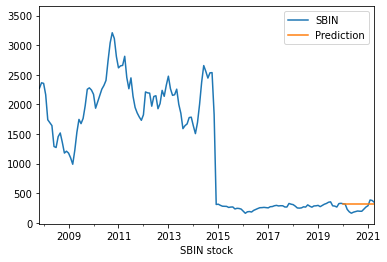

Results of sklearn.metrics:
MAE: 83.9436626832725
RMSE: 97.15855517922354
R-Squared: -0.77729336657104
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2288.035, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2285.683, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2282.684, Time=0.14 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2276.705, Time=1.07 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2289.771, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2275.248, Time=0.11 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2276.817, Time=0.34 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2278.675, Time=0.72 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2272.113, Time=0.41 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=2274.230, Time=0.96 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=2274.202, Time=0.85 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=2275.929, Time=1.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2281.18

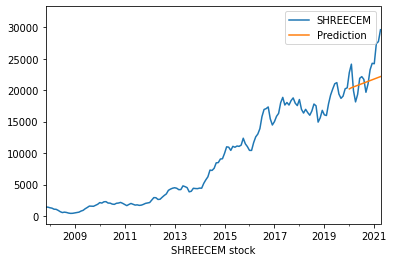

Results of sklearn.metrics:
MAE: 2562.0206032013884
RMSE: 3246.708912811358
R-Squared: -0.08704073279912339
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1853.466, Time=0.04 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1856.144, Time=0.42 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1855.882, Time=0.40 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1851.621, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1855.063, Time=0.11 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1855.096, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1854.468, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1854.168, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1854.823, Time=0.33 sec

Best model:  ARIMA(0,1,0)(0,0,0)[12]          
Total fit time: 2.364 seconds
AxesSubplot(0.125,0.125;0.775x0.755)


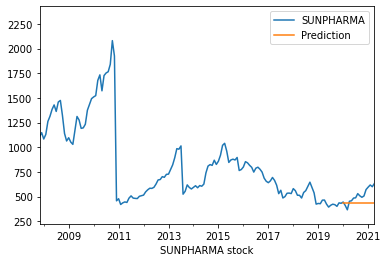

Results of sklearn.metrics:
MAE: 88.79901232154411
RMSE: 107.62875975679425
R-Squared: -1.0888684142187666
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1629.281, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1630.634, Time=0.06 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1603.286, Time=0.45 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1593.240, Time=0.78 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1629.114, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1591.286, Time=0.37 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1593.256, Time=1.26 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1593.286, Time=0.30 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1593.286, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1601.438, Time=0.08 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1594.221, Time=0.53 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1589.541

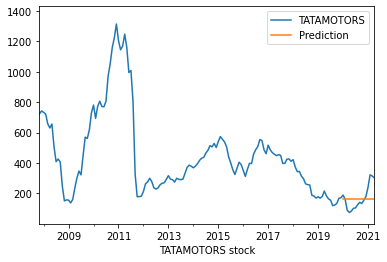

Results of sklearn.metrics:
MAE: 64.00219938046943
RMSE: 80.76393879579646
R-Squared: -0.010072549032188682
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.53 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1884.351, Time=0.06 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1555.267, Time=0.54 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1717.061, Time=0.94 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2225.696, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1555.523, Time=0.12 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1545.107, Time=1.91 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=1546.907, Time=2.86 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1550.041, Time=1.19 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1880.944, Time=3.08 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1535.032, Time=2.35 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1541.597, Time=0.68 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=1536.30

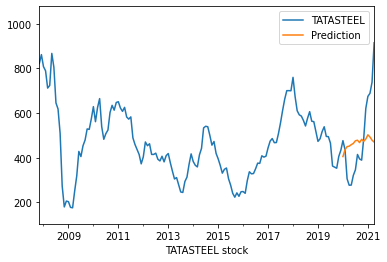

Results of sklearn.metrics:
MAE: 143.57164090844444
RMSE: 176.19072564980277
R-Squared: 0.07026847813615078
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1891.612, Time=0.55 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1888.604, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1889.184, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1888.380, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1886.951, Time=0.03 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1890.292, Time=0.07 sec
 ARIMA(0,1,0)(0,0,1)[12] intercept   : AIC=1890.249, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1887.360, Time=0.10 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1886.558, Time=0.13 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1888.399, Time=0.38 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1889.691, Time=0.79 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1887.733, Time=0.19 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=18

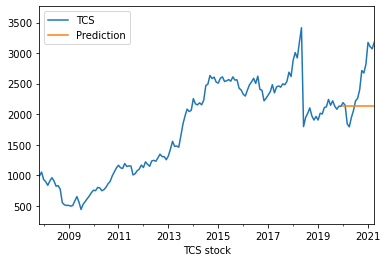

Results of sklearn.metrics:
MAE: 455.6121589534953
RMSE: 586.3027473797807
R-Squared: -0.5348517424930905
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2241.708, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2247.954, Time=0.22 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1890.759, Time=0.58 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2070.243, Time=0.60 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2434.619, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1888.836, Time=0.10 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1890.765, Time=0.46 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1892.717, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1860.334, Time=0.20 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1862.280, Time=0.67 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1862.285, Time=0.49 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1864.260, Time=0.54 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1859

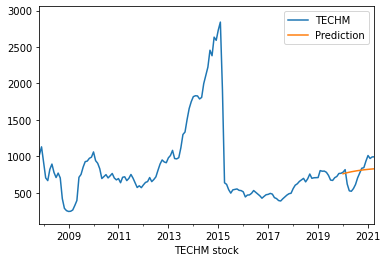

Results of sklearn.metrics:
MAE: 133.90349687397017
RMSE: 156.52379823345308
R-Squared: 0.13345381634312514
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=2056.296, Time=0.21 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=2053.651, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=2047.783, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=2046.744, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=2051.660, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=2045.897, Time=0.09 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=2046.794, Time=0.27 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=2048.722, Time=0.52 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=2047.915, Time=0.09 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=2047.834, Time=0.22 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=2046.730, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=inf, Time=0.29 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=2043.89

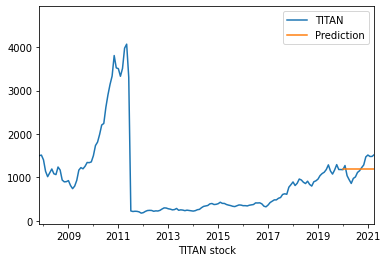

Results of sklearn.metrics:
MAE: 186.49126310093416
RMSE: 218.0562438909086
R-Squared: -0.020206189860461965
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1867.234, Time=0.50 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1872.415, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1864.454, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1864.568, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1873.276, Time=0.03 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1871.428, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[12] intercept   : AIC=1866.416, Time=0.93 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1866.425, Time=0.70 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1865.263, Time=0.23 sec
 ARIMA(1,1,0)(2,0,1)[12] intercept   : AIC=1868.379, Time=0.90 sec
 ARIMA(0,1,0)(1,0,0)[12] intercept   : AIC=1865.269, Time=0.27 sec
 ARIMA(2,1,0)(1,0,0)[12] intercept   : AIC=1863.117, Time=0.52 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1

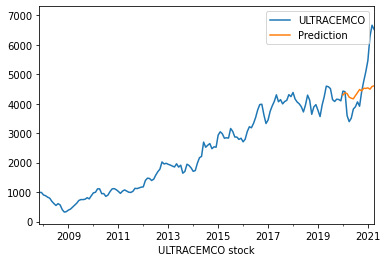

Results of sklearn.metrics:
MAE: 723.369966385261
RMSE: 962.7644544267763
R-Squared: 0.14746078314624722
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1243.133, Time=0.30 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1244.553, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1226.030, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1197.129, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1243.281, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1199.165, Time=0.07 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1196.893, Time=0.37 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1198.506, Time=0.26 sec
 ARIMA(0,1,1)(2,0,1)[12] intercept   : AIC=1198.877, Time=0.90 sec
 ARIMA(0,1,1)(1,0,2)[12] intercept   : AIC=1198.877, Time=0.96 sec
 ARIMA(0,1,1)(0,0,2)[12] intercept   : AIC=1197.384, Time=0.53 sec
 ARIMA(0,1,1)(2,0,0)[12] intercept   : AIC=1198.880, Time=0.67 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=1200.

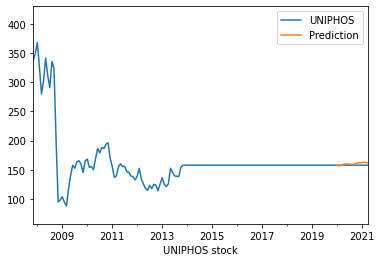

Results of sklearn.metrics:
MAE: 2.5097764902826967
RMSE: 2.954989004389931
R-Squared: 0.0
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1488.256, Time=0.38 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1486.290, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1482.110, Time=0.29 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1479.845, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1485.028, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1478.240, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1479.783, Time=0.30 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=1481.173, Time=0.59 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1475.931, Time=0.16 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=1477.478, Time=0.48 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=1477.590, Time=0.56 sec
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=1478.107, Time=0.70 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1480.594, Time=0.09

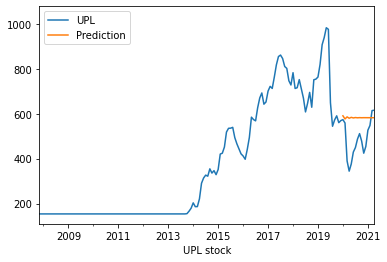

Results of sklearn.metrics:
MAE: 104.5369340096988
RMSE: 125.41150821244834
R-Squared: -1.4392515156883974
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=1973.853, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1970.029, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1945.436, Time=0.39 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1951.954, Time=0.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1969.591, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1943.436, Time=0.11 sec
 ARIMA(1,1,0)(0,0,1)[12] intercept   : AIC=1945.471, Time=0.12 sec
 ARIMA(1,1,0)(1,0,1)[12] intercept   : AIC=1947.331, Time=0.59 sec
 ARIMA(2,1,0)(0,0,0)[12] intercept   : AIC=1945.122, Time=0.13 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1945.383, Time=0.07 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1950.040, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[12] intercept   : AIC=1945.449, Time=0.36 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=194

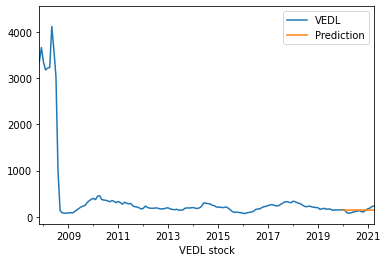

Results of sklearn.metrics:
MAE: 39.38392348285504
RMSE: 46.81028254228283
R-Squared: -0.037129781587901256
Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1813.053, Time=0.59 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1814.345, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1480.622, Time=0.48 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2200.518, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1478.713, Time=0.08 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1480.623, Time=0.36 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=1482.630, Time=0.44 sec
 ARIMA(2,0,0)(0,0,0)[12] intercept   : AIC=1463.175, Time=0.14 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1464.722, Time=0.83 sec
 ARIMA(2,0,0)(0,0,1)[12] intercept   : AIC=1464.688, Time=0.35 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=1466.649, Time=0.97 sec
 ARIMA(3,0,0)(0,0,0)[12] intercept   : AIC=1464.39

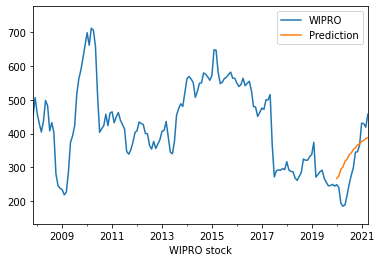

Results of sklearn.metrics:
MAE: 59.68618319512433
RMSE: 70.59479990360424
R-Squared: 0.40211248005257005
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.59 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=1320.233, Time=0.03 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=1314.310, Time=0.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=1313.891, Time=0.20 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=1318.233, Time=0.03 sec
 ARIMA(0,1,1)(0,0,0)[12] intercept   : AIC=1311.984, Time=0.12 sec
 ARIMA(0,1,1)(1,0,0)[12] intercept   : AIC=1313.903, Time=0.20 sec
 ARIMA(0,1,1)(1,0,1)[12] intercept   : AIC=inf, Time=0.85 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=1313.918, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[12] intercept   : AIC=1313.904, Time=0.16 sec
 ARIMA(1,1,0)(0,0,0)[12] intercept   : AIC=1312.345, Time=0.11 sec
 ARIMA(1,1,2)(0,0,0)[12] intercept   : AIC=1315.365, Time=0.30 sec
 ARIMA(0,1,1)(0,0,0)[12]             : AIC=1309.984, Time

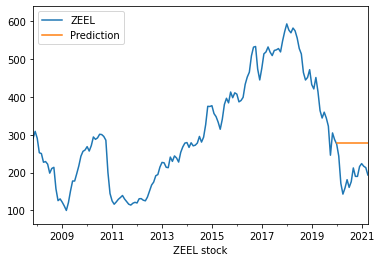

Results of sklearn.metrics:
MAE: 79.13359669834527
RMSE: 85.71318854479398
R-Squared: -5.773542600538558


In [ ]:
for i in train_1.columns:
    model = pm.auto_arima(train_1[i],
                        m=12, seasonal=True,
                      start_p=0, start_q=0, max_order=4, test_1='adf',error_action='ignore',
                           suppress_warnings=True,
                      stepwise=True, trace=True)
    model.fit(train_1[i])
    future=model.predict(n_periods=600, return_conf_int=True)
    future_df_2 = pd.DataFrame(future[0],index = test_1.index,columns=['Prediction'])
    #print(future_df_2.describe())

    mae = metrics.mean_absolute_error(test_1[i], future_df_2)
    mse = metrics.mean_squared_error(test_1[i], future_df_2)
    rmse = np.sqrt(mse) #mse**(0.5)
    r2 = metrics.r2_score(test_1[i],future_df_2['Prediction'])
    print(pd.concat([df_2[i],future_df_2],axis=1).plot())
    plt.plot(df[i])
    plt.plot(future_df_2)
    plt.xlabel(i+' stock')
    plt.show()
    error_ar.append(mae)

    print("Results of sklearn.metrics:")
    print("MAE:",mae)
    print("RMSE:", rmse)
    print("R-Squared:", r2)







In [ ]:
'INDUSINDBK','HINDALCO','BPCL'

('INDUSINDBK', 'HINDALCO', 'BPCL')

# model using RNN and LSTM


In [ ]:
## LSTM
import tensorflow
from tensorflow import keras
from tensorflow.keras import models
from tensorflow.keras import layers

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import SimpleRNN,LSTM


In [ ]:
training_size=int(len(df_2)*0.8)
test_size=len(df_2)-training_size

In [ ]:
print(training_size,test_size)

129 33


In [ ]:
error_rnn=[]
error_ls=[]
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-time_step-1):
		a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100
		dataX.append(a)
		dataY.append(dataset[i + time_step, 0])
	return np.array(dataX), np.array(dataY)

In [ ]:
### RNN

Epoch 1/20
2/2 [==============================] - 4s 660ms/step - loss: 0.0375 - val_loss: 0.0306
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0297 - val_loss: 0.0239
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0255 - val_loss: 0.0197
Epoch 4/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0229 - val_loss: 0.0168
Epoch 5/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0211 - val_loss: 0.0148
Epoch 6/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0199 - val_loss: 0.0134
Epoch 7/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0190 - val_loss: 0.0123
Epoch 8/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0183 - val_loss: 0.0116
Epoch 9/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0177 - val_loss: 0.0110
Epoch 10/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0173 - val_loss: 0.0106
Epoch 11/20
2/2 [===========

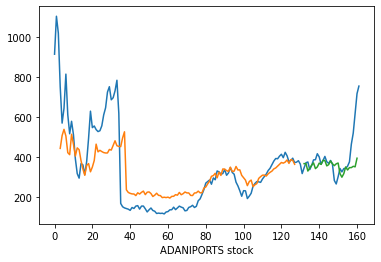

Epoch 1/20
2/2 [==============================] - 4s 588ms/step - loss: 0.0851 - val_loss: 0.0126
Epoch 2/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0723 - val_loss: 0.0082
Epoch 3/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0655 - val_loss: 0.0060
Epoch 4/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0604 - val_loss: 0.0049
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0562 - val_loss: 0.0042
Epoch 6/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0526 - val_loss: 0.0038
Epoch 7/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0493 - val_loss: 0.0034
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0464 - val_loss: 0.0032
Epoch 9/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0436 - val_loss: 0.0030
Epoch 10/20
2/2 [==============================] - 0s 30ms/step - loss: 0.0412 - val_loss: 0.0029
Epoch 11/20
2/2 [===========

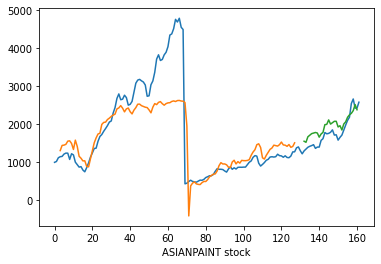

Epoch 1/20
2/2 [==============================] - 4s 593ms/step - loss: 0.3056 - val_loss: 0.0456
Epoch 2/20
2/2 [==============================] - 0s 30ms/step - loss: 0.2370 - val_loss: 0.0301
Epoch 3/20
2/2 [==============================] - 0s 31ms/step - loss: 0.1933 - val_loss: 0.0209
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1633 - val_loss: 0.0151
Epoch 5/20
2/2 [==============================] - 0s 32ms/step - loss: 0.1411 - val_loss: 0.0116
Epoch 6/20
2/2 [==============================] - 0s 33ms/step - loss: 0.1250 - val_loss: 0.0093
Epoch 7/20
2/2 [==============================] - 0s 32ms/step - loss: 0.1126 - val_loss: 0.0079
Epoch 8/20
2/2 [==============================] - 0s 31ms/step - loss: 0.1029 - val_loss: 0.0070
Epoch 9/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0951 - val_loss: 0.0066
Epoch 10/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0888 - val_loss: 0.0064
Epoch 11/20
2/2 [===========

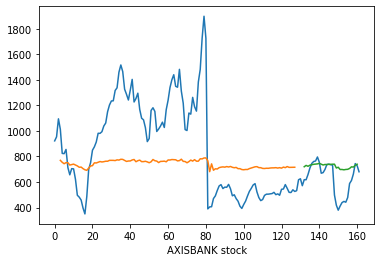

Epoch 1/20
2/2 [==============================] - 4s 607ms/step - loss: 0.4974 - val_loss: 0.6219
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.2187 - val_loss: 0.3440
Epoch 3/20
2/2 [==============================] - 0s 31ms/step - loss: 0.1060 - val_loss: 0.2041
Epoch 4/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0572 - val_loss: 0.1319
Epoch 5/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0354 - val_loss: 0.0921
Epoch 6/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0255 - val_loss: 0.0703
Epoch 7/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0209 - val_loss: 0.0571
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0185 - val_loss: 0.0488
Epoch 9/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0171 - val_loss: 0.0436
Epoch 10/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0163 - val_loss: 0.0402
Epoch 11/20
2/2 [===========

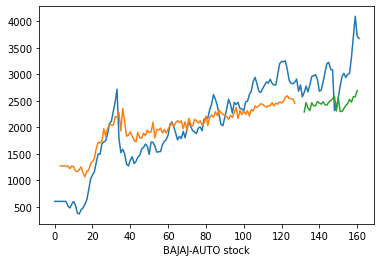

Epoch 1/20
2/2 [==============================] - 4s 595ms/step - loss: 0.0567 - val_loss: 0.7554
Epoch 2/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0510 - val_loss: 0.7258
Epoch 3/20
2/2 [==============================] - 0s 32ms/step - loss: 0.0469 - val_loss: 0.7001
Epoch 4/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0436 - val_loss: 0.6771
Epoch 5/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0410 - val_loss: 0.6562
Epoch 6/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0388 - val_loss: 0.6370
Epoch 7/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0369 - val_loss: 0.6196
Epoch 8/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0353 - val_loss: 0.6033
Epoch 9/20
2/2 [==============================] - 0s 31ms/step - loss: 0.0339 - val_loss: 0.5881
Epoch 10/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0327 - val_loss: 0.5741
Epoch 11/20
2/2 [===========

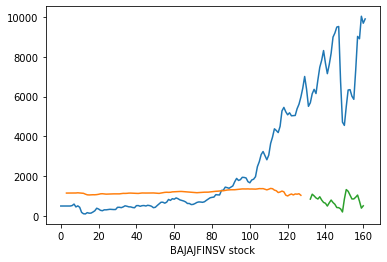

Epoch 1/20
2/2 [==============================] - 4s 601ms/step - loss: 0.5852 - val_loss: 0.8613
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.3414 - val_loss: 0.5415
Epoch 3/20
2/2 [==============================] - 0s 33ms/step - loss: 0.2437 - val_loss: 0.3751
Epoch 4/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1865 - val_loss: 0.2701
Epoch 5/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1521 - val_loss: 0.2032
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1288 - val_loss: 0.1583
Epoch 7/20
2/2 [==============================] - 0s 33ms/step - loss: 0.1107 - val_loss: 0.1289
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0970 - val_loss: 0.1066
Epoch 9/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0853 - val_loss: 0.0907
Epoch 10/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0754 - val_loss: 0.0780
Epoch 11/20
2/2 [===========

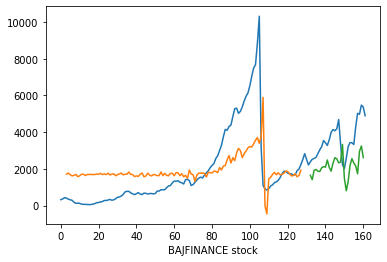

Epoch 1/20
2/2 [==============================] - 4s 601ms/step - loss: 0.6129 - val_loss: 0.6119
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.4603 - val_loss: 0.5001
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.3782 - val_loss: 0.4266
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.3252 - val_loss: 0.3740
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.2885 - val_loss: 0.3346
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.2619 - val_loss: 0.3039
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.2420 - val_loss: 0.2796
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.2266 - val_loss: 0.2599
Epoch 9/20
2/2 [==============================] - 0s 56ms/step - loss: 0.2145 - val_loss: 0.2435
Epoch 10/20
2/2 [==============================] - 0s 33ms/step - loss: 0.2049 - val_loss: 0.2296
Epoch 11/20
2/2 [===========

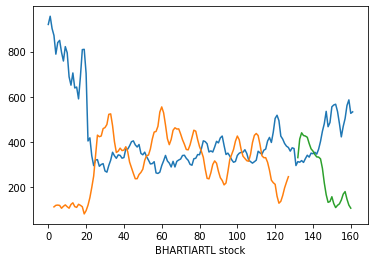

Epoch 1/20
2/2 [==============================] - 4s 592ms/step - loss: 0.1699 - val_loss: 0.0135
Epoch 2/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0925 - val_loss: 0.0050
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0630 - val_loss: 0.0037
Epoch 4/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0481 - val_loss: 0.0048
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0398 - val_loss: 0.0066
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0348 - val_loss: 0.0084
Epoch 7/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0316 - val_loss: 0.0101
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0294 - val_loss: 0.0115
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0278 - val_loss: 0.0126
Epoch 10/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0267 - val_loss: 0.0134
Epoch 11/20
2/2 [===========

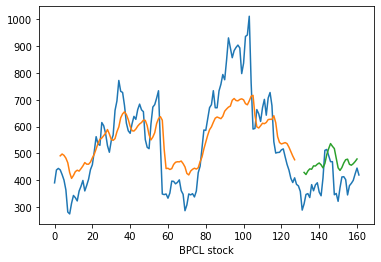

Epoch 1/20
2/2 [==============================] - 4s 605ms/step - loss: 0.0075 - val_loss: 0.0092
Epoch 2/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0067 - val_loss: 0.0085
Epoch 3/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0064 - val_loss: 0.0084
Epoch 4/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0063 - val_loss: 0.0083
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0063 - val_loss: 0.0082
Epoch 6/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0063 - val_loss: 0.0083
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0062 - val_loss: 0.0083
Epoch 8/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0062 - val_loss: 0.0083
Epoch 9/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0062 - val_loss: 0.0084
Epoch 10/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0062 - val_loss: 0.0084
Epoch 11/20
2/2 [===========

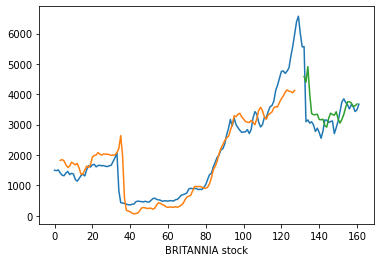

Epoch 1/20
2/2 [==============================] - 4s 605ms/step - loss: 0.3002 - val_loss: 0.2366
Epoch 2/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0910 - val_loss: 0.0954
Epoch 3/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0367 - val_loss: 0.0460
Epoch 4/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0207 - val_loss: 0.0274
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0155 - val_loss: 0.0201
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0132 - val_loss: 0.0162
Epoch 7/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0119 - val_loss: 0.0144
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0107 - val_loss: 0.0130
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0098 - val_loss: 0.0122
Epoch 10/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0090 - val_loss: 0.0114
Epoch 11/20
2/2 [===========

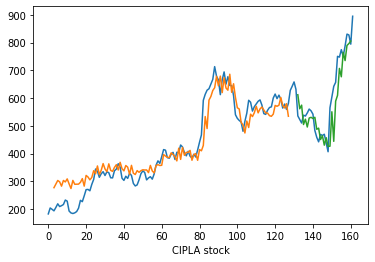

Epoch 1/20
2/2 [==============================] - 4s 619ms/step - loss: 0.1392 - val_loss: 0.0243
Epoch 2/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0654 - val_loss: 0.0436
Epoch 3/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0387 - val_loss: 0.0599
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0266 - val_loss: 0.0726
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0207 - val_loss: 0.0822
Epoch 6/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0177 - val_loss: 0.0895
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0160 - val_loss: 0.0947
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0151 - val_loss: 0.0987
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0146 - val_loss: 0.1013
Epoch 10/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0144 - val_loss: 0.1030
Epoch 11/20
2/2 [===========

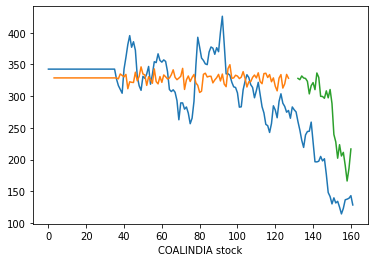

Epoch 1/20
2/2 [==============================] - 4s 588ms/step - loss: 0.1155 - val_loss: 0.1889
Epoch 2/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0297 - val_loss: 0.1215
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0193 - val_loss: 0.0996
Epoch 4/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0166 - val_loss: 0.0881
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0147 - val_loss: 0.0828
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0133 - val_loss: 0.0794
Epoch 7/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0121 - val_loss: 0.0755
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0111 - val_loss: 0.0727
Epoch 9/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0102 - val_loss: 0.0696
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0094 - val_loss: 0.0667
Epoch 11/20
2/2 [===========

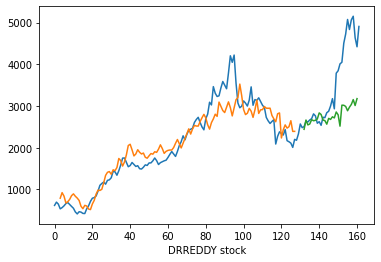

Epoch 1/20
2/2 [==============================] - 4s 630ms/step - loss: 0.0318 - val_loss: 0.0369
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0285 - val_loss: 0.0368
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0260 - val_loss: 0.0371
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0239 - val_loss: 0.0378
Epoch 5/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0223 - val_loss: 0.0386
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0209 - val_loss: 0.0397
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0198 - val_loss: 0.0408
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0189 - val_loss: 0.0419
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0182 - val_loss: 0.0430
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0175 - val_loss: 0.0442
Epoch 11/20
2/2 [===========

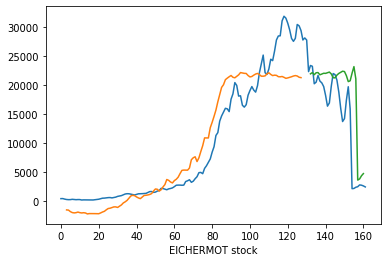

Epoch 1/20
2/2 [==============================] - 4s 610ms/step - loss: 0.0095 - val_loss: 0.0173
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0087 - val_loss: 0.0165
Epoch 3/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0085 - val_loss: 0.0156
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0086 - val_loss: 0.0163
Epoch 5/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0083 - val_loss: 0.0142
Epoch 6/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0082 - val_loss: 0.0143
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0083 - val_loss: 0.0129
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0080 - val_loss: 0.0137
Epoch 9/20
2/2 [==============================] - 0s 33ms/step - loss: 0.0084 - val_loss: 0.0125
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0080 - val_loss: 0.0133
Epoch 11/20
2/2 [===========

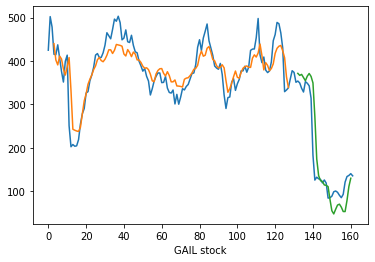

Epoch 1/20
2/2 [==============================] - 4s 584ms/step - loss: 1.2362 - val_loss: 0.0107
Epoch 2/20
2/2 [==============================] - 0s 32ms/step - loss: 0.8411 - val_loss: 0.0110
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.5767 - val_loss: 0.0262
Epoch 4/20
2/2 [==============================] - 0s 35ms/step - loss: 0.3852 - val_loss: 0.0468
Epoch 5/20
2/2 [==============================] - 0s 55ms/step - loss: 0.2519 - val_loss: 0.0669
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1681 - val_loss: 0.0836
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1205 - val_loss: 0.0958
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0952 - val_loss: 0.1041
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0820 - val_loss: 0.1094
Epoch 10/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0751 - val_loss: 0.1122
Epoch 11/20
2/2 [===========

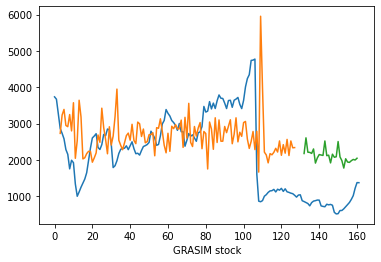

Epoch 1/20
2/2 [==============================] - 4s 620ms/step - loss: 0.3104 - val_loss: 0.2437
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1886 - val_loss: 0.1533
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1271 - val_loss: 0.1020
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0905 - val_loss: 0.0702
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0679 - val_loss: 0.0500
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0535 - val_loss: 0.0368
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0440 - val_loss: 0.0281
Epoch 8/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0376 - val_loss: 0.0222
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0330 - val_loss: 0.0183
Epoch 10/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0300 - val_loss: 0.0156
Epoch 11/20
2/2 [===========

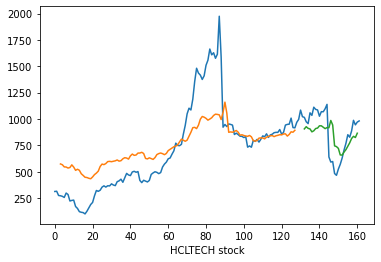

Epoch 1/20
2/2 [==============================] - 4s 630ms/step - loss: 0.2175 - val_loss: 0.3060
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1277 - val_loss: 0.1943
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0894 - val_loss: 0.1347
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0700 - val_loss: 0.1015
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0597 - val_loss: 0.0811
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0536 - val_loss: 0.0682
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0492 - val_loss: 0.0592
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0461 - val_loss: 0.0528
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0439 - val_loss: 0.0478
Epoch 10/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0416 - val_loss: 0.0445
Epoch 11/20
2/2 [===========

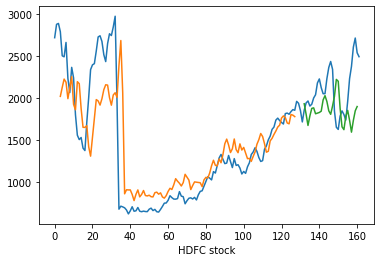

Epoch 1/20
2/2 [==============================] - 4s 600ms/step - loss: 0.1979 - val_loss: 0.1681
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0808 - val_loss: 0.0996
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0535 - val_loss: 0.0749
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0440 - val_loss: 0.0627
Epoch 5/20
2/2 [==============================] - 0s 71ms/step - loss: 0.0395 - val_loss: 0.0554
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0367 - val_loss: 0.0511
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0350 - val_loss: 0.0481
Epoch 8/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0334 - val_loss: 0.0459
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0322 - val_loss: 0.0443
Epoch 10/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0311 - val_loss: 0.0428
Epoch 11/20
2/2 [===========

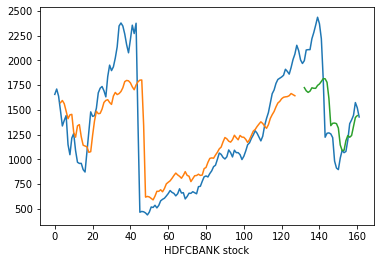

Epoch 1/20
2/2 [==============================] - 4s 609ms/step - loss: 0.6404 - val_loss: 0.6249
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.4031 - val_loss: 0.4105
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2682 - val_loss: 0.2831
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1879 - val_loss: 0.2038
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1385 - val_loss: 0.1525
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1067 - val_loss: 0.1182
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0856 - val_loss: 0.0942
Epoch 8/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0711 - val_loss: 0.0770
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0608 - val_loss: 0.0642
Epoch 10/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0532 - val_loss: 0.0544
Epoch 11/20
2/2 [===========

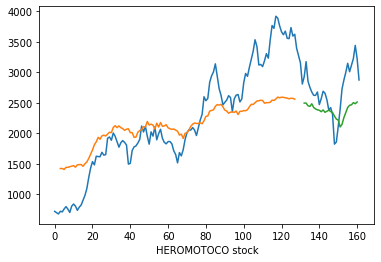

Epoch 1/20
2/2 [==============================] - 4s 608ms/step - loss: 0.0146 - val_loss: 0.0293
Epoch 2/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0134 - val_loss: 0.0277
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0132 - val_loss: 0.0277
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0131 - val_loss: 0.0294
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0128 - val_loss: 0.0284
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0129 - val_loss: 0.0287
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0128 - val_loss: 0.0284
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0124 - val_loss: 0.0273
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0125 - val_loss: 0.0277
Epoch 10/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0123 - val_loss: 0.0272
Epoch 11/20
2/2 [===========

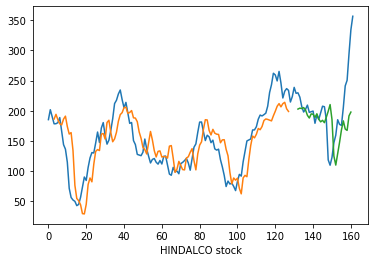

Epoch 1/20
2/2 [==============================] - 4s 569ms/step - loss: 0.1211 - val_loss: 0.8949
Epoch 2/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0766 - val_loss: 0.7672
Epoch 3/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0578 - val_loss: 0.6807
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0478 - val_loss: 0.6183
Epoch 5/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0419 - val_loss: 0.5716
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0381 - val_loss: 0.5331
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0350 - val_loss: 0.5031
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0328 - val_loss: 0.4769
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0307 - val_loss: 0.4556
Epoch 10/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0290 - val_loss: 0.4367
Epoch 11/20
2/2 [===========

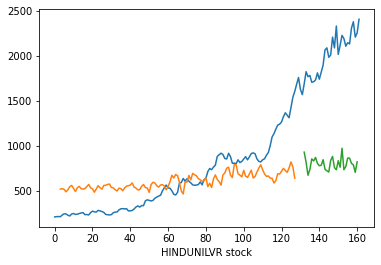

Epoch 1/20
2/2 [==============================] - 4s 615ms/step - loss: 0.6144 - val_loss: 0.0548
Epoch 2/20
2/2 [==============================] - 0s 37ms/step - loss: 0.4940 - val_loss: 0.0274
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.3989 - val_loss: 0.0129
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.3195 - val_loss: 0.0066
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2541 - val_loss: 0.0054
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2027 - val_loss: 0.0071
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1636 - val_loss: 0.0102
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1345 - val_loss: 0.0139
Epoch 9/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1141 - val_loss: 0.0174
Epoch 10/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0986 - val_loss: 0.0206
Epoch 11/20
2/2 [===========

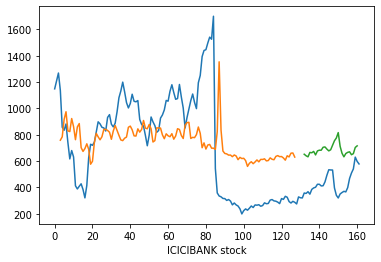

Epoch 1/20
2/2 [==============================] - 4s 612ms/step - loss: 0.4354 - val_loss: 0.7332
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2590 - val_loss: 0.4951
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1775 - val_loss: 0.3616
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1328 - val_loss: 0.2765
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1056 - val_loss: 0.2199
Epoch 6/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0889 - val_loss: 0.1796
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0759 - val_loss: 0.1515
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0674 - val_loss: 0.1310
Epoch 9/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0608 - val_loss: 0.1147
Epoch 10/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0558 - val_loss: 0.1016
Epoch 11/20
2/2 [===========

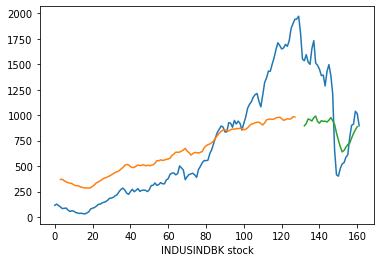

Epoch 1/20
2/2 [==============================] - 4s 647ms/step - loss: 0.1906 - val_loss: 0.0048
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1161 - val_loss: 0.0106
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0847 - val_loss: 0.0154
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0672 - val_loss: 0.0183
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0571 - val_loss: 0.0197
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0502 - val_loss: 0.0199
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0453 - val_loss: 0.0193
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0416 - val_loss: 0.0182
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0387 - val_loss: 0.0169
Epoch 10/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0361 - val_loss: 0.0152
Epoch 11/20
2/2 [===========

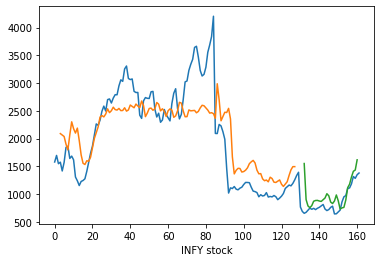

Epoch 1/20
2/2 [==============================] - 4s 645ms/step - loss: 0.1367 - val_loss: 0.0054
Epoch 2/20
2/2 [==============================] - 0s 60ms/step - loss: 0.0761 - val_loss: 0.0135
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0511 - val_loss: 0.0207
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0395 - val_loss: 0.0262
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0335 - val_loss: 0.0305
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0304 - val_loss: 0.0334
Epoch 7/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0288 - val_loss: 0.0351
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0279 - val_loss: 0.0362
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0273 - val_loss: 0.0367
Epoch 10/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0270 - val_loss: 0.0367
Epoch 11/20
2/2 [===========

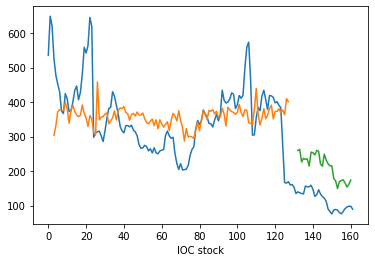

Epoch 1/20
2/2 [==============================] - 4s 613ms/step - loss: 0.0719 - val_loss: 0.0154
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0375 - val_loss: 0.0168
Epoch 3/20
2/2 [==============================] - 0s 59ms/step - loss: 0.0279 - val_loss: 0.0184
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0239 - val_loss: 0.0194
Epoch 5/20
2/2 [==============================] - 0s 60ms/step - loss: 0.0217 - val_loss: 0.0197
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0202 - val_loss: 0.0197
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0191 - val_loss: 0.0196
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0183 - val_loss: 0.0192
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0176 - val_loss: 0.0190
Epoch 10/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0170 - val_loss: 0.0189
Epoch 11/20
2/2 [===========

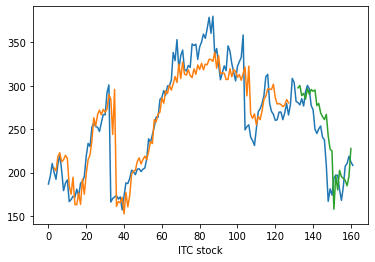

Epoch 1/20
2/2 [==============================] - 4s 607ms/step - loss: 1.6615 - val_loss: 0.0118
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.8388 - val_loss: 0.0236
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.4757 - val_loss: 0.0543
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.2956 - val_loss: 0.0846
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2020 - val_loss: 0.1097
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1506 - val_loss: 0.1289
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1208 - val_loss: 0.1427
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1025 - val_loss: 0.1524
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0910 - val_loss: 0.1584
Epoch 10/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0833 - val_loss: 0.1618
Epoch 11/20
2/2 [===========

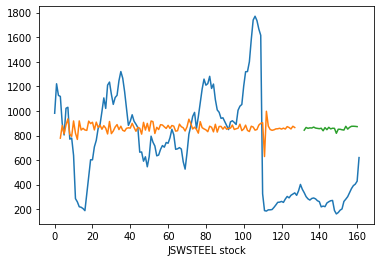

Epoch 1/20
2/2 [==============================] - 5s 643ms/step - loss: 0.2651 - val_loss: 0.8590
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1830 - val_loss: 0.7185
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1355 - val_loss: 0.6186
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1044 - val_loss: 0.5436
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0826 - val_loss: 0.4849
Epoch 6/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0670 - val_loss: 0.4377
Epoch 7/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0555 - val_loss: 0.3997
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0470 - val_loss: 0.3680
Epoch 9/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0406 - val_loss: 0.3414
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0358 - val_loss: 0.3195
Epoch 11/20
2/2 [===========

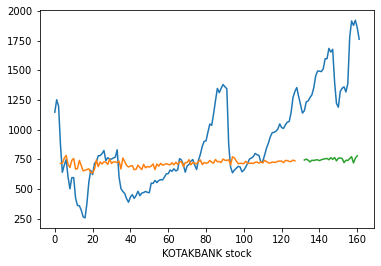

Epoch 1/20
2/2 [==============================] - 4s 620ms/step - loss: 0.0160 - val_loss: 0.0033
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0142 - val_loss: 0.0032
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0139 - val_loss: 0.0032
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0135 - val_loss: 0.0033
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0132 - val_loss: 0.0033
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0133 - val_loss: 0.0038
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0129 - val_loss: 0.0035
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0127 - val_loss: 0.0034
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0126 - val_loss: 0.0034
Epoch 10/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0127 - val_loss: 0.0035
Epoch 11/20
2/2 [===========

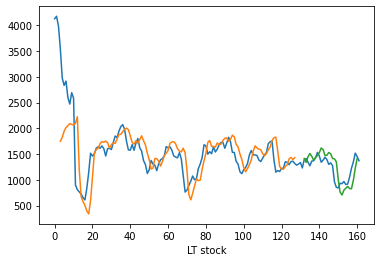

Epoch 1/20
2/2 [==============================] - 4s 610ms/step - loss: 0.1920 - val_loss: 0.0143
Epoch 2/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0953 - val_loss: 0.0115
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0640 - val_loss: 0.0159
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0506 - val_loss: 0.0211
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0442 - val_loss: 0.0257
Epoch 6/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0407 - val_loss: 0.0291
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0389 - val_loss: 0.0317
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0375 - val_loss: 0.0335
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0368 - val_loss: 0.0348
Epoch 10/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0361 - val_loss: 0.0356
Epoch 11/20
2/2 [===========

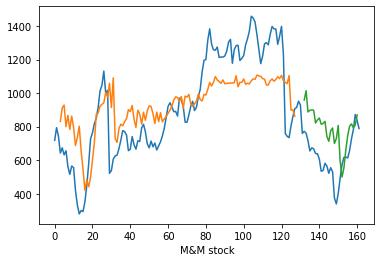

Epoch 1/20
2/2 [==============================] - 4s 620ms/step - loss: 0.0526 - val_loss: 0.1456
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0380 - val_loss: 0.1131
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0319 - val_loss: 0.0932
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0281 - val_loss: 0.0801
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0255 - val_loss: 0.0708
Epoch 6/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0234 - val_loss: 0.0635
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0214 - val_loss: 0.0570
Epoch 8/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0197 - val_loss: 0.0514
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0182 - val_loss: 0.0465
Epoch 10/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0169 - val_loss: 0.0425
Epoch 11/20
2/2 [===========

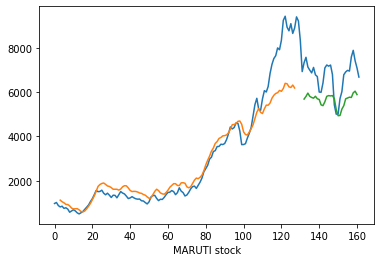

Epoch 1/20
2/2 [==============================] - 4s 610ms/step - loss: 0.0089 - val_loss: 0.2656
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0072 - val_loss: 0.2562
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0061 - val_loss: 0.2488
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0053 - val_loss: 0.2425
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0048 - val_loss: 0.2373
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0044 - val_loss: 0.2330
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0042 - val_loss: 0.2293
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0040 - val_loss: 0.2261
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0039 - val_loss: 0.2234
Epoch 10/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0038 - val_loss: 0.2210
Epoch 11/20
2/2 [===========

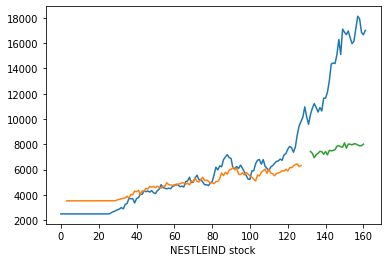

Epoch 1/20
2/2 [==============================] - 4s 607ms/step - loss: 0.9668 - val_loss: 0.1684
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.7523 - val_loss: 0.1020
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.5657 - val_loss: 0.0610
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.4074 - val_loss: 0.0407
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2878 - val_loss: 0.0342
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2047 - val_loss: 0.0350
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1499 - val_loss: 0.0389
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1143 - val_loss: 0.0440
Epoch 9/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0906 - val_loss: 0.0491
Epoch 10/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0744 - val_loss: 0.0541
Epoch 11/20
2/2 [===========

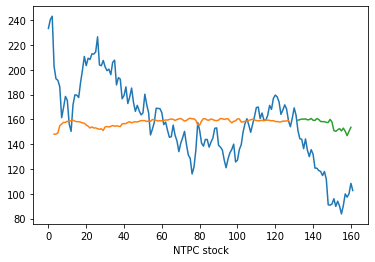

Epoch 1/20
2/2 [==============================] - 4s 649ms/step - loss: 0.0432 - val_loss: 0.0015
Epoch 2/20
2/2 [==============================] - 0s 59ms/step - loss: 0.0327 - val_loss: 0.0033
Epoch 3/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0285 - val_loss: 0.0045
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0262 - val_loss: 0.0051
Epoch 5/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0248 - val_loss: 0.0053
Epoch 6/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0235 - val_loss: 0.0050
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0228 - val_loss: 0.0044
Epoch 8/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0219 - val_loss: 0.0041
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0211 - val_loss: 0.0037
Epoch 10/20
2/2 [==============================] - 0s 63ms/step - loss: 0.0205 - val_loss: 0.0032
Epoch 11/20
2/2 [===========

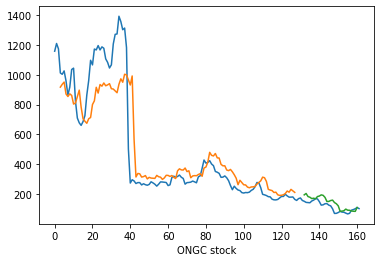

Epoch 1/20
2/2 [==============================] - 4s 604ms/step - loss: 0.2000 - val_loss: 0.4312
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1174 - val_loss: 0.3047
Epoch 3/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0781 - val_loss: 0.2264
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0568 - val_loss: 0.1751
Epoch 5/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0447 - val_loss: 0.1409
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0375 - val_loss: 0.1171
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0328 - val_loss: 0.0999
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0296 - val_loss: 0.0869
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0273 - val_loss: 0.0773
Epoch 10/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0257 - val_loss: 0.0700
Epoch 11/20
2/2 [===========

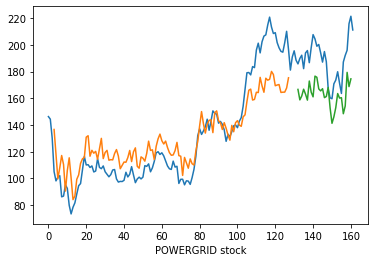

Epoch 1/20
2/2 [==============================] - 4s 609ms/step - loss: 0.3263 - val_loss: 0.6062
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2414 - val_loss: 0.4830
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1979 - val_loss: 0.4014
Epoch 4/20
2/2 [==============================] - 0s 67ms/step - loss: 0.1709 - val_loss: 0.3413
Epoch 5/20
2/2 [==============================] - 0s 59ms/step - loss: 0.1523 - val_loss: 0.2948
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1381 - val_loss: 0.2589
Epoch 7/20
2/2 [==============================] - 0s 61ms/step - loss: 0.1270 - val_loss: 0.2315
Epoch 8/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1176 - val_loss: 0.2088
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1112 - val_loss: 0.1913
Epoch 10/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1027 - val_loss: 0.1751
Epoch 11/20
2/2 [===========

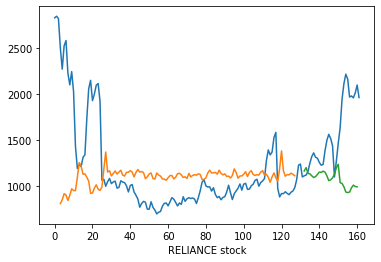

Epoch 1/20
2/2 [==============================] - 4s 634ms/step - loss: 0.5431 - val_loss: 6.8004e-04
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.3857 - val_loss: 0.0033
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2810 - val_loss: 0.0072
Epoch 4/20
2/2 [==============================] - 0s 50ms/step - loss: 0.2101 - val_loss: 0.0114
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1622 - val_loss: 0.0153
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1295 - val_loss: 0.0187
Epoch 7/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1065 - val_loss: 0.0217
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0902 - val_loss: 0.0241
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0783 - val_loss: 0.0262
Epoch 10/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0694 - val_loss: 0.0279
Epoch 11/20
2/2 [=======

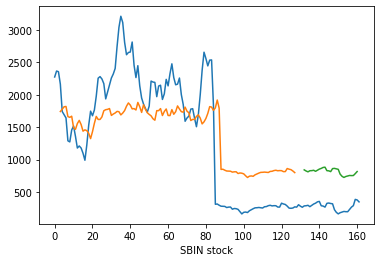

Epoch 1/20
2/2 [==============================] - 4s 595ms/step - loss: 0.2846 - val_loss: 1.1910
Epoch 2/20
2/2 [==============================] - 0s 58ms/step - loss: 0.2149 - val_loss: 0.9975
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1699 - val_loss: 0.8454
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1381 - val_loss: 0.7256
Epoch 5/20
2/2 [==============================] - 0s 59ms/step - loss: 0.1148 - val_loss: 0.6280
Epoch 6/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0971 - val_loss: 0.5490
Epoch 7/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0839 - val_loss: 0.4845
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0735 - val_loss: 0.4303
Epoch 9/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0653 - val_loss: 0.3855
Epoch 10/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0589 - val_loss: 0.3487
Epoch 11/20
2/2 [===========

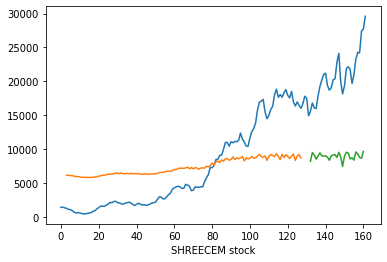

Epoch 1/20
2/2 [==============================] - 4s 612ms/step - loss: 0.0231 - val_loss: 0.0014
Epoch 2/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0209 - val_loss: 0.0018
Epoch 3/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0197 - val_loss: 0.0023
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0190 - val_loss: 0.0027
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0186 - val_loss: 0.0030
Epoch 6/20
2/2 [==============================] - 0s 68ms/step - loss: 0.0183 - val_loss: 0.0033
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0180 - val_loss: 0.0034
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0179 - val_loss: 0.0035
Epoch 9/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0177 - val_loss: 0.0036
Epoch 10/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0176 - val_loss: 0.0036
Epoch 11/20
2/2 [===========

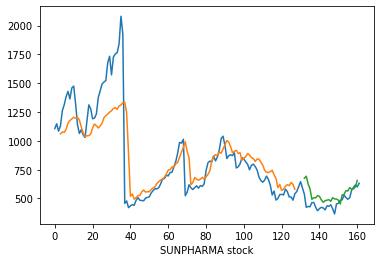

Epoch 1/20
2/2 [==============================] - 5s 676ms/step - loss: 0.8193 - val_loss: 0.0092
Epoch 2/20
2/2 [==============================] - 0s 61ms/step - loss: 0.4339 - val_loss: 0.0074
Epoch 3/20
2/2 [==============================] - 0s 63ms/step - loss: 0.2674 - val_loss: 0.0155
Epoch 4/20
2/2 [==============================] - 0s 55ms/step - loss: 0.1830 - val_loss: 0.0254
Epoch 5/20
2/2 [==============================] - 0s 53ms/step - loss: 0.1348 - val_loss: 0.0350
Epoch 6/20
2/2 [==============================] - 0s 64ms/step - loss: 0.1059 - val_loss: 0.0433
Epoch 7/20
2/2 [==============================] - 0s 65ms/step - loss: 0.0880 - val_loss: 0.0502
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0765 - val_loss: 0.0555
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0690 - val_loss: 0.0598
Epoch 10/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0637 - val_loss: 0.0626
Epoch 11/20
2/2 [===========

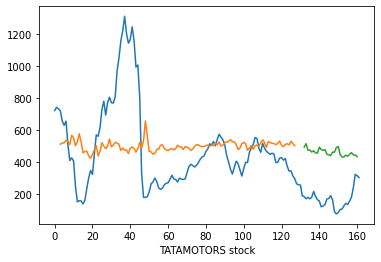

Epoch 1/20
2/2 [==============================] - 4s 629ms/step - loss: 1.0629 - val_loss: 0.5333
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.4941 - val_loss: 0.2833
Epoch 3/20
2/2 [==============================] - 0s 48ms/step - loss: 0.2738 - val_loss: 0.1693
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1714 - val_loss: 0.1115
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1178 - val_loss: 0.0795
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0879 - val_loss: 0.0613
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0705 - val_loss: 0.0506
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0600 - val_loss: 0.0441
Epoch 9/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0535 - val_loss: 0.0402
Epoch 10/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0493 - val_loss: 0.0377
Epoch 11/20
2/2 [===========

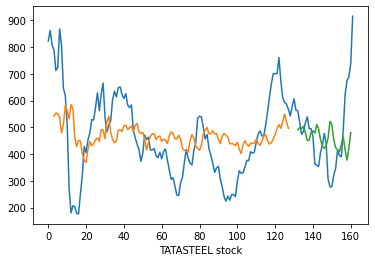

Epoch 1/20
2/2 [==============================] - 4s 613ms/step - loss: 0.0488 - val_loss: 0.0375
Epoch 2/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0228 - val_loss: 0.0236
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0142 - val_loss: 0.0177
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0110 - val_loss: 0.0151
Epoch 5/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0097 - val_loss: 0.0139
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0093 - val_loss: 0.0133
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0090 - val_loss: 0.0129
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0089 - val_loss: 0.0126
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0088 - val_loss: 0.0125
Epoch 10/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0088 - val_loss: 0.0124
Epoch 11/20
2/2 [===========

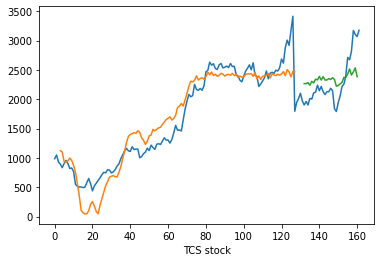

Epoch 1/20
2/2 [==============================] - 4s 636ms/step - loss: 0.2973 - val_loss: 0.0776
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1700 - val_loss: 0.0292
Epoch 3/20
2/2 [==============================] - 0s 53ms/step - loss: 0.1201 - val_loss: 0.0122
Epoch 4/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0966 - val_loss: 0.0077
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0842 - val_loss: 0.0070
Epoch 6/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0760 - val_loss: 0.0072
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0700 - val_loss: 0.0075
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0647 - val_loss: 0.0077
Epoch 9/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0602 - val_loss: 0.0079
Epoch 10/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0562 - val_loss: 0.0080
Epoch 11/20
2/2 [===========

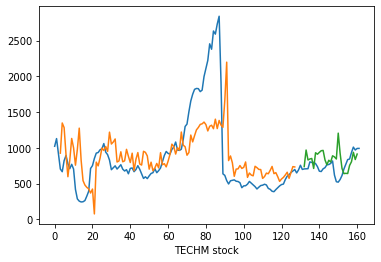

Epoch 1/20
2/2 [==============================] - 4s 597ms/step - loss: 0.0216 - val_loss: 0.0029
Epoch 2/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0199 - val_loss: 0.0019
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0194 - val_loss: 0.0018
Epoch 4/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0189 - val_loss: 0.0016
Epoch 5/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0185 - val_loss: 0.0015
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0183 - val_loss: 0.0014
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0181 - val_loss: 0.0014
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0177 - val_loss: 0.0014
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0176 - val_loss: 0.0014
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0173 - val_loss: 0.0013
Epoch 11/20
2/2 [===========

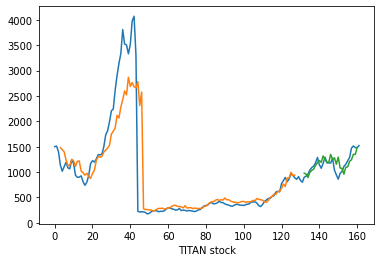

Epoch 1/20
2/2 [==============================] - 4s 595ms/step - loss: 0.0196 - val_loss: 0.1307
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0166 - val_loss: 0.1128
Epoch 3/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0147 - val_loss: 0.1067
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0131 - val_loss: 0.0949
Epoch 5/20
2/2 [==============================] - 0s 60ms/step - loss: 0.0119 - val_loss: 0.0892
Epoch 6/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0111 - val_loss: 0.0818
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0103 - val_loss: 0.0779
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0097 - val_loss: 0.0745
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0093 - val_loss: 0.0709
Epoch 10/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0091 - val_loss: 0.0695
Epoch 11/20
2/2 [===========

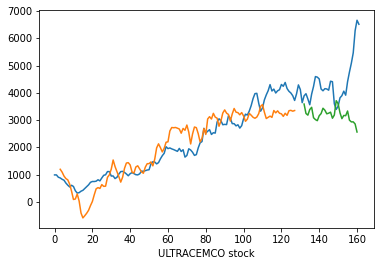

Epoch 1/20
2/2 [==============================] - 4s 624ms/step - loss: 0.0890 - val_loss: 9.7592e-05
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0421 - val_loss: 6.1010e-04
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0397 - val_loss: 0.0010
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0382 - val_loss: 0.0012
Epoch 5/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0358 - val_loss: 6.3736e-04
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0344 - val_loss: 3.3430e-04
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0330 - val_loss: 5.1013e-04
Epoch 8/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0321 - val_loss: 2.7095e-04
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0313 - val_loss: 9.6181e-04
Epoch 10/20
2/2 [==============================] - 0s 69ms/step - loss: 0.0300 - val_loss: 5.5356e

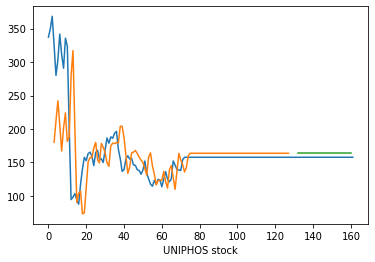

Epoch 1/20
2/2 [==============================] - 4s 610ms/step - loss: 0.2737 - val_loss: 0.5635
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1794 - val_loss: 0.3886
Epoch 3/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1294 - val_loss: 0.2839
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0986 - val_loss: 0.2152
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0785 - val_loss: 0.1703
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0649 - val_loss: 0.1387
Epoch 7/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0547 - val_loss: 0.1163
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0470 - val_loss: 0.0997
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0408 - val_loss: 0.0870
Epoch 10/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0358 - val_loss: 0.0772
Epoch 11/20
2/2 [===========

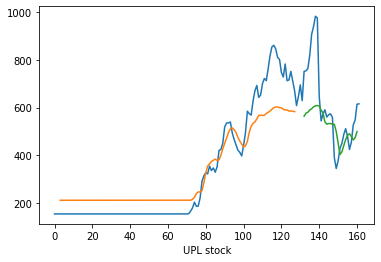

Epoch 1/20
2/2 [==============================] - 4s 622ms/step - loss: 0.1646 - val_loss: 0.0076
Epoch 2/20
2/2 [==============================] - 0s 52ms/step - loss: 0.1265 - val_loss: 0.0105
Epoch 3/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1128 - val_loss: 0.0094
Epoch 4/20
2/2 [==============================] - 0s 53ms/step - loss: 0.1023 - val_loss: 0.0108
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0913 - val_loss: 0.0086
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0841 - val_loss: 0.0073
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0773 - val_loss: 0.0065
Epoch 8/20
2/2 [==============================] - 0s 66ms/step - loss: 0.0710 - val_loss: 0.0072
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0656 - val_loss: 0.0060
Epoch 10/20
2/2 [==============================] - 0s 65ms/step - loss: 0.0615 - val_loss: 0.0051
Epoch 11/20
2/2 [===========

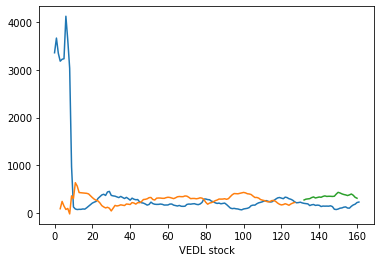

Epoch 1/20
2/2 [==============================] - 4s 605ms/step - loss: 0.7361 - val_loss: 0.1470
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.4255 - val_loss: 0.0784
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2620 - val_loss: 0.0438
Epoch 4/20
2/2 [==============================] - 0s 71ms/step - loss: 0.1646 - val_loss: 0.0264
Epoch 5/20
2/2 [==============================] - 0s 62ms/step - loss: 0.1048 - val_loss: 0.0183
Epoch 6/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0683 - val_loss: 0.0154
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0466 - val_loss: 0.0150
Epoch 8/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0338 - val_loss: 0.0158
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0263 - val_loss: 0.0169
Epoch 10/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0220 - val_loss: 0.0181
Epoch 11/20
2/2 [===========

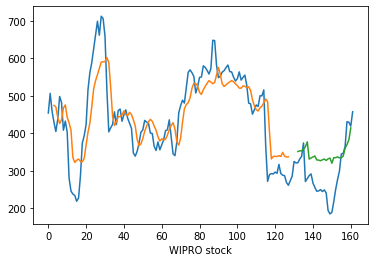

Epoch 1/20
2/2 [==============================] - 4s 605ms/step - loss: 0.0958 - val_loss: 0.0838
Epoch 2/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0446 - val_loss: 0.0482
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0248 - val_loss: 0.0314
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0167 - val_loss: 0.0233
Epoch 5/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0133 - val_loss: 0.0190
Epoch 6/20
2/2 [==============================] - 0s 60ms/step - loss: 0.0118 - val_loss: 0.0166
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0111 - val_loss: 0.0152
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0107 - val_loss: 0.0143
Epoch 9/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0105 - val_loss: 0.0138
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0104 - val_loss: 0.0134
Epoch 11/20
2/2 [===========

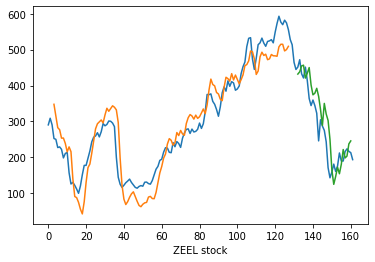

In [ ]:
for i in df_2.columns:
    scaler=MinMaxScaler(feature_range=(0,1))
    df_21=scaler.fit_transform(np.array(df_2[i]).reshape(-1,1))


    train_data,test_data=df_21[0:129],df_21[129:len(df_2)]

    time_step = 3
    X_train, y_train = create_dataset(train_data, time_step)
    X_test, ytest = create_dataset(test_data, time_step)
    model=Sequential()
    model.add(SimpleRNN(32,return_sequences=True,input_shape=(3,1)))
    model.add(SimpleRNN(24,return_sequences=True))
    model.add(SimpleRNN(10,return_sequences=True))
    model.add(SimpleRNN(5))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error',optimizer='adagrad')
    model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=20,batch_size=64,verbose=1)
    train_predict=model.predict(X_train)
    test_predict=model.predict(X_test)



    train_predict=scaler.inverse_transform(train_predict)
    test_predict=scaler.inverse_transform(test_predict)
    mae = metrics.mean_absolute_error(ytest,test_predict)
    mse = metrics.mean_squared_error(ytest,test_predict)
    rmse = np.sqrt(mse) #mse**(0.5)
    error_rnn.append(mae)

    print("Results of sklearn.metrics:")
    print("MAE:",mae)
    print("RMSE:", rmse)

    look_back=3
    trainPredictPlot = np.empty_like(df_21)
    trainPredictPlot[:, :] = np.nan
    trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
    # shift test predictions for plotting
    testPredictPlot = np.empty_like(df_21)
    testPredictPlot[:, :] = np.nan
    testPredictPlot[len(train_predict)+(look_back*2)+1:len(df_21)-1, :] = test_predict
    # plot baseline and predictions
    plt.plot(scaler.inverse_transform(df_21))
    plt.plot(trainPredictPlot)
    plt.plot(testPredictPlot)
    plt.xlabel(i+' stock')
    plt.show()




In [ ]:
## LSTM

Epoch 1/20
2/2 [==============================] - 9s 2s/step - loss: 0.0756 - val_loss: 0.0804
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0710 - val_loss: 0.0749
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0669 - val_loss: 0.0696
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0626 - val_loss: 0.0643
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0587 - val_loss: 0.0590
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0545 - val_loss: 0.0538
Epoch 7/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0508 - val_loss: 0.0485
Epoch 8/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0467 - val_loss: 0.0432
Epoch 9/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0429 - val_loss: 0.0379
Epoch 10/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0395 - val_loss: 0.0327
Epoch 11/20
2/2 [==============

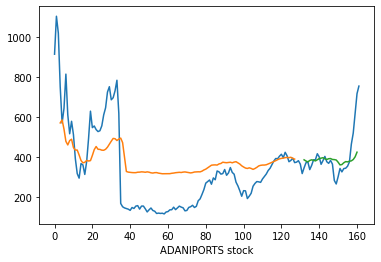

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1622 - val_loss: 0.0936
Epoch 2/20
2/2 [==============================] - 0s 54ms/step - loss: 0.1550 - val_loss: 0.0873
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1476 - val_loss: 0.0810
Epoch 4/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1404 - val_loss: 0.0748
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1332 - val_loss: 0.0685
Epoch 6/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1258 - val_loss: 0.0622
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1188 - val_loss: 0.0558
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1111 - val_loss: 0.0494
Epoch 9/20
2/2 [==============================] - 0s 34ms/step - loss: 0.1031 - val_loss: 0.0429
Epoch 10/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0951 - val_loss: 0.0365
Epoch 11/20
2/2 [==============

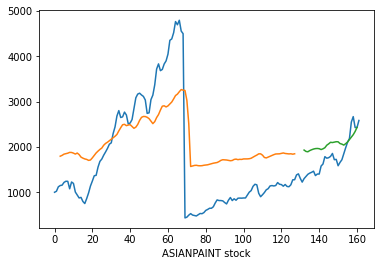

Epoch 1/20
2/2 [==============================] - 9s 1s/step - loss: 0.1730 - val_loss: 0.0363
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1646 - val_loss: 0.0329
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1570 - val_loss: 0.0296
Epoch 4/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1489 - val_loss: 0.0265
Epoch 5/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1410 - val_loss: 0.0235
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1334 - val_loss: 0.0205
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1252 - val_loss: 0.0177
Epoch 8/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1167 - val_loss: 0.0151
Epoch 9/20
2/2 [==============================] - 0s 34ms/step - loss: 0.1083 - val_loss: 0.0126
Epoch 10/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0998 - val_loss: 0.0103
Epoch 11/20
2/2 [==============

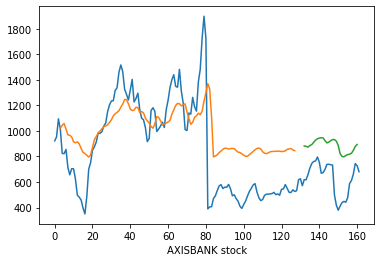

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.2119 - val_loss: 0.4861
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2037 - val_loss: 0.4709
Epoch 3/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1953 - val_loss: 0.4553
Epoch 4/20
2/2 [==============================] - 0s 53ms/step - loss: 0.1871 - val_loss: 0.4391
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1785 - val_loss: 0.4222
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1697 - val_loss: 0.4043
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1604 - val_loss: 0.3852
Epoch 8/20
2/2 [==============================] - 0s 54ms/step - loss: 0.1504 - val_loss: 0.3648
Epoch 9/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1398 - val_loss: 0.3428
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1291 - val_loss: 0.3189
Epoch 11/20
2/2 [==============

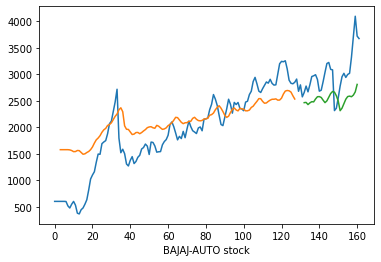

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0419 - val_loss: 0.5422
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0393 - val_loss: 0.5232
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0367 - val_loss: 0.5039
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0342 - val_loss: 0.4842
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0320 - val_loss: 0.4635
Epoch 6/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0298 - val_loss: 0.4417
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0277 - val_loss: 0.4188
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0255 - val_loss: 0.3949
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0236 - val_loss: 0.3698
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0221 - val_loss: 0.3434
Epoch 11/20
2/2 [==============

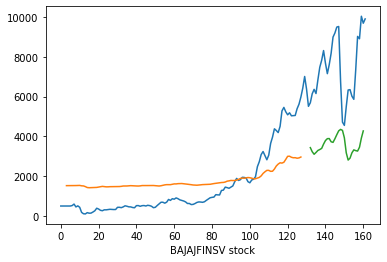

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.0650 - val_loss: 0.1146
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0616 - val_loss: 0.1083
Epoch 3/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0584 - val_loss: 0.1020
Epoch 4/20
2/2 [==============================] - 0s 34ms/step - loss: 0.0557 - val_loss: 0.0955
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0527 - val_loss: 0.0890
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0496 - val_loss: 0.0824
Epoch 7/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0467 - val_loss: 0.0756
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0436 - val_loss: 0.0687
Epoch 9/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0407 - val_loss: 0.0618
Epoch 10/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0380 - val_loss: 0.0547
Epoch 11/20
2/2 [==============

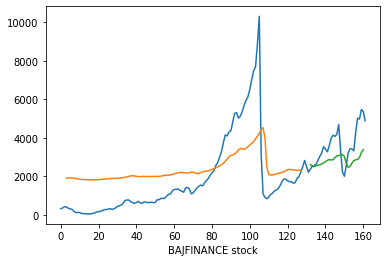

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.0888 - val_loss: 0.0765
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0854 - val_loss: 0.0726
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0818 - val_loss: 0.0686
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0780 - val_loss: 0.0645
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0743 - val_loss: 0.0604
Epoch 6/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0706 - val_loss: 0.0562
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0665 - val_loss: 0.0519
Epoch 8/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0627 - val_loss: 0.0475
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0585 - val_loss: 0.0430
Epoch 10/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0543 - val_loss: 0.0384
Epoch 11/20
2/2 [==============

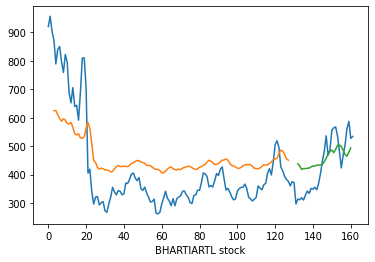

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2118 - val_loss: 0.0279
Epoch 2/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1978 - val_loss: 0.0241
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1849 - val_loss: 0.0205
Epoch 4/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1718 - val_loss: 0.0172
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1592 - val_loss: 0.0142
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1463 - val_loss: 0.0115
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1334 - val_loss: 0.0091
Epoch 8/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1207 - val_loss: 0.0072
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1078 - val_loss: 0.0058
Epoch 10/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0948 - val_loss: 0.0051
Epoch 11/20
2/2 [==============

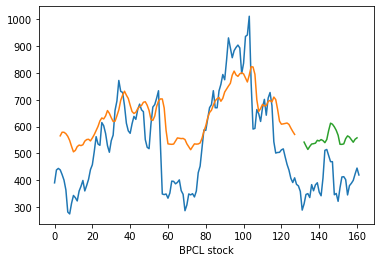

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1009 - val_loss: 0.2149
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0940 - val_loss: 0.1998
Epoch 3/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0872 - val_loss: 0.1850
Epoch 4/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0811 - val_loss: 0.1705
Epoch 5/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0746 - val_loss: 0.1563
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0689 - val_loss: 0.1420
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.0630 - val_loss: 0.1278
Epoch 8/20
2/2 [==============================] - 0s 35ms/step - loss: 0.0573 - val_loss: 0.1137
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.0522 - val_loss: 0.0996
Epoch 10/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0469 - val_loss: 0.0856
Epoch 11/20
2/2 [==============

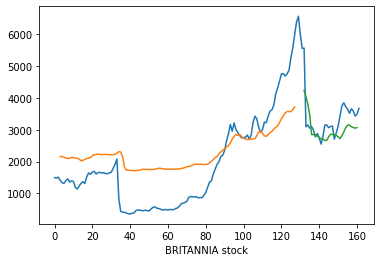

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1622 - val_loss: 0.3680
Epoch 2/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1526 - val_loss: 0.3505
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1436 - val_loss: 0.3333
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1348 - val_loss: 0.3162
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1261 - val_loss: 0.2990
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1175 - val_loss: 0.2815
Epoch 7/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1086 - val_loss: 0.2637
Epoch 8/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1000 - val_loss: 0.2454
Epoch 9/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0913 - val_loss: 0.2266
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.0827 - val_loss: 0.2072
Epoch 11/20
2/2 [==============

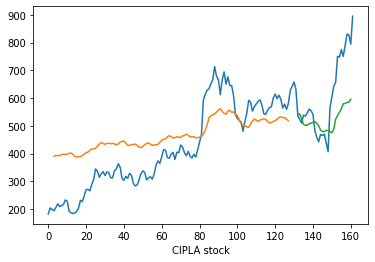

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.4560 - val_loss: 0.0622
Epoch 2/20
2/2 [==============================] - 0s 54ms/step - loss: 0.4368 - val_loss: 0.0575
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.4177 - val_loss: 0.0529
Epoch 4/20
2/2 [==============================] - 0s 35ms/step - loss: 0.3975 - val_loss: 0.0483
Epoch 5/20
2/2 [==============================] - 0s 35ms/step - loss: 0.3770 - val_loss: 0.0437
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.3552 - val_loss: 0.0392
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.3327 - val_loss: 0.0347
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.3090 - val_loss: 0.0304
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2841 - val_loss: 0.0262
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.2582 - val_loss: 0.0224
Epoch 11/20
2/2 [==============

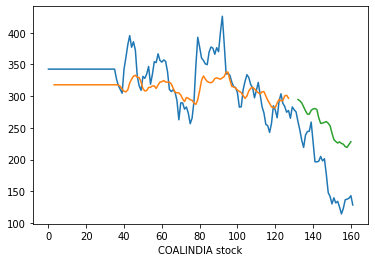

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1568 - val_loss: 0.4436
Epoch 2/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1508 - val_loss: 0.4312
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1450 - val_loss: 0.4186
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1390 - val_loss: 0.4058
Epoch 5/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1330 - val_loss: 0.3925
Epoch 6/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1270 - val_loss: 0.3786
Epoch 7/20
2/2 [==============================] - 0s 35ms/step - loss: 0.1207 - val_loss: 0.3641
Epoch 8/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1140 - val_loss: 0.3488
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1072 - val_loss: 0.3327
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1003 - val_loss: 0.3154
Epoch 11/20
2/2 [==============

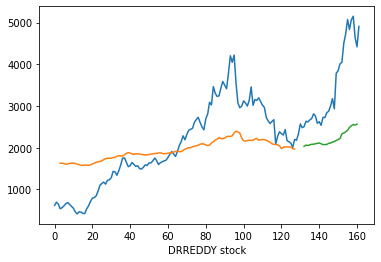

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1927 - val_loss: 0.2712
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1871 - val_loss: 0.2623
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1813 - val_loss: 0.2531
Epoch 4/20
2/2 [==============================] - 0s 57ms/step - loss: 0.1757 - val_loss: 0.2437
Epoch 5/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1701 - val_loss: 0.2340
Epoch 6/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1640 - val_loss: 0.2238
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1578 - val_loss: 0.2131
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1512 - val_loss: 0.2019
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1444 - val_loss: 0.1900
Epoch 10/20
2/2 [==============================] - 0s 36ms/step - loss: 0.1371 - val_loss: 0.1773
Epoch 11/20
2/2 [==============

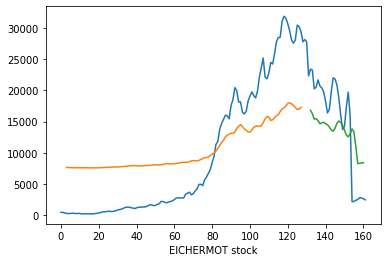

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.5398 - val_loss: 0.1086
Epoch 2/20
2/2 [==============================] - 0s 56ms/step - loss: 0.5254 - val_loss: 0.1048
Epoch 3/20
2/2 [==============================] - 0s 55ms/step - loss: 0.5113 - val_loss: 0.1010
Epoch 4/20
2/2 [==============================] - 0s 41ms/step - loss: 0.4972 - val_loss: 0.0973
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.4829 - val_loss: 0.0936
Epoch 6/20
2/2 [==============================] - 0s 56ms/step - loss: 0.4684 - val_loss: 0.0898
Epoch 7/20
2/2 [==============================] - 0s 40ms/step - loss: 0.4532 - val_loss: 0.0860
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.4371 - val_loss: 0.0820
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.4203 - val_loss: 0.0779
Epoch 10/20
2/2 [==============================] - 0s 44ms/step - loss: 0.4020 - val_loss: 0.0736
Epoch 11/20
2/2 [==============

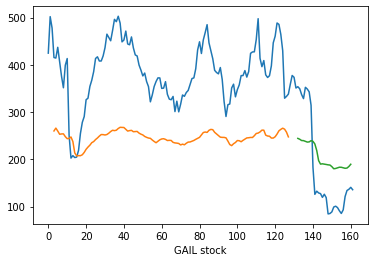

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.2554 - val_loss: 0.0047
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.2406 - val_loss: 0.0036
Epoch 3/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2258 - val_loss: 0.0027
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2104 - val_loss: 0.0021
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1959 - val_loss: 0.0017
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1812 - val_loss: 0.0017
Epoch 7/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1658 - val_loss: 0.0022
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1503 - val_loss: 0.0030
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1350 - val_loss: 0.0045
Epoch 10/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1187 - val_loss: 0.0068
Epoch 11/20
2/2 [==============

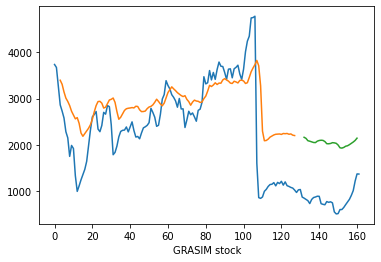

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.1519 - val_loss: 0.1696
Epoch 2/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1429 - val_loss: 0.1585
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1335 - val_loss: 0.1478
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1251 - val_loss: 0.1372
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1167 - val_loss: 0.1266
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1082 - val_loss: 0.1160
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0999 - val_loss: 0.1052
Epoch 8/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0917 - val_loss: 0.0943
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0833 - val_loss: 0.0833
Epoch 10/20
2/2 [==============================] - 0s 59ms/step - loss: 0.0745 - val_loss: 0.0724
Epoch 11/20
2/2 [==============

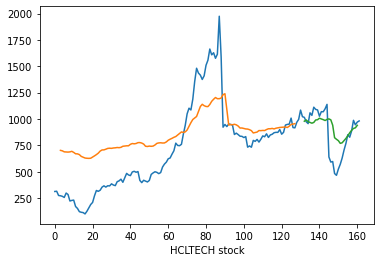

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1828 - val_loss: 0.3916
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1745 - val_loss: 0.3750
Epoch 3/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1662 - val_loss: 0.3585
Epoch 4/20
2/2 [==============================] - 0s 59ms/step - loss: 0.1583 - val_loss: 0.3419
Epoch 5/20
2/2 [==============================] - 0s 37ms/step - loss: 0.1505 - val_loss: 0.3249
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1423 - val_loss: 0.3074
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1339 - val_loss: 0.2893
Epoch 8/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1255 - val_loss: 0.2703
Epoch 9/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1172 - val_loss: 0.2504
Epoch 10/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1087 - val_loss: 0.2296
Epoch 11/20
2/2 [==============

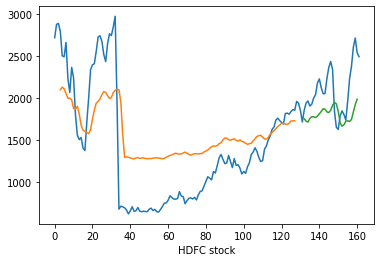

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.2248 - val_loss: 0.3756
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.2173 - val_loss: 0.3639
Epoch 3/20
2/2 [==============================] - 0s 38ms/step - loss: 0.2100 - val_loss: 0.3519
Epoch 4/20
2/2 [==============================] - 0s 38ms/step - loss: 0.2022 - val_loss: 0.3397
Epoch 5/20
2/2 [==============================] - 0s 56ms/step - loss: 0.1946 - val_loss: 0.3271
Epoch 6/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1869 - val_loss: 0.3138
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1784 - val_loss: 0.2997
Epoch 8/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1696 - val_loss: 0.2846
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1604 - val_loss: 0.2685
Epoch 10/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1504 - val_loss: 0.2511
Epoch 11/20
2/2 [==============

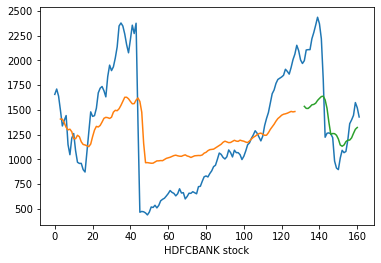

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2914 - val_loss: 0.3921
Epoch 2/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2806 - val_loss: 0.3778
Epoch 3/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2699 - val_loss: 0.3635
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2592 - val_loss: 0.3489
Epoch 5/20
2/2 [==============================] - 0s 39ms/step - loss: 0.2484 - val_loss: 0.3339
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2377 - val_loss: 0.3184
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2261 - val_loss: 0.3022
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2144 - val_loss: 0.2852
Epoch 9/20
2/2 [==============================] - 0s 40ms/step - loss: 0.2017 - val_loss: 0.2672
Epoch 10/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1890 - val_loss: 0.2483
Epoch 11/20
2/2 [==============

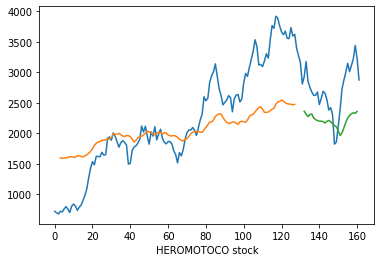

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1321 - val_loss: 0.2565
Epoch 2/20
2/2 [==============================] - 0s 38ms/step - loss: 0.1263 - val_loss: 0.2471
Epoch 3/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1204 - val_loss: 0.2376
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1147 - val_loss: 0.2280
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1087 - val_loss: 0.2180
Epoch 6/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1028 - val_loss: 0.2076
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0966 - val_loss: 0.1966
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0903 - val_loss: 0.1851
Epoch 9/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0831 - val_loss: 0.1729
Epoch 10/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0765 - val_loss: 0.1600
Epoch 11/20
2/2 [==============

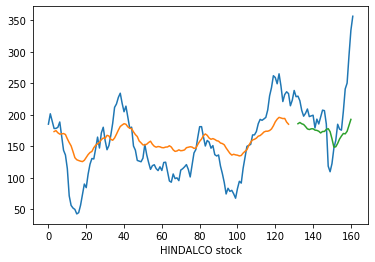

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.0558 - val_loss: 0.6682
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0525 - val_loss: 0.6467
Epoch 3/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0490 - val_loss: 0.6251
Epoch 4/20
2/2 [==============================] - 0s 39ms/step - loss: 0.0459 - val_loss: 0.6030
Epoch 5/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0427 - val_loss: 0.5802
Epoch 6/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0396 - val_loss: 0.5565
Epoch 7/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0366 - val_loss: 0.5316
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0336 - val_loss: 0.5055
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0308 - val_loss: 0.4779
Epoch 10/20
2/2 [==============================] - 0s 41ms/step - loss: 0.0282 - val_loss: 0.4488
Epoch 11/20
2/2 [==============

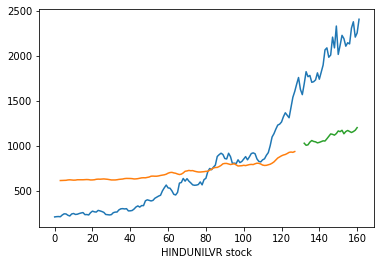

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1872 - val_loss: 0.0243
Epoch 2/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1790 - val_loss: 0.0217
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1713 - val_loss: 0.0193
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1632 - val_loss: 0.0169
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1554 - val_loss: 0.0147
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1474 - val_loss: 0.0125
Epoch 7/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1392 - val_loss: 0.0104
Epoch 8/20
2/2 [==============================] - 0s 40ms/step - loss: 0.1308 - val_loss: 0.0085
Epoch 9/20
2/2 [==============================] - 0s 55ms/step - loss: 0.1220 - val_loss: 0.0067
Epoch 10/20
2/2 [==============================] - 0s 62ms/step - loss: 0.1132 - val_loss: 0.0051
Epoch 11/20
2/2 [==============

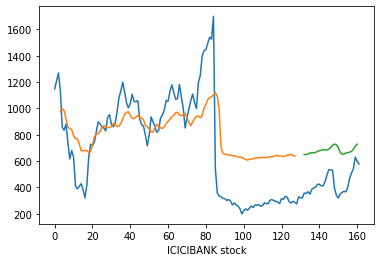

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1585 - val_loss: 0.3523
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1528 - val_loss: 0.3395
Epoch 3/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1464 - val_loss: 0.3266
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1406 - val_loss: 0.3135
Epoch 5/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1343 - val_loss: 0.3000
Epoch 6/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1280 - val_loss: 0.2860
Epoch 7/20
2/2 [==============================] - 0s 39ms/step - loss: 0.1216 - val_loss: 0.2714
Epoch 8/20
2/2 [==============================] - 0s 63ms/step - loss: 0.1154 - val_loss: 0.2560
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1085 - val_loss: 0.2397
Epoch 10/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1014 - val_loss: 0.2225
Epoch 11/20
2/2 [==============

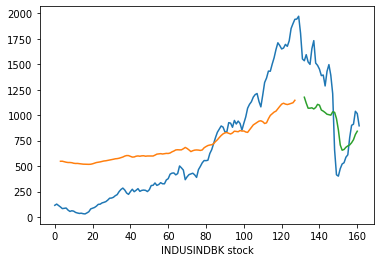

Epoch 1/20
2/2 [==============================] - 9s 2s/step - loss: 0.2323 - val_loss: 0.0059
Epoch 2/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2203 - val_loss: 0.0049
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2083 - val_loss: 0.0042
Epoch 4/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1972 - val_loss: 0.0037
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1858 - val_loss: 0.0034
Epoch 6/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1746 - val_loss: 0.0034
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1634 - val_loss: 0.0036
Epoch 8/20
2/2 [==============================] - 0s 58ms/step - loss: 0.1520 - val_loss: 0.0042
Epoch 9/20
2/2 [==============================] - 0s 57ms/step - loss: 0.1399 - val_loss: 0.0052
Epoch 10/20
2/2 [==============================] - 0s 41ms/step - loss: 0.1280 - val_loss: 0.0066
Epoch 11/20
2/2 [==============

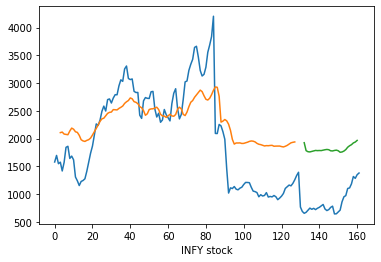

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2616 - val_loss: 0.0063
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2534 - val_loss: 0.0055
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2452 - val_loss: 0.0047
Epoch 4/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2367 - val_loss: 0.0041
Epoch 5/20
2/2 [==============================] - 0s 49ms/step - loss: 0.2282 - val_loss: 0.0035
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.2196 - val_loss: 0.0030
Epoch 7/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2105 - val_loss: 0.0026
Epoch 8/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2011 - val_loss: 0.0023
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1911 - val_loss: 0.0021
Epoch 10/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1806 - val_loss: 0.0022
Epoch 11/20
2/2 [==============

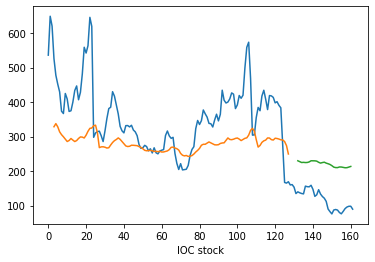

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.3004 - val_loss: 0.1418
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2901 - val_loss: 0.1352
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2798 - val_loss: 0.1286
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2690 - val_loss: 0.1219
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2582 - val_loss: 0.1150
Epoch 6/20
2/2 [==============================] - 0s 43ms/step - loss: 0.2470 - val_loss: 0.1079
Epoch 7/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2353 - val_loss: 0.1006
Epoch 8/20
2/2 [==============================] - 0s 50ms/step - loss: 0.2228 - val_loss: 0.0929
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2094 - val_loss: 0.0850
Epoch 10/20
2/2 [==============================] - 0s 42ms/step - loss: 0.1956 - val_loss: 0.0767
Epoch 11/20
2/2 [==============

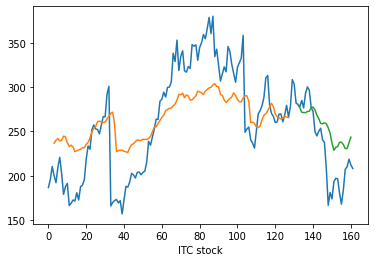

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.2213 - val_loss: 0.0058
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2133 - val_loss: 0.0049
Epoch 3/20
2/2 [==============================] - 0s 46ms/step - loss: 0.2059 - val_loss: 0.0041
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.1980 - val_loss: 0.0034
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1897 - val_loss: 0.0028
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1816 - val_loss: 0.0023
Epoch 7/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1731 - val_loss: 0.0019
Epoch 8/20
2/2 [==============================] - 0s 59ms/step - loss: 0.1640 - val_loss: 0.0016
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1544 - val_loss: 0.0015
Epoch 10/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1446 - val_loss: 0.0017
Epoch 11/20
2/2 [==============

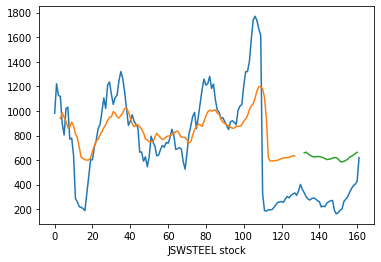

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1068 - val_loss: 0.5593
Epoch 2/20
2/2 [==============================] - 0s 59ms/step - loss: 0.1027 - val_loss: 0.5466
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0987 - val_loss: 0.5338
Epoch 4/20
2/2 [==============================] - 0s 40ms/step - loss: 0.0946 - val_loss: 0.5209
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0906 - val_loss: 0.5076
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0863 - val_loss: 0.4936
Epoch 7/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0822 - val_loss: 0.4787
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0777 - val_loss: 0.4629
Epoch 9/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0731 - val_loss: 0.4459
Epoch 10/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0682 - val_loss: 0.4277
Epoch 11/20
2/2 [==============

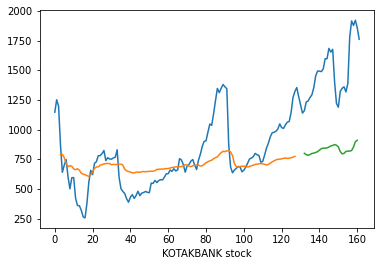

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.0796 - val_loss: 0.0327
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0757 - val_loss: 0.0303
Epoch 3/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0720 - val_loss: 0.0280
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.0681 - val_loss: 0.0257
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0644 - val_loss: 0.0235
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0607 - val_loss: 0.0212
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0569 - val_loss: 0.0190
Epoch 8/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0530 - val_loss: 0.0167
Epoch 9/20
2/2 [==============================] - 0s 42ms/step - loss: 0.0489 - val_loss: 0.0145
Epoch 10/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0447 - val_loss: 0.0124
Epoch 11/20
2/2 [==============

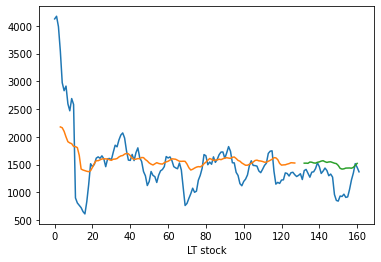

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.3822 - val_loss: 0.0867
Epoch 2/20
2/2 [==============================] - 0s 41ms/step - loss: 0.3582 - val_loss: 0.0778
Epoch 3/20
2/2 [==============================] - 0s 43ms/step - loss: 0.3358 - val_loss: 0.0692
Epoch 4/20
2/2 [==============================] - 0s 45ms/step - loss: 0.3137 - val_loss: 0.0608
Epoch 5/20
2/2 [==============================] - 0s 42ms/step - loss: 0.2908 - val_loss: 0.0527
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2676 - val_loss: 0.0448
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2444 - val_loss: 0.0372
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.2200 - val_loss: 0.0300
Epoch 9/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1963 - val_loss: 0.0234
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1707 - val_loss: 0.0175
Epoch 11/20
2/2 [==============

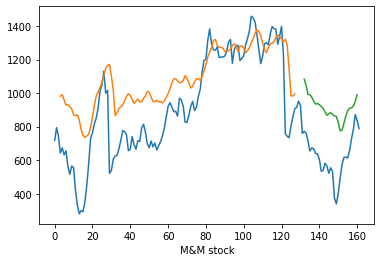

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1378 - val_loss: 0.4538
Epoch 2/20
2/2 [==============================] - 0s 69ms/step - loss: 0.1285 - val_loss: 0.4256
Epoch 3/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1193 - val_loss: 0.3970
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1111 - val_loss: 0.3679
Epoch 5/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1017 - val_loss: 0.3381
Epoch 6/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0932 - val_loss: 0.3075
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0846 - val_loss: 0.2760
Epoch 8/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0753 - val_loss: 0.2443
Epoch 9/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0680 - val_loss: 0.2118
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0598 - val_loss: 0.1794
Epoch 11/20
2/2 [==============

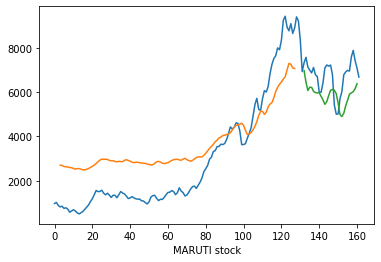

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.0344 - val_loss: 0.5843
Epoch 2/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0311 - val_loss: 0.5588
Epoch 3/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0278 - val_loss: 0.5332
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0247 - val_loss: 0.5069
Epoch 5/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0218 - val_loss: 0.4798
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0191 - val_loss: 0.4517
Epoch 7/20
2/2 [==============================] - 0s 66ms/step - loss: 0.0166 - val_loss: 0.4227
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0142 - val_loss: 0.3929
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0127 - val_loss: 0.3619
Epoch 10/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0111 - val_loss: 0.3308
Epoch 11/20
2/2 [==============

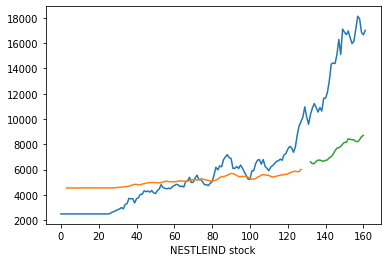

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2680 - val_loss: 0.0437
Epoch 2/20
2/2 [==============================] - 0s 50ms/step - loss: 0.2520 - val_loss: 0.0390
Epoch 3/20
2/2 [==============================] - 0s 54ms/step - loss: 0.2358 - val_loss: 0.0345
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2190 - val_loss: 0.0301
Epoch 5/20
2/2 [==============================] - 0s 44ms/step - loss: 0.2022 - val_loss: 0.0259
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1848 - val_loss: 0.0219
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1666 - val_loss: 0.0183
Epoch 8/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1484 - val_loss: 0.0150
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1293 - val_loss: 0.0123
Epoch 10/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1099 - val_loss: 0.0105
Epoch 11/20
2/2 [==============

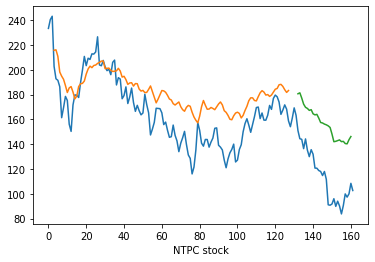

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1944 - val_loss: 0.0014
Epoch 2/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1836 - val_loss: 9.3630e-04
Epoch 3/20
2/2 [==============================] - 0s 63ms/step - loss: 0.1744 - val_loss: 6.8483e-04
Epoch 4/20
2/2 [==============================] - 0s 43ms/step - loss: 0.1649 - val_loss: 6.3082e-04
Epoch 5/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1567 - val_loss: 7.8448e-04
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1478 - val_loss: 0.0012
Epoch 7/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1391 - val_loss: 0.0018
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1304 - val_loss: 0.0028
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1212 - val_loss: 0.0041
Epoch 10/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1120 - val_loss: 0.0059
Epoch 11/20
2/2

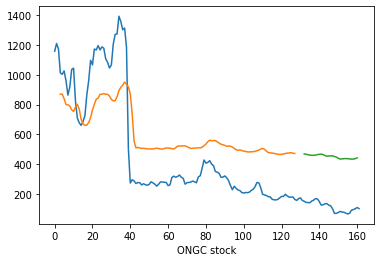

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.2018 - val_loss: 0.5929
Epoch 2/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1939 - val_loss: 0.5738
Epoch 3/20
2/2 [==============================] - 0s 65ms/step - loss: 0.1860 - val_loss: 0.5545
Epoch 4/20
2/2 [==============================] - 0s 44ms/step - loss: 0.1783 - val_loss: 0.5348
Epoch 5/20
2/2 [==============================] - 0s 68ms/step - loss: 0.1704 - val_loss: 0.5144
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1620 - val_loss: 0.4932
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1540 - val_loss: 0.4709
Epoch 8/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1447 - val_loss: 0.4475
Epoch 9/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1360 - val_loss: 0.4226
Epoch 10/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1268 - val_loss: 0.3961
Epoch 11/20
2/2 [==============

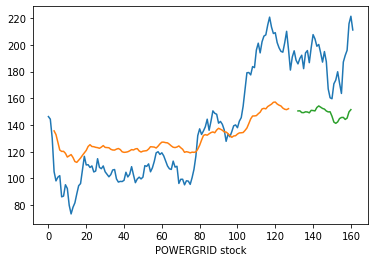

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0793 - val_loss: 0.1776
Epoch 2/20
2/2 [==============================] - 0s 68ms/step - loss: 0.0743 - val_loss: 0.1678
Epoch 3/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0699 - val_loss: 0.1582
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0651 - val_loss: 0.1487
Epoch 5/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0610 - val_loss: 0.1389
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.0564 - val_loss: 0.1290
Epoch 7/20
2/2 [==============================] - 0s 44ms/step - loss: 0.0524 - val_loss: 0.1189
Epoch 8/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0476 - val_loss: 0.1087
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0438 - val_loss: 0.0983
Epoch 10/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0403 - val_loss: 0.0877
Epoch 11/20
2/2 [==============

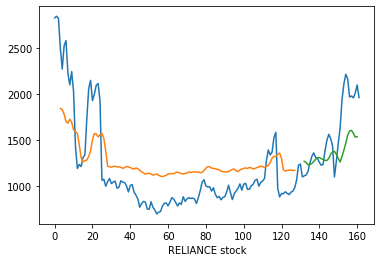

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.2567 - val_loss: 0.0011
Epoch 2/20
2/2 [==============================] - 0s 51ms/step - loss: 0.2430 - val_loss: 6.1318e-04
Epoch 3/20
2/2 [==============================] - 0s 55ms/step - loss: 0.2289 - val_loss: 4.0201e-04
Epoch 4/20
2/2 [==============================] - 0s 50ms/step - loss: 0.2155 - val_loss: 4.6980e-04
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.2017 - val_loss: 8.5520e-04
Epoch 6/20
2/2 [==============================] - 0s 55ms/step - loss: 0.1871 - val_loss: 0.0016
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1737 - val_loss: 0.0028
Epoch 8/20
2/2 [==============================] - 0s 62ms/step - loss: 0.1587 - val_loss: 0.0045
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1440 - val_loss: 0.0068
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1298 - val_loss: 0.0099
Epoch 11/20
2/2

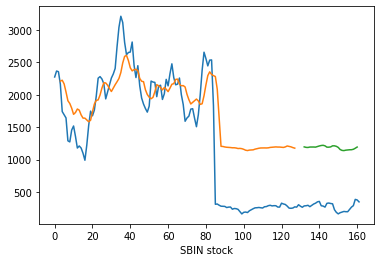

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.0894 - val_loss: 0.4710
Epoch 2/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0851 - val_loss: 0.4549
Epoch 3/20
2/2 [==============================] - 0s 68ms/step - loss: 0.0808 - val_loss: 0.4384
Epoch 4/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0766 - val_loss: 0.4212
Epoch 5/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0723 - val_loss: 0.4034
Epoch 6/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0680 - val_loss: 0.3847
Epoch 7/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0637 - val_loss: 0.3650
Epoch 8/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0596 - val_loss: 0.3440
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0548 - val_loss: 0.3218
Epoch 10/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0506 - val_loss: 0.2980
Epoch 11/20
2/2 [==============

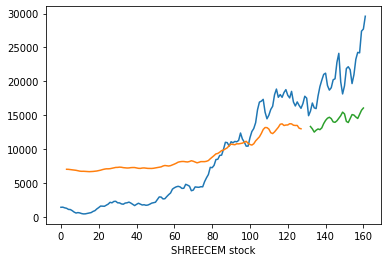

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1399 - val_loss: 0.0041
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1330 - val_loss: 0.0033
Epoch 3/20
2/2 [==============================] - 0s 87ms/step - loss: 0.1264 - val_loss: 0.0026
Epoch 4/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1195 - val_loss: 0.0020
Epoch 5/20
2/2 [==============================] - 0s 52ms/step - loss: 0.1129 - val_loss: 0.0016
Epoch 6/20
2/2 [==============================] - 0s 70ms/step - loss: 0.1063 - val_loss: 0.0014
Epoch 7/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0999 - val_loss: 0.0014
Epoch 8/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0926 - val_loss: 0.0016
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0863 - val_loss: 0.0022
Epoch 10/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0787 - val_loss: 0.0031
Epoch 11/20
2/2 [==============

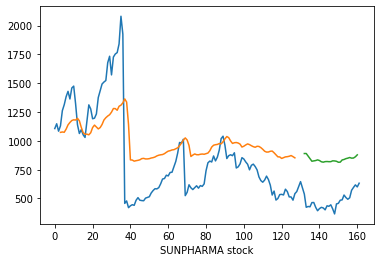

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1563 - val_loss: 0.0060
Epoch 2/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1478 - val_loss: 0.0048
Epoch 3/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1389 - val_loss: 0.0039
Epoch 4/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1309 - val_loss: 0.0031
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1227 - val_loss: 0.0025
Epoch 6/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1144 - val_loss: 0.0021
Epoch 7/20
2/2 [==============================] - 0s 53ms/step - loss: 0.1061 - val_loss: 0.0020
Epoch 8/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0975 - val_loss: 0.0022
Epoch 9/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0887 - val_loss: 0.0028
Epoch 10/20
2/2 [==============================] - 0s 46ms/step - loss: 0.0805 - val_loss: 0.0038
Epoch 11/20
2/2 [==============

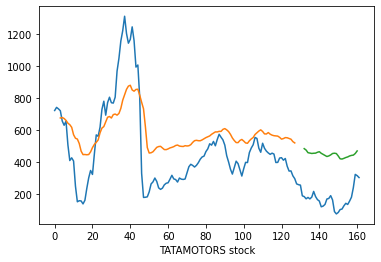

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1803 - val_loss: 0.1612
Epoch 2/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1703 - val_loss: 0.1517
Epoch 3/20
2/2 [==============================] - 0s 61ms/step - loss: 0.1606 - val_loss: 0.1422
Epoch 4/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1510 - val_loss: 0.1327
Epoch 5/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1411 - val_loss: 0.1232
Epoch 6/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1310 - val_loss: 0.1134
Epoch 7/20
2/2 [==============================] - 0s 45ms/step - loss: 0.1206 - val_loss: 0.1036
Epoch 8/20
2/2 [==============================] - 0s 50ms/step - loss: 0.1104 - val_loss: 0.0935
Epoch 9/20
2/2 [==============================] - 0s 65ms/step - loss: 0.0999 - val_loss: 0.0834
Epoch 10/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0888 - val_loss: 0.0732
Epoch 11/20
2/2 [==============

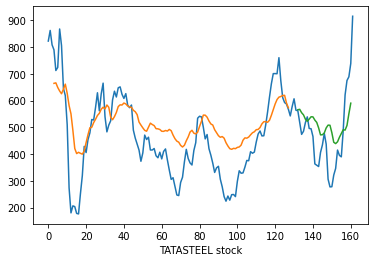

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2360 - val_loss: 0.3648
Epoch 2/20
2/2 [==============================] - 0s 69ms/step - loss: 0.2236 - val_loss: 0.3464
Epoch 3/20
2/2 [==============================] - 0s 50ms/step - loss: 0.2119 - val_loss: 0.3280
Epoch 4/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1997 - val_loss: 0.3094
Epoch 5/20
2/2 [==============================] - 0s 66ms/step - loss: 0.1875 - val_loss: 0.2903
Epoch 6/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1745 - val_loss: 0.2707
Epoch 7/20
2/2 [==============================] - 0s 46ms/step - loss: 0.1628 - val_loss: 0.2504
Epoch 8/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1496 - val_loss: 0.2292
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1361 - val_loss: 0.2071
Epoch 10/20
2/2 [==============================] - 0s 56ms/step - loss: 0.1222 - val_loss: 0.1842
Epoch 11/20
2/2 [==============

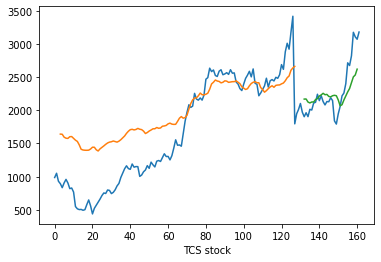

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.1040 - val_loss: 0.0360
Epoch 2/20
2/2 [==============================] - 0s 71ms/step - loss: 0.0968 - val_loss: 0.0315
Epoch 3/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0908 - val_loss: 0.0272
Epoch 4/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0842 - val_loss: 0.0232
Epoch 5/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0782 - val_loss: 0.0193
Epoch 6/20
2/2 [==============================] - 0s 68ms/step - loss: 0.0722 - val_loss: 0.0157
Epoch 7/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0666 - val_loss: 0.0123
Epoch 8/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0611 - val_loss: 0.0093
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0554 - val_loss: 0.0066
Epoch 10/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0500 - val_loss: 0.0045
Epoch 11/20
2/2 [==============

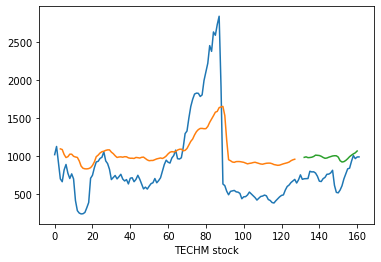

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.0924 - val_loss: 0.0633
Epoch 2/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0895 - val_loss: 0.0598
Epoch 3/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0864 - val_loss: 0.0563
Epoch 4/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0839 - val_loss: 0.0529
Epoch 5/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0809 - val_loss: 0.0496
Epoch 6/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0785 - val_loss: 0.0462
Epoch 7/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0759 - val_loss: 0.0428
Epoch 8/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0732 - val_loss: 0.0394
Epoch 9/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0704 - val_loss: 0.0360
Epoch 10/20
2/2 [==============================] - 0s 56ms/step - loss: 0.0678 - val_loss: 0.0325
Epoch 11/20
2/2 [==============

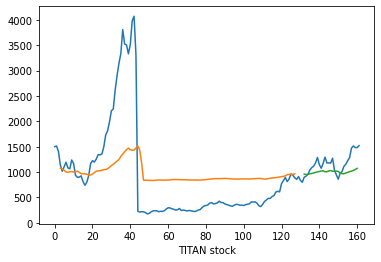

Epoch 1/20
2/2 [==============================] - 8s 1s/step - loss: 0.1114 - val_loss: 0.4030
Epoch 2/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1057 - val_loss: 0.3881
Epoch 3/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1002 - val_loss: 0.3733
Epoch 4/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0950 - val_loss: 0.3583
Epoch 5/20
2/2 [==============================] - 0s 61ms/step - loss: 0.0895 - val_loss: 0.3430
Epoch 6/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0842 - val_loss: 0.3271
Epoch 7/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0787 - val_loss: 0.3105
Epoch 8/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0734 - val_loss: 0.2930
Epoch 9/20
2/2 [==============================] - 0s 51ms/step - loss: 0.0674 - val_loss: 0.2745
Epoch 10/20
2/2 [==============================] - 0s 54ms/step - loss: 0.0614 - val_loss: 0.2549
Epoch 11/20
2/2 [==============

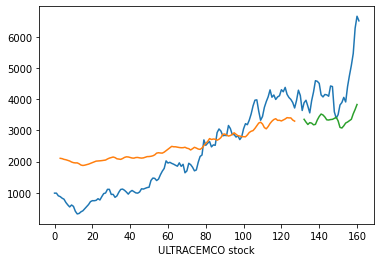

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.0884 - val_loss: 0.0551
Epoch 2/20
2/2 [==============================] - 0s 67ms/step - loss: 0.0829 - val_loss: 0.0502
Epoch 3/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0776 - val_loss: 0.0454
Epoch 4/20
2/2 [==============================] - 0s 70ms/step - loss: 0.0721 - val_loss: 0.0405
Epoch 5/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0664 - val_loss: 0.0357
Epoch 6/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0608 - val_loss: 0.0309
Epoch 7/20
2/2 [==============================] - 0s 59ms/step - loss: 0.0550 - val_loss: 0.0261
Epoch 8/20
2/2 [==============================] - 0s 59ms/step - loss: 0.0493 - val_loss: 0.0214
Epoch 9/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0437 - val_loss: 0.0169
Epoch 10/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0381 - val_loss: 0.0125
Epoch 11/20
2/2 [==============

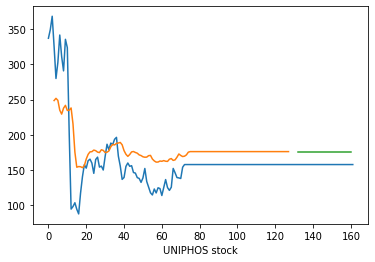

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.1166 - val_loss: 0.3241
Epoch 2/20
2/2 [==============================] - 0s 52ms/step - loss: 0.1120 - val_loss: 0.3122
Epoch 3/20
2/2 [==============================] - 0s 61ms/step - loss: 0.1079 - val_loss: 0.3001
Epoch 4/20
2/2 [==============================] - 0s 51ms/step - loss: 0.1036 - val_loss: 0.2878
Epoch 5/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0992 - val_loss: 0.2752
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.0950 - val_loss: 0.2620
Epoch 7/20
2/2 [==============================] - 0s 57ms/step - loss: 0.0905 - val_loss: 0.2484
Epoch 8/20
2/2 [==============================] - 0s 62ms/step - loss: 0.0864 - val_loss: 0.2340
Epoch 9/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0819 - val_loss: 0.2188
Epoch 10/20
2/2 [==============================] - 0s 60ms/step - loss: 0.0775 - val_loss: 0.2028
Epoch 11/20
2/2 [==============

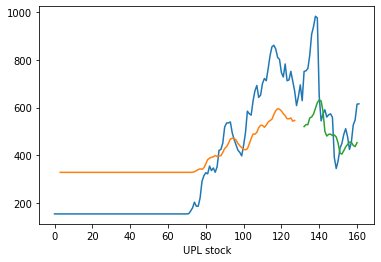

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.0357 - val_loss: 2.1128e-04
Epoch 2/20
2/2 [==============================] - 0s 50ms/step - loss: 0.0341 - val_loss: 9.3921e-05
Epoch 3/20
2/2 [==============================] - 0s 49ms/step - loss: 0.0324 - val_loss: 1.0649e-04
Epoch 4/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0312 - val_loss: 2.5309e-04
Epoch 5/20
2/2 [==============================] - 0s 52ms/step - loss: 0.0299 - val_loss: 5.3739e-04
Epoch 6/20
2/2 [==============================] - 0s 53ms/step - loss: 0.0286 - val_loss: 9.4102e-04
Epoch 7/20
2/2 [==============================] - 0s 58ms/step - loss: 0.0277 - val_loss: 0.0015
Epoch 8/20
2/2 [==============================] - 0s 55ms/step - loss: 0.0271 - val_loss: 0.0021
Epoch 9/20
2/2 [==============================] - 0s 64ms/step - loss: 0.0264 - val_loss: 0.0029
Epoch 10/20
2/2 [==============================] - 0s 48ms/step - loss: 0.0257 - val_loss: 0.0036
Epoch 1

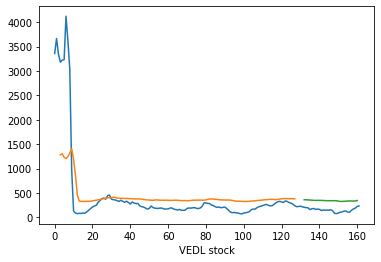

Epoch 1/20
2/2 [==============================] - 8s 2s/step - loss: 0.3049 - val_loss: 0.0533
Epoch 2/20
2/2 [==============================] - 0s 48ms/step - loss: 0.2936 - val_loss: 0.0498
Epoch 3/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2819 - val_loss: 0.0465
Epoch 4/20
2/2 [==============================] - 0s 57ms/step - loss: 0.2704 - val_loss: 0.0432
Epoch 5/20
2/2 [==============================] - 0s 49ms/step - loss: 0.2589 - val_loss: 0.0400
Epoch 6/20
2/2 [==============================] - 0s 65ms/step - loss: 0.2472 - val_loss: 0.0368
Epoch 7/20
2/2 [==============================] - 0s 49ms/step - loss: 0.2349 - val_loss: 0.0337
Epoch 8/20
2/2 [==============================] - 0s 59ms/step - loss: 0.2225 - val_loss: 0.0306
Epoch 9/20
2/2 [==============================] - 0s 52ms/step - loss: 0.2092 - val_loss: 0.0276
Epoch 10/20
2/2 [==============================] - 0s 57ms/step - loss: 0.1958 - val_loss: 0.0246
Epoch 11/20
2/2 [==============

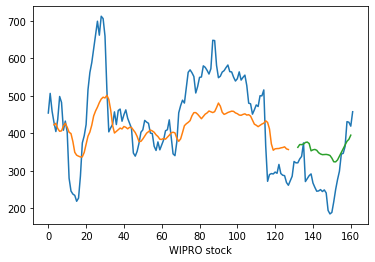

Epoch 1/20
2/2 [==============================] - 7s 1s/step - loss: 0.2448 - val_loss: 0.1764
Epoch 2/20
2/2 [==============================] - 0s 69ms/step - loss: 0.2358 - val_loss: 0.1685
Epoch 3/20
2/2 [==============================] - 0s 52ms/step - loss: 0.2269 - val_loss: 0.1607
Epoch 4/20
2/2 [==============================] - 0s 49ms/step - loss: 0.2183 - val_loss: 0.1530
Epoch 5/20
2/2 [==============================] - 0s 48ms/step - loss: 0.2093 - val_loss: 0.1453
Epoch 6/20
2/2 [==============================] - 0s 47ms/step - loss: 0.2010 - val_loss: 0.1374
Epoch 7/20
2/2 [==============================] - 0s 47ms/step - loss: 0.1920 - val_loss: 0.1293
Epoch 8/20
2/2 [==============================] - 0s 49ms/step - loss: 0.1827 - val_loss: 0.1211
Epoch 9/20
2/2 [==============================] - 0s 68ms/step - loss: 0.1731 - val_loss: 0.1125
Epoch 10/20
2/2 [==============================] - 0s 48ms/step - loss: 0.1633 - val_loss: 0.1037
Epoch 11/20
2/2 [==============

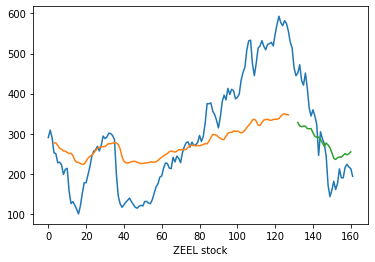

In [ ]:
for i in df_2.columns:
    scaler=MinMaxScaler(feature_range=(0,1))
    df_21=scaler.fit_transform(np.array(df_2[i]).reshape(-1,1))


    train_data,test_data=df_21[0:129],df_21[129:len(df_2)]

    time_step = 3
    X_train, y_train = create_dataset(train_data, time_step)
    X_test, ytest = create_dataset(test_data, time_step)
    model=Sequential()
    model.add(LSTM(50,return_sequences=True,input_shape=(3,1)))
    model.add(LSTM(25,return_sequences=True))

    model.add(LSTM(5))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error',optimizer='adam')
    model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=20,batch_size=64,verbose=1)
    train_predict=model.predict(X_train)
    test_predict=model.predict(X_test)



    train_predict=scaler.inverse_transform(train_predict)
    test_predict=scaler.inverse_transform(test_predict)
    mae = metrics.mean_absolute_error(ytest,test_predict)
    mse = metrics.mean_squared_error(ytest,test_predict)
    rmse = np.sqrt(mse) #mse**(0.5)
    error_ls.append(mae)
    print("Results of sklearn.metrics:")
    print("MAE:",mae)
    print("RMSE:", rmse)

    look_back=3
    trainPredictPlot = np.empty_like(df_21)
    trainPredictPlot[:, :] = np.nan
    trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
    # shift test predictions for plotting
    testPredictPlot = np.empty_like(df_21)
    testPredictPlot[:, :] = np.nan
    testPredictPlot[len(train_predict)+(look_back*2)+1:len(df_21)-1, :] = test_predict
    # plot baseline and predictions
    plt.plot(scaler.inverse_transform(df_21))
    plt.plot(trainPredictPlot)
    plt.plot(testPredictPlot)
    plt.xlabel(i+' stock')
    plt.show()

# Comparisons
Now we have to compare these various models and see  how they perform on all the comapnies data. we use any 5 comapnaies for the same :

We use the first 5 companies in the set for this to observe the rmse and rae for them.

In [ ]:
any=['ADANIPORTS','AXISBANK','BAJAJFINSV','INDUSINDBK','HINDALCO','BPCL']
# check for all in TCS use graphs and errors only
any1=df.columns[1:6]
any1

Index(['ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BAJAJFINSV', 'BAJFINANCE'], dtype='object')

In [ ]:
Comaparison=pd.DataFrame(
                                 { 'Fbprophet': error_fb[0:6],
                                  'ARIMA': error_ar[0:6],
                                  'RNN': error_rnn[0:6],
                                  'LSTM': error_ls[0:6]
                    },
                                 index=['ADANIPORTS','ASIANPAINT', 'AXISBANK', 'BAJAJ-AUTO', 'BAJAJFINSV', 'BAJFINANCE'])
Comaparison

,Fbprophet,ARIMA,RNN,LSTM
ADANIPORTS,1.685281e+04,2.354170e+04,1.268583e+05,1.486478e+05
ASIANPAINT,9.909110e+04,2.131763e+05,3.902846e+06,4.249851e+06
AXISBANK,1.171432e+05,5.065752e+04,5.257901e+05,7.848886e+05
BAJAJ-AUTO,3.143021e+05,2.629363e+05,6.022541e+06,6.467533e+06
BAJAJFINSV,9.861908e+06,9.983085e+06,6.698550e+05,1.305869e+07
BAJFINANCE,2.273963e+06,1.190809e+06,4.915579e+06,8.041970e+06


The ukraine war started around feb 20, 2022. so that time period is covered in the predictions for all of the 4 models.
We see that the predictions for this time are not as accurate as it was an unprecedented event and created many new variables.which are not available in this datset. so these models were not trained on that data and could not give appropriate predictions for the vast changes in the stock.